<h1 style="font-family: 'Times New Roman'; text-align: center; font-weight: bold;">
    Relative Abundance Analysis of coxL Gene Carriers
</h1></p>

<div style="font-family: 'Times New Roman'; font-size: 15px; text-align: justify; width: 100%;">
  <div>
    <span style="display: inline-block; width: 100px;"><b>Date</b></span>: 20<sup>th</sup> March 2025
  </div>
  <div>
    <span style="display: inline-block; width: 100px;"><b>Author</b></span>: Deepan Kanagarajan Babu
  </div>
  <div>
    <span style="display: inline-block; width: 100px;"><b>Description</b></span>: In this document, the Relative Abundance (RA) of all Metagenomic Assembled Genomes (MAGs) with coxL gene carrying MAGs were analysed. Following that, the correlation of RA with the concentration of lignin precursors were studing to find the lignin precursors and scopoletin's role in shaping carbon-monoxide dehydrogenase prokrayotes structure and composition in rice phyllosphere. The RA is calculated using CoverM program in High-performace computer using Linux command lines. The output file is processed in this document.
  </div>
</div>

<h2 style="font-family: 'Times New Roman'; font-weight: bold;">
    Required Libraries
</h2>

In [1]:
import pandas as pd
import os
from scipy import stats
from scipy.stats import mannwhitneyu
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import cm
from matplotlib.colors import LinearSegmentedColormap, BoundaryNorm
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.patches as mpatches
import matplotlib.font_manager as fm

<h2 style="font-family: 'Times New Roman'; font-weight: bold;">
    Required Functions
</h2>

In [2]:
# Defining single function to open multiple file formats (.csv, .txt, .fasta or .fastq (to display only 1st 100 lines), and .xlsx)
def open_file(file_path):
    if file_path.endswith('.csv'):
        # Read CSV file
        data = pd.read_csv(file_path)
        return data
    elif file_path.endswith('.txt'):
        # Read TXT file
        try:
            with open(file_path, 'r') as file:
                data = file.read()
            return data
        except FileNotFoundError:
            raise FileNotFoundError(f"The file {file_path} does not exist.")
    elif file_path.endswith(('.fasta', '.fastq')):
        # Read FASTA or FASTQ file
        try:
            with open(file_path, 'r') as file:
                data = []
                for _ in range(100):
                    line = file.readline()
                    if not line:
                        break
                    data.append(line.strip())
            return data
        except FileNotFoundError:
            raise FileNotFoundError(f"The file {file_path} does not exist.")
    elif file_path.endswith('.xlsx'):
        # Read XLSX file
        try:
            data = pd.read_excel(file_path)
            return data
        except FileNotFoundError:
            raise FileNotFoundError(f"The file {file_path} does not exist.")
    else:
        raise ValueError("Unsupported file format")

In [3]:
# Function to clean headers
def clean_headers(df):
    df.columns = df.columns.str.replace('_1.fastq Relative Abundance (%)', '')
    df.columns = df.columns.str.replace('.fastq Relative Abundance (%)', '')
    return df

In [4]:
def columns_average(df, result_df, columns1, columns2, new_column1, new_column2):
    result_df[new_column1] = df[columns1].mean(axis=1)
    result_df[new_column2] = df[columns2].mean(axis=1)
    return result_df

<h2 style="font-family: 'Times New Roman'; font-weight: bold;">
    Required Files and Paths
</h2>

In [5]:
group_path = 'C:\\Users\\dkb1g24\\Documents\\mres\\Raw_Data\\group.csv'
filtered_mag_path = 'C:\\Users\\dkb1g24\\Documents\\mres\\Raw_Data\\filtered_mag.csv'

In [6]:
batch1 = pd.read_csv('batch1.tsv', sep='\t')
batch2 = pd.read_csv('batch2.tsv', sep='\t')
batch3 = pd.read_csv('batch3.tsv', sep='\t')
batch4 = pd.read_csv('batch4.tsv', sep='\t')
batch5 = pd.read_csv('batch5.tsv', sep='\t')
batch6 = pd.read_csv('batch6.tsv', sep='\t')
batch7 = pd.read_csv('batch7.tsv', sep='\t')
batch8 = pd.read_csv('batch8.tsv', sep='\t')
batch9 = pd.read_csv('batch9.tsv', sep='\t')
batch10 = pd.read_csv('batch10.tsv', sep='\t')
batch11 = pd.read_csv('batch11.tsv', sep='\t')
batch12 = pd.read_csv('batch12.tsv', sep='\t')
batch13 = pd.read_csv('batch13.tsv', sep='\t')
batch14 = pd.read_csv('batch14.tsv', sep='\t')
batch15 = pd.read_csv('batch15.tsv', sep='\t')
batch16 = pd.read_csv('batch16.tsv', sep='\t')
batch17 = pd.read_csv('batch17.tsv', sep='\t')
batch18 = pd.read_csv('batch18.tsv', sep='\t')
batch19 = pd.read_csv('batch19.tsv', sep='\t')
batch20 = pd.read_csv('batch20.tsv', sep='\t')
batch21 = pd.read_csv('batch21.tsv', sep='\t')
batch22 = pd.read_csv('batch22.tsv', sep='\t')
batch23 = pd.read_csv('batch23.tsv', sep='\t')
batch24 = pd.read_csv('batch24.tsv', sep='\t')
batch25 = pd.read_csv('batch25.tsv', sep='\t')
batch26 = pd.read_csv('batch26.tsv', sep='\t')
batch27 = pd.read_csv('batch27.tsv', sep='\t')
batch28 = pd.read_csv('batch28.tsv', sep='\t')
batch29 = pd.read_csv('batch29.tsv', sep='\t')

In [13]:
batch1

,Genome,ERR6050321_1.fastq Relative Abundance (%),ERR6050322_1.fastq Relative Abundance (%),ERR6050323_1.fastq Relative Abundance (%),ERR6050324_1.fastq Relative Abundance (%),ERR6050325_1.fastq Relative Abundance (%),ERR6050326_1.fastq Relative Abundance (%),ERR6050327_1.fastq Relative Abundance (%),ERR6050328_1.fastq Relative Abundance (%),ERR6050329_1.fastq Relative Abundance (%),ERR6050330_1.fastq Relative Abundance (%)
0,unmapped,6.183559,15.178233,11.346579,9.351004,8.905262,57.412613,44.216846,12.911839,8.117580,9.463710
1,uncultured_Sphingomonas_sp._ERS6626783,0.000000,0.000000,0.017321,0.000000,0.167018,0.132595,0.031797,0.000000,0.251217,0.217020
2,uncultured_Pseudomonas_sp._ERS6626560,0.076898,0.162566,0.053864,0.230631,0.034397,0.031363,0.000000,0.000000,0.042382,0.462489
3,uncultured_Chryseobacterium_sp._ERS6626743,0.000000,0.000000,0.000000,0.036411,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,uncultured_Ochrobactrum_sp._ERS6627020,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.284596
...,...,...,...,...,...,...,...,...,...,...,...
565,uncultured_Acidovorax_sp._ERS6626918,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
566,uncultured_Mucilaginibacter_sp._ERS6626972,0.000000,0.000000,0.010789,0.000000,0.000000,0.060644,0.000000,0.000000,0.165176,0.024695
567,uncultured_Acinetobacter_sp._ERS6626625,1.206458,0.063111,0.029889,0.652187,1.075689,0.012135,0.000000,0.042921,0.040402,0.111243
568,uncultured_Paenibacillus_sp._ERS6627323,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [15]:
batch10

,Genome,ERR6050427_1.fastq Relative Abundance (%),ERR6050428_1.fastq Relative Abundance (%),ERR6050429_1.fastq Relative Abundance (%),ERR6050430_1.fastq Relative Abundance (%),ERR6050431_1.fastq Relative Abundance (%),ERR6050433_1.fastq Relative Abundance (%),ERR6050434_1.fastq Relative Abundance (%),ERR6050435_1.fastq Relative Abundance (%),ERR6050436_1.fastq Relative Abundance (%),ERR6050437_1.fastq Relative Abundance (%)
0,unmapped,16.406440,9.302246,6.141156,6.977809,6.180084,11.248713,9.658164,8.877897,57.759674,44.100540
1,uncultured_Sphingomonas_sp._ERS6626783,0.014268,0.161301,0.000000,0.000000,0.000000,0.017189,0.000000,0.166726,0.130352,0.032981
2,uncultured_Pseudomonas_sp._ERS6626560,0.188814,0.101714,0.000000,0.000000,0.080486,0.054479,0.230143,0.035085,0.030635,0.000000
3,uncultured_Chryseobacterium_sp._ERS6626743,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.040485,0.000000,0.000000,0.000000
4,uncultured_Ochrobactrum_sp._ERS6627020,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...
565,uncultured_Acidovorax_sp._ERS6626918,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
566,uncultured_Mucilaginibacter_sp._ERS6626972,0.000000,0.000000,0.000000,0.000000,0.000000,0.010254,0.000000,0.000000,0.060836,0.000000
567,uncultured_Acinetobacter_sp._ERS6626625,1.754679,0.038918,1.775264,1.777024,1.192074,0.029260,0.650564,1.075783,0.000000,0.000000
568,uncultured_Paenibacillus_sp._ERS6627323,0.067562,0.076777,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [17]:
batch28

,Genome,ERR6050332.fastq Relative Abundance (%),ERR6050341.fastq Relative Abundance (%),ERR6050342.fastq Relative Abundance (%),ERR6050345.fastq Relative Abundance (%),ERR6050346.fastq Relative Abundance (%),ERR6050451.fastq Relative Abundance (%),ERR6050452.fastq Relative Abundance (%),ERR6050455.fastq Relative Abundance (%),ERR6050456.fastq Relative Abundance (%),ERR6050552.fastq Relative Abundance (%)
0,unmapped,11.076582,10.248507,28.635538,26.032114,16.351646,10.145098,28.195213,25.980585,16.861755,9.792900
1,uncultured_Sphingomonas_sp._ERS6626783,0.108736,0.022251,0.099694,0.366874,0.109411,0.021980,0.098263,0.363786,0.105330,0.137144
2,uncultured_Pseudomonas_sp._ERS6626560,0.000000,0.464967,0.054500,0.364669,0.022981,0.461383,0.054091,0.353353,0.023200,0.000000
3,uncultured_Chryseobacterium_sp._ERS6626743,0.041183,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.031736
4,uncultured_Ochrobactrum_sp._ERS6627020,0.106024,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.131185
...,...,...,...,...,...,...,...,...,...,...,...
565,uncultured_Acidovorax_sp._ERS6626918,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
566,uncultured_Mucilaginibacter_sp._ERS6626972,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
567,uncultured_Acinetobacter_sp._ERS6626625,0.083050,0.449169,0.599921,0.040154,0.760433,0.451774,0.600277,0.039616,0.755419,0.041888
568,uncultured_Paenibacillus_sp._ERS6627323,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


<h2 style="font-family: 'Times New Roman'; font-weight: bold;">
    Analysis of Relative Abundance Data
</h2>

In [19]:
coverm = batch1.merge(batch2, on='Genome').merge(batch3, on='Genome').merge(batch4, on='Genome').merge(batch5, on='Genome').merge(batch6, on='Genome').merge(batch7, on='Genome').merge(batch8, on='Genome').merge(batch9, on='Genome').merge(batch10, on='Genome').merge(batch11, on='Genome').merge(batch12, on='Genome').merge(batch13, on='Genome').merge(batch14, on='Genome').merge(batch15, on='Genome').merge(batch16, on='Genome').merge(batch17, on='Genome').merge(batch18, on='Genome').merge(batch19, on='Genome').merge(batch20, on='Genome').merge(batch21, on='Genome').merge(batch22, on='Genome').merge(batch23, on='Genome').merge(batch24, on='Genome').merge(batch25, on='Genome').merge(batch26, on='Genome').merge(batch27, on='Genome').merge(batch28, on='Genome').merge(batch29, on='Genome')
coverm

,Genome,ERR6050321_1.fastq Relative Abundance (%),ERR6050322_1.fastq Relative Abundance (%),ERR6050323_1.fastq Relative Abundance (%),ERR6050324_1.fastq Relative Abundance (%),ERR6050325_1.fastq Relative Abundance (%),ERR6050326_1.fastq Relative Abundance (%),ERR6050327_1.fastq Relative Abundance (%),ERR6050328_1.fastq Relative Abundance (%),ERR6050329_1.fastq Relative Abundance (%),...,ERR6050451.fastq Relative Abundance (%),ERR6050452.fastq Relative Abundance (%),ERR6050455.fastq Relative Abundance (%),ERR6050456.fastq Relative Abundance (%),ERR6050552.fastq Relative Abundance (%),ERR6050462.fastq Relative Abundance (%),ERR6050561.fastq Relative Abundance (%),ERR6050562.fastq Relative Abundance (%),ERR6050566.fastq Relative Abundance (%),ERR6050572.fastq Relative Abundance (%)
0,unmapped,6.183559,15.178233,11.346579,9.351004,8.905262,57.412613,44.216846,12.911839,8.117580,...,10.145098,28.195213,25.980585,16.861755,9.792900,44.526850,10.206765,27.902555,17.127388,43.388400
1,uncultured_Sphingomonas_sp._ERS6626783,0.000000,0.000000,0.017321,0.000000,0.167018,0.132595,0.031797,0.000000,0.251217,...,0.021980,0.098263,0.363786,0.105330,0.137144,1.448191,0.020219,0.099292,0.106175,1.589051
2,uncultured_Pseudomonas_sp._ERS6626560,0.076898,0.162566,0.053864,0.230631,0.034397,0.031363,0.000000,0.000000,0.042382,...,0.461383,0.054091,0.353353,0.023200,0.000000,0.152745,0.454378,0.054058,0.022382,0.152169
3,uncultured_Chryseobacterium_sp._ERS6626743,0.000000,0.000000,0.000000,0.036411,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.031736,0.000000,0.000000,0.000000,0.000000,0.000000
4,uncultured_Ochrobactrum_sp._ERS6627020,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.131185,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
565,uncultured_Acidovorax_sp._ERS6626918,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
566,uncultured_Mucilaginibacter_sp._ERS6626972,0.000000,0.000000,0.010789,0.000000,0.000000,0.060644,0.000000,0.000000,0.165176,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.020966,0.000000,0.000000,0.000000,0.020311
567,uncultured_Acinetobacter_sp._ERS6626625,1.206458,0.063111,0.029889,0.652187,1.075689,0.012135,0.000000,0.042921,0.040402,...,0.451774,0.600277,0.039616,0.755419,0.041888,0.022457,0.456721,0.600947,0.753895,0.021178
568,uncultured_Paenibacillus_sp._ERS6627323,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [20]:
# Format header in data frame
coverm = clean_headers(coverm)
coverm

,Genome,ERR6050321,ERR6050322,ERR6050323,ERR6050324,ERR6050325,ERR6050326,ERR6050327,ERR6050328,ERR6050329,...,ERR6050451,ERR6050452,ERR6050455,ERR6050456,ERR6050552,ERR6050462,ERR6050561,ERR6050562,ERR6050566,ERR6050572
0,unmapped,6.183559,15.178233,11.346579,9.351004,8.905262,57.412613,44.216846,12.911839,8.117580,...,10.145098,28.195213,25.980585,16.861755,9.792900,44.526850,10.206765,27.902555,17.127388,43.388400
1,uncultured_Sphingomonas_sp._ERS6626783,0.000000,0.000000,0.017321,0.000000,0.167018,0.132595,0.031797,0.000000,0.251217,...,0.021980,0.098263,0.363786,0.105330,0.137144,1.448191,0.020219,0.099292,0.106175,1.589051
2,uncultured_Pseudomonas_sp._ERS6626560,0.076898,0.162566,0.053864,0.230631,0.034397,0.031363,0.000000,0.000000,0.042382,...,0.461383,0.054091,0.353353,0.023200,0.000000,0.152745,0.454378,0.054058,0.022382,0.152169
3,uncultured_Chryseobacterium_sp._ERS6626743,0.000000,0.000000,0.000000,0.036411,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.031736,0.000000,0.000000,0.000000,0.000000,0.000000
4,uncultured_Ochrobactrum_sp._ERS6627020,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.131185,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
565,uncultured_Acidovorax_sp._ERS6626918,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
566,uncultured_Mucilaginibacter_sp._ERS6626972,0.000000,0.000000,0.010789,0.000000,0.000000,0.060644,0.000000,0.000000,0.165176,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.020966,0.000000,0.000000,0.000000,0.020311
567,uncultured_Acinetobacter_sp._ERS6626625,1.206458,0.063111,0.029889,0.652187,1.075689,0.012135,0.000000,0.042921,0.040402,...,0.451774,0.600277,0.039616,0.755419,0.041888,0.022457,0.456721,0.600947,0.753895,0.021178
568,uncultured_Paenibacillus_sp._ERS6627323,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [23]:
# Assuming the dataframe is called df and the column to be modified is 'Column1'
coverm['Genome'] = coverm['Genome'].str.replace('^uncultured_', '', regex=True)

# Print the updated DataFrame
coverm

,Genome,ERR6050321,ERR6050322,ERR6050323,ERR6050324,ERR6050325,ERR6050326,ERR6050327,ERR6050328,ERR6050329,...,ERR6050451,ERR6050452,ERR6050455,ERR6050456,ERR6050552,ERR6050462,ERR6050561,ERR6050562,ERR6050566,ERR6050572
0,unmapped,6.183559,15.178233,11.346579,9.351004,8.905262,57.412613,44.216846,12.911839,8.117580,...,10.145098,28.195213,25.980585,16.861755,9.792900,44.526850,10.206765,27.902555,17.127388,43.388400
1,Sphingomonas_sp._ERS6626783,0.000000,0.000000,0.017321,0.000000,0.167018,0.132595,0.031797,0.000000,0.251217,...,0.021980,0.098263,0.363786,0.105330,0.137144,1.448191,0.020219,0.099292,0.106175,1.589051
2,Pseudomonas_sp._ERS6626560,0.076898,0.162566,0.053864,0.230631,0.034397,0.031363,0.000000,0.000000,0.042382,...,0.461383,0.054091,0.353353,0.023200,0.000000,0.152745,0.454378,0.054058,0.022382,0.152169
3,Chryseobacterium_sp._ERS6626743,0.000000,0.000000,0.000000,0.036411,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.031736,0.000000,0.000000,0.000000,0.000000,0.000000
4,Ochrobactrum_sp._ERS6627020,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.131185,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
565,Acidovorax_sp._ERS6626918,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
566,Mucilaginibacter_sp._ERS6626972,0.000000,0.000000,0.010789,0.000000,0.000000,0.060644,0.000000,0.000000,0.165176,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.020966,0.000000,0.000000,0.000000,0.020311
567,Acinetobacter_sp._ERS6626625,1.206458,0.063111,0.029889,0.652187,1.075689,0.012135,0.000000,0.042921,0.040402,...,0.451774,0.600277,0.039616,0.755419,0.041888,0.022457,0.456721,0.600947,0.753895,0.021178
568,Paenibacillus_sp._ERS6627323,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [24]:
group = open_file(group_path)
group

,IRRI seed bank ID,SRA accession,Group,New SRA
0,IRGC 117429,ERS6595826,indica,ERR6050643
1,IRGC 117429,ERS6595606,indica,ERR6050423
2,IRGC 117429,ERS6595716,indica,ERR6050533
3,IRGC 117459,ERS6595767,indica,ERR6050584
4,IRGC 117459,ERS6595657,indica,ERR6050474
...,...,...,...,...
271,IRGC 121872,ERS6595648,indica,ERR6050465
272,IRGC 121872,ERS6595758,indica,ERR6050575
273,IRGC 121884,ERS6595701,indica,ERR6050518
274,IRGC 121884,ERS6595591,indica,ERR6050408


In [27]:
rs_count = group['Group'].value_counts()
rs_count

Group
indica      168
japonica    108
Name: count, dtype: int64

In [29]:
group['Metagenomes'] = group['New SRA']
group.drop(columns=['New SRA'], inplace = True)
group

,IRRI seed bank ID,SRA accession,Group,Metagenomes
0,IRGC 117429,ERS6595826,indica,ERR6050643
1,IRGC 117429,ERS6595606,indica,ERR6050423
2,IRGC 117429,ERS6595716,indica,ERR6050533
3,IRGC 117459,ERS6595767,indica,ERR6050584
4,IRGC 117459,ERS6595657,indica,ERR6050474
...,...,...,...,...
271,IRGC 121872,ERS6595648,indica,ERR6050465
272,IRGC 121872,ERS6595758,indica,ERR6050575
273,IRGC 121884,ERS6595701,indica,ERR6050518
274,IRGC 121884,ERS6595591,indica,ERR6050408


In [31]:
group.sort_values(by=['Group', 'Metagenomes'], inplace=True)

In [33]:
group

,IRRI seed bank ID,SRA accession,Group,Metagenomes
142,IRGC 121380,ERS6595506,indica,ERR6050324
17,IRGC 120934,ERS6595507,indica,ERR6050325
37,IRGC 120974,ERS6595508,indica,ERR6050326
223,IRGC 121760,ERS6595509,indica,ERR6050327
53,IRGC 120999,ERS6595513,indica,ERR6050331
...,...,...,...,...
122,IRGC 121293,ERS6595824,japonica,ERR6050641
131,IRGC 121334,ERS6595827,japonica,ERR6050644
118,IRGC 121292,ERS6595828,japonica,ERR6050645
107,IRGC 121267,ERS6595831,japonica,ERR6050648


In [35]:
group['Metagenomes'].nunique()

276

In [37]:
sorted_columns = group['Metagenomes'].tolist()

coverm = coverm[['Genome'] + sorted_columns]

In [39]:
coverm

,Genome,ERR6050324,ERR6050325,ERR6050326,ERR6050327,ERR6050331,ERR6050332,ERR6050334,ERR6050337,ERR6050338,...,ERR6050635,ERR6050636,ERR6050637,ERR6050639,ERR6050640,ERR6050641,ERR6050644,ERR6050645,ERR6050648,ERR6050649
0,unmapped,9.351004,8.905262,57.412613,44.216846,12.173146,11.076582,6.885743,11.234069,7.474935,...,6.686354,7.428908,23.283178,6.457824,7.056749,10.786420,15.995842,6.801802,10.294294,6.293827
1,Sphingomonas_sp._ERS6626783,0.000000,0.167018,0.132595,0.031797,0.000000,0.108736,0.000000,0.174097,0.000000,...,0.025304,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.158726,0.000000
2,Pseudomonas_sp._ERS6626560,0.230631,0.034397,0.031363,0.000000,0.000000,0.000000,0.036559,0.258606,1.171289,...,0.075384,0.000000,0.039736,0.161413,0.074147,0.000000,0.124540,0.013201,0.101921,0.000000
3,Chryseobacterium_sp._ERS6626743,0.036411,0.000000,0.000000,0.000000,0.000000,0.041183,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,Ochrobactrum_sp._ERS6627020,0.000000,0.000000,0.000000,0.000000,0.000000,0.106024,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
565,Acidovorax_sp._ERS6626918,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.026366,0.000000,0.000000
566,Mucilaginibacter_sp._ERS6626972,0.000000,0.000000,0.060644,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
567,Acinetobacter_sp._ERS6626625,0.652187,1.075689,0.012135,0.000000,0.017753,0.083050,2.198418,0.414455,0.056489,...,1.502163,1.713177,1.447660,1.660427,1.524921,0.035976,0.031671,1.745361,0.053249,1.778087
568,Paenibacillus_sp._ERS6627323,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.023331,0.076709,0.000000,5.840695,0.000000,0.074736,0.000000


In [41]:
coverm.to_csv('coverm.csv', index=False)

In [42]:
coxl_carriers = ['Burkholderiaceae_bacterium_ERS6626861', 'Acidovorax_sp._ERS6627271', 'Aureimonas_sp._ERS6627306', 'Comamonas_sp._ERS6626630',
                 'Comamonas_sp._ERS6626602', 'Comamonas_sp._ERS6626650', 'Comamonas_sp._ERS6627283', 
                 'Deinococcus_sp._ERS6626797', 'Deinococcus_sp._ERS6626811', 'Deinococcus_sp._ERS6626820', 
                 'Deinococcus_sp._ERS6626837', 'Deinococcus_sp._ERS6627282', 'Deinococcus_sp._ERS6627293', 
                 'Deinococcus_sp._ERS6627335','Microbacterium_sp._ERS6626906', 'Methylobacterium_sp._ERS6627288', 
                 'Pseudacidovorax_sp._ERS6626577', 'Pseudacidovorax_sp._ERS6626850', 'Pseudacidovorax_sp._ERS6626909', 
                 'Pseudacidovorax_sp._ERS6627003', 'Pseudacidovorax_sp._ERS6627320', 'Pseudacidovorax_sp._ERS6627321', 
                 'Pseudorhodoferax_sp._ERS6626941', 'Variovorax_sp._ERS6626779', 'Variovorax_sp._ERS6627246']
coxl_carriers

['Burkholderiaceae_bacterium_ERS6626861',
 'Acidovorax_sp._ERS6627271',
 'Aureimonas_sp._ERS6627306',
 'Comamonas_sp._ERS6626630',
 'Comamonas_sp._ERS6626602',
 'Comamonas_sp._ERS6626650',
 'Comamonas_sp._ERS6627283',
 'Deinococcus_sp._ERS6626797',
 'Deinococcus_sp._ERS6626811',
 'Deinococcus_sp._ERS6626820',
 'Deinococcus_sp._ERS6626837',
 'Deinococcus_sp._ERS6627282',
 'Deinococcus_sp._ERS6627293',
 'Deinococcus_sp._ERS6627335',
 'Microbacterium_sp._ERS6626906',
 'Methylobacterium_sp._ERS6627288',
 'Pseudacidovorax_sp._ERS6626577',
 'Pseudacidovorax_sp._ERS6626850',
 'Pseudacidovorax_sp._ERS6626909',
 'Pseudacidovorax_sp._ERS6627003',
 'Pseudacidovorax_sp._ERS6627320',
 'Pseudacidovorax_sp._ERS6627321',
 'Pseudorhodoferax_sp._ERS6626941',
 'Variovorax_sp._ERS6626779',
 'Variovorax_sp._ERS6627246']

In [45]:
len(coxl_carriers)

25

In [47]:
coverm_coxl = coverm[coverm['Genome'].isin(coxl_carriers)]
coverm_coxl

,Genome,ERR6050324,ERR6050325,ERR6050326,ERR6050327,ERR6050331,ERR6050332,ERR6050334,ERR6050337,ERR6050338,...,ERR6050635,ERR6050636,ERR6050637,ERR6050639,ERR6050640,ERR6050641,ERR6050644,ERR6050645,ERR6050648,ERR6050649
7,Pseudorhodoferax_sp._ERS6626941,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
20,Comamonas_sp._ERS6626650,0.000000,0.000000,0.000000,0.070546,0.000000,0.000000,0.0,0.000000,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.011315,0.000000,0.0,0.000000,0.0
117,Methylobacterium_sp._ERS6627288,0.015295,0.174915,0.130110,0.091941,0.000000,0.094978,0.0,0.135731,0.0,...,0.018487,0.0,0.012381,0.0,0.0,0.000000,0.024904,0.0,0.135822,0.0
150,Deinococcus_sp._ERS6627335,0.000000,0.044219,0.030060,0.000000,0.000000,0.020661,0.0,0.074418,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
154,Pseudacidovorax_sp._ERS6627003,0.007145,0.000000,0.075032,0.000000,0.000000,0.000000,0.0,0.009820,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
157,Comamonas_sp._ERS6626602,0.000000,0.000000,0.000000,1.488315,0.136045,0.473450,0.0,0.000000,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.131751,0.017999,0.0,0.000000,0.0
160,Deinococcus_sp._ERS6627293,0.000000,0.050215,0.035924,0.000000,0.000000,0.023930,0.0,0.086611,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
175,Deinococcus_sp._ERS6626820,0.000000,0.050547,0.036680,0.000000,0.000000,0.024872,0.0,0.136374,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
178,Pseudacidovorax_sp._ERS6626850,0.006779,0.000000,0.075649,0.000000,0.000000,0.000000,0.0,0.011344,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
184,Acidovorax_sp._ERS6627271,0.000000,0.000000,0.000000,1.459407,0.000000,0.000000,0.0,0.000000,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0


In [49]:
# Calculate the sum of each column and subtract from 100
unmapped_row = {'Genome': 'unmapped'}
for col in coverm_coxl.columns[1:]:
    unmapped_row[col] = 100 - coverm_coxl[col].sum()

In [51]:
# Append the unmapped row to the DataFrame using pd.concat
coverm_coxl = pd.concat([coverm_coxl, pd.DataFrame([unmapped_row])], ignore_index=True)

In [53]:
coverm_coxl.reset_index(drop=True, inplace=True)

In [55]:
coverm_coxl

,Genome,ERR6050324,ERR6050325,ERR6050326,ERR6050327,ERR6050331,ERR6050332,ERR6050334,ERR6050337,ERR6050338,...,ERR6050635,ERR6050636,ERR6050637,ERR6050639,ERR6050640,ERR6050641,ERR6050644,ERR6050645,ERR6050648,ERR6050649
0,Pseudorhodoferax_sp._ERS6626941,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
1,Comamonas_sp._ERS6626650,0.000000,0.000000,0.000000,0.070546,0.000000,0.000000,0.0,0.000000,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.011315,0.000000,0.0,0.000000,0.0
2,Methylobacterium_sp._ERS6627288,0.015295,0.174915,0.130110,0.091941,0.000000,0.094978,0.0,0.135731,0.0,...,0.018487,0.0,0.012381,0.0,0.0,0.000000,0.024904,0.0,0.135822,0.0
3,Deinococcus_sp._ERS6627335,0.000000,0.044219,0.030060,0.000000,0.000000,0.020661,0.0,0.074418,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
4,Pseudacidovorax_sp._ERS6627003,0.007145,0.000000,0.075032,0.000000,0.000000,0.000000,0.0,0.009820,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
5,Comamonas_sp._ERS6626602,0.000000,0.000000,0.000000,1.488315,0.136045,0.473450,0.0,0.000000,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.131751,0.017999,0.0,0.000000,0.0
6,Deinococcus_sp._ERS6627293,0.000000,0.050215,0.035924,0.000000,0.000000,0.023930,0.0,0.086611,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
7,Deinococcus_sp._ERS6626820,0.000000,0.050547,0.036680,0.000000,0.000000,0.024872,0.0,0.136374,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
8,Pseudacidovorax_sp._ERS6626850,0.006779,0.000000,0.075649,0.000000,0.000000,0.000000,0.0,0.011344,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
9,Acidovorax_sp._ERS6627271,0.000000,0.000000,0.000000,1.459407,0.000000,0.000000,0.0,0.000000,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0


In [57]:
# Move the last row to the first position
coverm_coxl = coverm_coxl.iloc[[-1] + list(range(len(coverm_coxl) - 1))].reset_index(drop=True)

In [59]:
coverm_coxl

,Genome,ERR6050324,ERR6050325,ERR6050326,ERR6050327,ERR6050331,ERR6050332,ERR6050334,ERR6050337,ERR6050338,...,ERR6050635,ERR6050636,ERR6050637,ERR6050639,ERR6050640,ERR6050641,ERR6050644,ERR6050645,ERR6050648,ERR6050649
0,unmapped,99.801146,99.224599,95.176760,96.207053,99.473535,87.651661,100.0,99.101548,100.0,...,99.981513,100.0,99.987619,100.0,100.0,99.600968,99.902519,100.0,99.846171,100.0
1,Pseudorhodoferax_sp._ERS6626941,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
2,Comamonas_sp._ERS6626650,0.000000,0.000000,0.000000,0.070546,0.000000,0.000000,0.0,0.000000,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.011315,0.000000,0.0,0.000000,0.0
3,Methylobacterium_sp._ERS6627288,0.015295,0.174915,0.130110,0.091941,0.000000,0.094978,0.0,0.135731,0.0,...,0.018487,0.0,0.012381,0.0,0.0,0.000000,0.024904,0.0,0.135822,0.0
4,Deinococcus_sp._ERS6627335,0.000000,0.044219,0.030060,0.000000,0.000000,0.020661,0.0,0.074418,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
5,Pseudacidovorax_sp._ERS6627003,0.007145,0.000000,0.075032,0.000000,0.000000,0.000000,0.0,0.009820,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
6,Comamonas_sp._ERS6626602,0.000000,0.000000,0.000000,1.488315,0.136045,0.473450,0.0,0.000000,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.131751,0.017999,0.0,0.000000,0.0
7,Deinococcus_sp._ERS6627293,0.000000,0.050215,0.035924,0.000000,0.000000,0.023930,0.0,0.086611,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
8,Deinococcus_sp._ERS6626820,0.000000,0.050547,0.036680,0.000000,0.000000,0.024872,0.0,0.136374,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
9,Pseudacidovorax_sp._ERS6626850,0.006779,0.000000,0.075649,0.000000,0.000000,0.000000,0.0,0.011344,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0


In [61]:
coverm_coxl.to_csv('coxl.csv', index=False)

In [63]:
coxl = pd.read_csv('coxl.csv')
coxl

,Genome,ERR6050324,ERR6050325,ERR6050326,ERR6050327,ERR6050331,ERR6050332,ERR6050334,ERR6050337,ERR6050338,...,ERR6050635,ERR6050636,ERR6050637,ERR6050639,ERR6050640,ERR6050641,ERR6050644,ERR6050645,ERR6050648,ERR6050649
0,unmapped,99.801146,99.224599,95.176760,96.207053,99.473535,87.651661,100.0,99.101548,100.0,...,99.981513,100.0,99.987619,100.0,100.0,99.600968,99.902519,100.0,99.846171,100.0
1,Pseudorhodoferax_sp._ERS6626941,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
2,Comamonas_sp._ERS6626650,0.000000,0.000000,0.000000,0.070546,0.000000,0.000000,0.0,0.000000,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.011315,0.000000,0.0,0.000000,0.0
3,Methylobacterium_sp._ERS6627288,0.015295,0.174915,0.130110,0.091941,0.000000,0.094978,0.0,0.135731,0.0,...,0.018487,0.0,0.012381,0.0,0.0,0.000000,0.024904,0.0,0.135822,0.0
4,Deinococcus_sp._ERS6627335,0.000000,0.044219,0.030060,0.000000,0.000000,0.020661,0.0,0.074418,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
5,Pseudacidovorax_sp._ERS6627003,0.007145,0.000000,0.075032,0.000000,0.000000,0.000000,0.0,0.009820,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
6,Comamonas_sp._ERS6626602,0.000000,0.000000,0.000000,1.488315,0.136045,0.473450,0.0,0.000000,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.131751,0.017999,0.0,0.000000,0.0
7,Deinococcus_sp._ERS6627293,0.000000,0.050215,0.035924,0.000000,0.000000,0.023930,0.0,0.086611,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
8,Deinococcus_sp._ERS6626820,0.000000,0.050547,0.036680,0.000000,0.000000,0.024872,0.0,0.136374,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
9,Pseudacidovorax_sp._ERS6626850,0.006779,0.000000,0.075649,0.000000,0.000000,0.000000,0.0,0.011344,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0


In [65]:
coxl.describe()

,ERR6050324,ERR6050325,ERR6050326,ERR6050327,ERR6050331,ERR6050332,ERR6050334,ERR6050337,ERR6050338,ERR6050344,...,ERR6050635,ERR6050636,ERR6050637,ERR6050639,ERR6050640,ERR6050641,ERR6050644,ERR6050645,ERR6050648,ERR6050649
count,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,...,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000
mean,3.846154,3.846154,3.846154,3.846154,3.846154,3.846154,3.846154,3.846154,3.846154,3.846154,...,3.846154,3.846154,3.846154,3.846154,3.846154,3.846154,3.846154,3.846154,3.846154,3.846154
std,19.571066,19.453528,18.638901,18.842328,19.504371,17.228119,19.611614,19.428417,19.611614,19.511882,...,19.607843,19.611614,19.609088,19.611614,19.611614,19.530287,19.591735,19.611614,19.580257,19.611614
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.003756,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.032119,0.000000,0.000000,0.009939,0.000000,0.010582,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.008256,0.050112,0.076548,0.065277,0.000000,0.032047,0.000000,0.080400,0.000000,0.037606,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,99.801146,99.224599,95.176760,96.207053,99.473535,87.651661,100.000000,99.101548,100.000000,99.510833,...,99.981513,100.000000,99.987619,100.000000,100.000000,99.600968,99.902519,100.000000,99.846171,100.000000


In [66]:
coxl.dtypes

Genome         object
ERR6050324    float64
ERR6050325    float64
ERR6050326    float64
ERR6050327    float64
               ...   
ERR6050641    float64
ERR6050644    float64
ERR6050645    float64
ERR6050648    float64
ERR6050649    float64
Length: 277, dtype: object

In [67]:
# Assuming df is your DataFrame and the row header is in the first column
# Set the row header as the index
coxl.set_index('Genome', inplace=True)

In [68]:
# Drop the first row (unmapped)
coxl = coxl.drop('unmapped')

coxl.columns

Index(['ERR6050324', 'ERR6050325', 'ERR6050326', 'ERR6050327', 'ERR6050331',
       'ERR6050332', 'ERR6050334', 'ERR6050337', 'ERR6050338', 'ERR6050344',
       ...
       'ERR6050635', 'ERR6050636', 'ERR6050637', 'ERR6050639', 'ERR6050640',
       'ERR6050641', 'ERR6050644', 'ERR6050645', 'ERR6050648', 'ERR6050649'],
      dtype='object', length=276)

In [73]:
# Group columns as 'i' and 'j'
indica_col = group[group['Group'] == 'indica']['Metagenomes'].unique()
japonica_col = group[group['Group'] == 'japonica']['Metagenomes'].unique()

print(indica_col)
print(japonica_col)

['ERR6050324' 'ERR6050325' 'ERR6050326' 'ERR6050327' 'ERR6050331'
 'ERR6050332' 'ERR6050334' 'ERR6050337' 'ERR6050338' 'ERR6050344'
 'ERR6050345' 'ERR6050348' 'ERR6050349' 'ERR6050353' 'ERR6050355'
 'ERR6050356' 'ERR6050357' 'ERR6050358' 'ERR6050359' 'ERR6050360'
 'ERR6050361' 'ERR6050363' 'ERR6050364' 'ERR6050365' 'ERR6050366'
 'ERR6050368' 'ERR6050373' 'ERR6050376' 'ERR6050377' 'ERR6050378'
 'ERR6050381' 'ERR6050383' 'ERR6050385' 'ERR6050388' 'ERR6050389'
 'ERR6050391' 'ERR6050392' 'ERR6050395' 'ERR6050396' 'ERR6050397'
 'ERR6050398' 'ERR6050399' 'ERR6050400' 'ERR6050401' 'ERR6050402'
 'ERR6050403' 'ERR6050404' 'ERR6050406' 'ERR6050407' 'ERR6050408'
 'ERR6050418' 'ERR6050422' 'ERR6050423' 'ERR6050426' 'ERR6050427'
 'ERR6050430' 'ERR6050434' 'ERR6050435' 'ERR6050436' 'ERR6050437'
 'ERR6050441' 'ERR6050442' 'ERR6050444' 'ERR6050447' 'ERR6050448'
 'ERR6050454' 'ERR6050455' 'ERR6050458' 'ERR6050459' 'ERR6050463'
 'ERR6050465' 'ERR6050466' 'ERR6050467' 'ERR6050468' 'ERR6050469'
 'ERR60504

In [74]:
# Initialize a list to store p-values
p_values = []

# Loop over each row to test the p-value between the two groups
for index, row in coxl.iterrows():
    # Extract values from the two groups (168 and 108 columns)
    indica_values = row[indica_col].values
    japonica_values = row[japonica_col].values

    # Perform the Mann-Whitney U test (for independent samples)
    stat, p_value = mannwhitneyu(indica_values, japonica_values, alternative='two-sided')
    
    # Store the p-value for the current row
    p_values.append(p_value)

# Add the p-values to the original DataFrame
coxl['P-Value'] = p_values

# Print the DataFrame with the new column
coxl

,ERR6050324,ERR6050325,ERR6050326,ERR6050327,ERR6050331,ERR6050332,ERR6050334,ERR6050337,ERR6050338,ERR6050344,...,ERR6050636,ERR6050637,ERR6050639,ERR6050640,ERR6050641,ERR6050644,ERR6050645,ERR6050648,ERR6050649,P-Value
Genome,,,,,,,,,,,,,,,,,,,,,
Pseudorhodoferax_sp._ERS6626941,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.448006
Comamonas_sp._ERS6626650,0.000000,0.000000,0.000000,0.070546,0.000000,0.000000,0.0,0.000000,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.011315,0.000000,0.0,0.000000,0.0,0.641838
Methylobacterium_sp._ERS6627288,0.015295,0.174915,0.130110,0.091941,0.000000,0.094978,0.0,0.135731,0.0,0.055849,...,0.0,0.012381,0.0,0.0,0.000000,0.024904,0.0,0.135822,0.0,0.712940
Deinococcus_sp._ERS6627335,0.000000,0.044219,0.030060,0.000000,0.000000,0.020661,0.0,0.074418,0.0,0.037351,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.687494
Pseudacidovorax_sp._ERS6627003,0.007145,0.000000,0.075032,0.000000,0.000000,0.000000,0.0,0.009820,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.159118
Comamonas_sp._ERS6626602,0.000000,0.000000,0.000000,1.488315,0.136045,0.473450,0.0,0.000000,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.131751,0.017999,0.0,0.000000,0.0,0.230350
Deinococcus_sp._ERS6627293,0.000000,0.050215,0.035924,0.000000,0.000000,0.023930,0.0,0.086611,0.0,0.042869,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.576989
Deinococcus_sp._ERS6626820,0.000000,0.050547,0.036680,0.000000,0.000000,0.024872,0.0,0.136374,0.0,0.037691,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.331939
Pseudacidovorax_sp._ERS6626850,0.006779,0.000000,0.075649,0.000000,0.000000,0.000000,0.0,0.011344,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.256004


In [76]:
# Finding the average RA of each rice sub-species (indica and japonica)
crop = pd.DataFrame()
crop = columns_average(coxl, crop, indica_col, japonica_col, "Indica", "Japonica")
crop

,Indica,Japonica
Genome,,
Pseudorhodoferax_sp._ERS6626941,0.007256,0.001575
Comamonas_sp._ERS6626650,0.022399,0.002026
Methylobacterium_sp._ERS6627288,0.084109,0.113743
Deinococcus_sp._ERS6627335,0.026320,0.020674
Pseudacidovorax_sp._ERS6627003,0.025035,0.031217
Comamonas_sp._ERS6626602,0.065835,0.020391
Deinococcus_sp._ERS6627293,0.015891,0.022697
Deinococcus_sp._ERS6626820,0.017965,0.022418
Pseudacidovorax_sp._ERS6626850,0.034467,0.026260


In [78]:
# Copying the P-value from coxl df
crop['P-Value'] = coxl['P-Value']
crop

,Indica,Japonica,P-Value
Genome,,,
Pseudorhodoferax_sp._ERS6626941,0.007256,0.001575,0.448006
Comamonas_sp._ERS6626650,0.022399,0.002026,0.641838
Methylobacterium_sp._ERS6627288,0.084109,0.113743,0.712940
Deinococcus_sp._ERS6627335,0.026320,0.020674,0.687494
Pseudacidovorax_sp._ERS6627003,0.025035,0.031217,0.159118
Comamonas_sp._ERS6626602,0.065835,0.020391,0.230350
Deinococcus_sp._ERS6627293,0.015891,0.022697,0.576989
Deinococcus_sp._ERS6626820,0.017965,0.022418,0.331939
Pseudacidovorax_sp._ERS6626850,0.034467,0.026260,0.256004


In [81]:
# save crop df as .csv file
crop.to_csv('crop.csv', index=False)

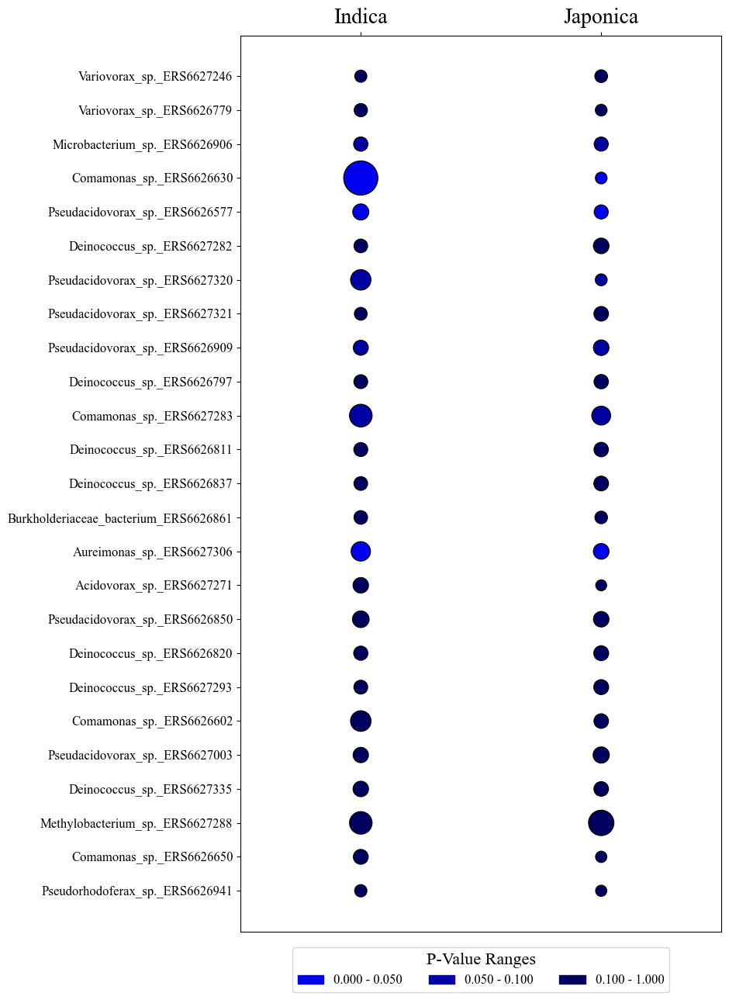

In [82]:
# Set the font globally to Times New Roman
plt.rcParams['font.family'] = 'Times New Roman'

# Define discrete color mapping for P-Value ranges
color_mapping = {
    (0, 0.05): '#0001F0',  # <= 0.05
    (0.05, 0.1): '#0000A3',  # >0.05 - <=0.1
    (0.1, 1.0): '#00005F'  # >0.1
}

plt.figure(figsize=(8, 15))

# Define evenly spaced x positions for Indica and Japonica
num_categories = 2
x_positions = np.arange(num_categories)  # Ensuring even spacing (e.g., [0, 1])

y = []
sizes = []
colors = []
plot_x_positions = []

# Loop over each row in the DataFrame
for i, row in enumerate(crop.index):
    indica_value = crop.loc[row, 'Indica']
    japonica_value = crop.loc[row, 'Japonica']
    p_value = crop.loc[row, 'P-Value']
    
    # Assign color based on P-Value range
    color = next(v for k, v in color_mapping.items() if k[0] <= p_value <= k[1])
    
    # Append data for Indica
    plot_x_positions.append(x_positions[0])
    y.append(row)
    sizes.append(indica_value)
    colors.append(color)
    
    # Append data for Japonica
    plot_x_positions.append(x_positions[1])
    y.append(row)
    sizes.append(japonica_value)
    colors.append(color)

# Normalize sizes to a specific range
min_size = 100
max_size = 1000
sizes = np.interp(sizes, (min(sizes), max(sizes)), (min_size, max_size))

# Create scatter plot with adjusted x positions
scatter = plt.scatter(plot_x_positions, y, s=sizes, c=colors, edgecolor='k', alpha=1)

# Create legend outside the graph
legend_patches = [mpatches.Patch(color=color, label=f'{k[0]:.3f} - {k[1]:.3f}') for k, color in color_mapping.items()]
plt.legend(handles=legend_patches, title='P-Value Ranges', fontsize=12, title_fontsize=16, loc='lower center', bbox_to_anchor=(0.5, -0.075), ncol=3)

# Plot formatting
plt.yticks(fontsize=12)
plt.gca().xaxis.set_ticks_position('top')
plt.gca().xaxis.set_label_position('top')
plt.xticks(x_positions, ['Indica', 'Japonica'], ha='center', fontsize=20)  # Ensuring even spacing of x-ticks
plt.xlim(-0.5, num_categories - 0.5)  # Centering the categories properly
plt.savefig('crop.png', format='png', dpi=300, bbox_inches='tight')
plt.show()

In [84]:
# Define the list of prefixes you want to group by
prefixes = [
    'Aureimonas_sp', 'Burkholderiaceae_bacterium', 'Pseudorhodoferax_sp', 
    'Pseudacidovorax_sp', 'Deinococcus_sp', 'Methylobacterium_sp', 
    'Variovorax_sp', 'Microbacterium_sp', 'Acidovorax_sp', 'Comamonas_sp'
]

# Initialize an empty list to store the mean DataFrames
sum_df_list = []

# Loop through each prefix and filter the DataFrame
for prefix in prefixes:
    # Filter rows where the index starts with the prefix
    filtered_df = coxl[coxl.index.str.startswith(prefix)]
    
    # Calculate the mean across the columns for the filtered DataFrame
    sum_df = filtered_df.sum(axis=0)
    
    # Set the index name as the prefix (optional, depending on how you want the result to look)
    sum_df.name = prefix
    
    # Append the mean DataFrame to the list
    sum_df_list.append(sum_df)

# Concatenate all the mean DataFrames into a single DataFrame
coxl_sum = pd.concat(sum_df_list, axis=1).T  # .T transposes the DataFrame to have prefixes as rows


In [85]:
coxl_sum

,ERR6050324,ERR6050325,ERR6050326,ERR6050327,ERR6050331,ERR6050332,ERR6050334,ERR6050337,ERR6050338,ERR6050344,...,ERR6050636,ERR6050637,ERR6050639,ERR6050640,ERR6050641,ERR6050644,ERR6050645,ERR6050648,ERR6050649,P-Value
Aureimonas_sp,0.000000,0.057325,0.167410,0.000000,0.000000,0.058138,0.0,0.077194,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.018008,0.0,0.003040
Burkholderiaceae_bacterium,0.024780,0.000000,0.282525,0.049472,0.000000,0.000000,0.0,0.000000,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.143634
Pseudorhodoferax_sp,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.448006
Pseudacidovorax_sp,0.143325,0.000000,3.977825,0.000000,0.000000,0.000000,0.0,0.043457,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,1.606693
Deinococcus_sp,0.000000,0.470802,0.226660,0.000000,0.000000,0.171101,0.0,0.622467,0.0,0.421156,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,4.243918
Methylobacterium_sp,0.015295,0.174915,0.130110,0.091941,0.000000,0.094978,0.0,0.135731,0.0,0.055849,...,0.0,0.012381,0.0,0.0,0.000000,0.024904,0.0,0.135822,0.0,0.712940
Variovorax_sp,0.000000,0.000000,0.015025,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.625232
Microbacterium_sp,0.015453,0.072359,0.000000,0.000000,0.000000,0.000000,0.0,0.019602,0.0,0.012162,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.052570
Acidovorax_sp,0.000000,0.000000,0.000000,1.459407,0.000000,0.000000,0.0,0.000000,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.986659
Comamonas_sp,0.000000,0.000000,0.023686,2.192125,0.526465,12.024121,0.0,0.000000,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.399032,0.072577,0.0,0.000000,0.0,0.942058


In [86]:
# Drop the column by name (e.g., 'P-Value')
coxl_sum = coxl_sum.drop(columns=['P-Value'])

# Display the DataFrame after dropping the column
coxl_sum

,ERR6050324,ERR6050325,ERR6050326,ERR6050327,ERR6050331,ERR6050332,ERR6050334,ERR6050337,ERR6050338,ERR6050344,...,ERR6050635,ERR6050636,ERR6050637,ERR6050639,ERR6050640,ERR6050641,ERR6050644,ERR6050645,ERR6050648,ERR6050649
Aureimonas_sp,0.000000,0.057325,0.167410,0.000000,0.000000,0.058138,0.0,0.077194,0.0,0.000000,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.018008,0.0
Burkholderiaceae_bacterium,0.024780,0.000000,0.282525,0.049472,0.000000,0.000000,0.0,0.000000,0.0,0.000000,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
Pseudorhodoferax_sp,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
Pseudacidovorax_sp,0.143325,0.000000,3.977825,0.000000,0.000000,0.000000,0.0,0.043457,0.0,0.000000,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
Deinococcus_sp,0.000000,0.470802,0.226660,0.000000,0.000000,0.171101,0.0,0.622467,0.0,0.421156,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
Methylobacterium_sp,0.015295,0.174915,0.130110,0.091941,0.000000,0.094978,0.0,0.135731,0.0,0.055849,...,0.018487,0.0,0.012381,0.0,0.0,0.000000,0.024904,0.0,0.135822,0.0
Variovorax_sp,0.000000,0.000000,0.015025,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
Microbacterium_sp,0.015453,0.072359,0.000000,0.000000,0.000000,0.000000,0.0,0.019602,0.0,0.012162,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
Acidovorax_sp,0.000000,0.000000,0.000000,1.459407,0.000000,0.000000,0.0,0.000000,0.0,0.000000,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
Comamonas_sp,0.000000,0.000000,0.023686,2.192125,0.526465,12.024121,0.0,0.000000,0.0,0.000000,...,0.000000,0.0,0.000000,0.0,0.0,0.399032,0.072577,0.0,0.000000,0.0


In [87]:
# Initialize a list to store p-values
p_values = []

# Loop over each row to test the p-value between the two groups
for index, row in coxl_sum.iterrows():
    # Extract values from the two groups (168 and 108 columns)
    indica_values = row[indica_col].values
    japonica_values = row[japonica_col].values

    # Perform the Mann-Whitney U test (for independent samples)
    stat, p_value = mannwhitneyu(indica_values, japonica_values, alternative='two-sided')
    
    # Store the p-value for the current row
    p_values.append(p_value)

# Add the p-values to the original DataFrame
coxl_sum['P-Value'] = p_values

# Print the DataFrame with the new column
coxl_sum

,ERR6050324,ERR6050325,ERR6050326,ERR6050327,ERR6050331,ERR6050332,ERR6050334,ERR6050337,ERR6050338,ERR6050344,...,ERR6050636,ERR6050637,ERR6050639,ERR6050640,ERR6050641,ERR6050644,ERR6050645,ERR6050648,ERR6050649,P-Value
Aureimonas_sp,0.000000,0.057325,0.167410,0.000000,0.000000,0.058138,0.0,0.077194,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.018008,0.0,0.003040
Burkholderiaceae_bacterium,0.024780,0.000000,0.282525,0.049472,0.000000,0.000000,0.0,0.000000,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.143634
Pseudorhodoferax_sp,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.448006
Pseudacidovorax_sp,0.143325,0.000000,3.977825,0.000000,0.000000,0.000000,0.0,0.043457,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.446890
Deinococcus_sp,0.000000,0.470802,0.226660,0.000000,0.000000,0.171101,0.0,0.622467,0.0,0.421156,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.427850
Methylobacterium_sp,0.015295,0.174915,0.130110,0.091941,0.000000,0.094978,0.0,0.135731,0.0,0.055849,...,0.0,0.012381,0.0,0.0,0.000000,0.024904,0.0,0.135822,0.0,0.712940
Variovorax_sp,0.000000,0.000000,0.015025,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.347807
Microbacterium_sp,0.015453,0.072359,0.000000,0.000000,0.000000,0.000000,0.0,0.019602,0.0,0.012162,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.052570
Acidovorax_sp,0.000000,0.000000,0.000000,1.459407,0.000000,0.000000,0.0,0.000000,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.986659
Comamonas_sp,0.000000,0.000000,0.023686,2.192125,0.526465,12.024121,0.0,0.000000,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.399032,0.072577,0.0,0.000000,0.0,0.088304


In [88]:
crop_sum = pd.DataFrame()
crop_sum = columns_average(coxl_sum, crop_sum, indica_col, japonica_col, "Indica", "Japonica")
crop_sum

,Indica,Japonica
Aureimonas_sp,0.055700,0.027524
Burkholderiaceae_bacterium,0.014536,0.008771
Pseudorhodoferax_sp,0.007256,0.001575
Pseudacidovorax_sp,0.187551,0.127350
Deinococcus_sp,0.122435,0.152716
Methylobacterium_sp,0.084109,0.113743
Variovorax_sp,0.018781,0.013715
Microbacterium_sp,0.018717,0.017568
Acidovorax_sp,0.026254,0.000366
Comamonas_sp,0.401339,0.077786


In [89]:
crop_sum['P-Value'] = coxl_sum['P-Value']
crop_sum

,Indica,Japonica,P-Value
Aureimonas_sp,0.055700,0.027524,0.003040
Burkholderiaceae_bacterium,0.014536,0.008771,0.143634
Pseudorhodoferax_sp,0.007256,0.001575,0.448006
Pseudacidovorax_sp,0.187551,0.127350,0.446890
Deinococcus_sp,0.122435,0.152716,0.427850
Methylobacterium_sp,0.084109,0.113743,0.712940
Variovorax_sp,0.018781,0.013715,0.347807
Microbacterium_sp,0.018717,0.017568,0.052570
Acidovorax_sp,0.026254,0.000366,0.986659
Comamonas_sp,0.401339,0.077786,0.088304


In [90]:
crop_sum.to_csv('crop_sum.csv', index=False)

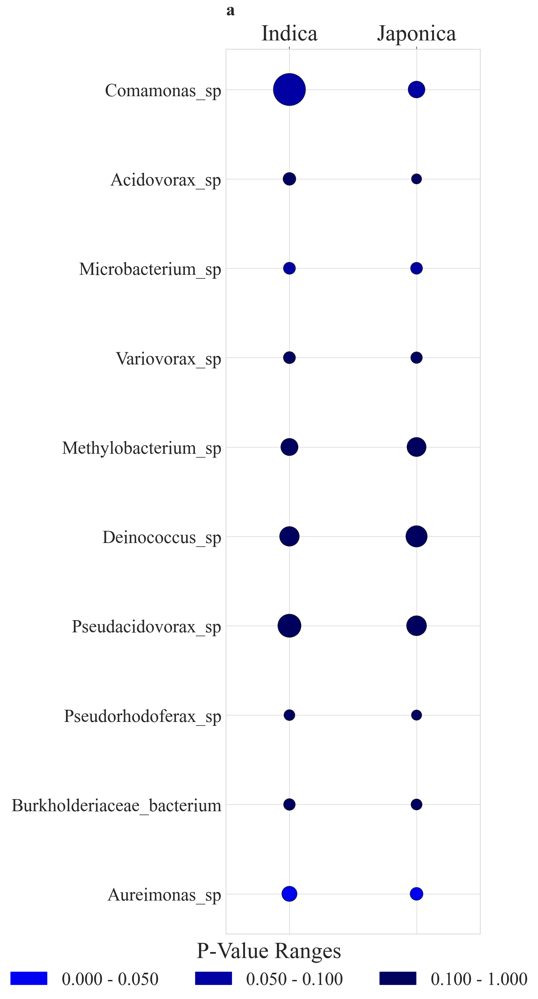

In [554]:
# Set the font globally to Times New Roman
plt.rcParams['font.family'] = 'Times New Roman'

# Define discrete color mapping for P-Value ranges
color_mapping = {
    (0, 0.05): '#0001F0',  # <= 0.05
    (0.05, 0.1): '#0000A3',  # >0.05 - <=0.1
    (0.1, 1.0): '#00005F'  # >0.1
}

plt.figure(figsize=(10, 35))

# Define evenly spaced x positions for Indica and Japonica
num_categories = 2
x_positions = np.arange(num_categories)  # Ensuring even spacing (e.g., [0, 1])

y = []
sizes = []
colors = []
plot_x_positions = []

# Loop over each row in the DataFrame
for i, row in enumerate(crop_sum.index):
    indica_value = crop_sum.loc[row, 'Indica']
    japonica_value = crop_sum.loc[row, 'Japonica']
    p_value = crop_sum.loc[row, 'P-Value']
    
    # Assign color based on P-Value range
    color = next(v for k, v in color_mapping.items() if k[0] <= p_value <= k[1])
    
    # Append data for Indica
    plot_x_positions.append(x_positions[0])
    y.append(row)
    sizes.append(indica_value)
    colors.append(color)
    
    # Append data for Japonica
    plot_x_positions.append(x_positions[1])
    y.append(row)
    sizes.append(japonica_value)
    colors.append(color)

# Normalize sizes to a specific range
min_size = 500
max_size = 5000
sizes = np.interp(sizes, (min(sizes), max(sizes)), (min_size, max_size))

# Create scatter plot with adjusted x positions
scatter = plt.scatter(plot_x_positions, y, s=sizes, c=colors, edgecolor='k', alpha=1)

# Create legend outside the graph
legend_patches = [mpatches.Patch(color=color, label=f'{k[0]:.3f} - {k[1]:.3f}') for k, color in color_mapping.items()]
plt.legend(handles=legend_patches, title='P-Value Ranges', fontsize=40, title_fontsize=50, bbox_to_anchor=(0.17, -0.08), loc='lower center', frameon=False, ncol=3)

# Plot formatting
plt.yticks(fontsize=40)
plt.gca().set_title('a', fontsize=40, fontweight='bold', pad=20, loc='left')
plt.gca().xaxis.set_ticks_position('top')
plt.gca().xaxis.set_label_position('top')
plt.xticks(x_positions, ['Indica', 'Japonica'], ha='center', fontsize=50)  # Ensuring even spacing of x-ticks
plt.xlim(-0.5, num_categories - 0.5)  # Centering the categories properly
plt.savefig('crop_genus.png', format='png', dpi=300, bbox_inches='tight')
plt.show()

In [92]:
indica_cultivar = group[group['Group'] == 'indica']['IRRI seed bank ID'].unique()
japonica_cultivar = group[group['Group'] == 'japonica']['IRRI seed bank ID'].unique()

In [93]:
indica_cultivar = indica_cultivar.tolist()
len(indica_cultivar)

56

In [94]:
japonica_cultivar = japonica_cultivar.tolist()
len(japonica_cultivar)

36

In [95]:
cultivars = pd.DataFrame()

for cultivar in group['IRRI seed bank ID'].unique():
    columns = group[group['IRRI seed bank ID'] == cultivar]['Metagenomes']
    cultivars[cultivar] = coxl[columns].mean(axis=1)

cultivars['P-Value'] = coxl['P-Value']
cultivars

,IRGC 121380,IRGC 120934,IRGC 120974,IRGC 121760,IRGC 120999,IRGC 120977,IRGC 121832,IRGC 121291,IRGC 120935,IRGC 121528,...,IRGC 121453,IRGC 121843,IRGC 121697,IRGC 121809,IRGC 121293,IRGC 121334,IRGC 121292,IRGC 121267,IRGC 121368,P-Value
Genome,,,,,,,,,,,,,,,,,,,,,
Pseudorhodoferax_sp._ERS6626941,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.448006
Comamonas_sp._ERS6626650,0.000000,0.000000,0.000000,0.069932,0.000000,0.000000,0.0,0.000000,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.011597,0.000000,0.0,0.000000,0.0,0.641838
Methylobacterium_sp._ERS6627288,0.015344,0.174109,0.129241,0.092790,0.000000,0.102848,0.0,0.132348,0.0,0.055151,...,0.0,0.012479,0.0,0.0,0.000000,0.024808,0.0,0.136509,0.0,0.712940
Deinococcus_sp._ERS6627335,0.000000,0.046852,0.029776,0.000000,0.000000,0.023326,0.0,0.068272,0.0,0.038623,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.001566,0.0,0.687494
Pseudacidovorax_sp._ERS6627003,0.007169,0.000000,0.073355,0.000000,0.000000,0.000000,0.0,0.009552,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.001450,0.0,0.159118
Comamonas_sp._ERS6626602,0.000000,0.000000,0.000000,1.499194,0.139907,0.521130,0.0,0.000000,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.134149,0.017954,0.0,0.000000,0.0,0.230350
Deinococcus_sp._ERS6627293,0.000000,0.053338,0.034999,0.000000,0.000000,0.026560,0.0,0.079897,0.0,0.043776,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.001781,0.0,0.576989
Deinococcus_sp._ERS6626820,0.000000,0.052335,0.036568,0.000000,0.000000,0.027432,0.0,0.147460,0.0,0.039206,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.002000,0.0,0.331939
Pseudacidovorax_sp._ERS6626850,0.006972,0.000000,0.074725,0.000000,0.000000,0.000000,0.0,0.010808,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.001508,0.0,0.256004


In [96]:
sorted_columns = indica_cultivar + japonica_cultivar
cultivars = cultivars[sorted_columns]
cultivars

,IRGC 121380,IRGC 120934,IRGC 120974,IRGC 121760,IRGC 120999,IRGC 120977,IRGC 121832,IRGC 121291,IRGC 120935,IRGC 121528,...,IRGC 121354,IRGC 121453,IRGC 121843,IRGC 121697,IRGC 121809,IRGC 121293,IRGC 121334,IRGC 121292,IRGC 121267,IRGC 121368
Genome,,,,,,,,,,,,,,,,,,,,,
Pseudorhodoferax_sp._ERS6626941,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
Comamonas_sp._ERS6626650,0.000000,0.000000,0.000000,0.069932,0.000000,0.000000,0.0,0.000000,0.0,0.000000,...,0.000000,0.0,0.000000,0.0,0.0,0.011597,0.000000,0.0,0.000000,0.0
Methylobacterium_sp._ERS6627288,0.015344,0.174109,0.129241,0.092790,0.000000,0.102848,0.0,0.132348,0.0,0.055151,...,0.018263,0.0,0.012479,0.0,0.0,0.000000,0.024808,0.0,0.136509,0.0
Deinococcus_sp._ERS6627335,0.000000,0.046852,0.029776,0.000000,0.000000,0.023326,0.0,0.068272,0.0,0.038623,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.001566,0.0
Pseudacidovorax_sp._ERS6627003,0.007169,0.000000,0.073355,0.000000,0.000000,0.000000,0.0,0.009552,0.0,0.000000,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.001450,0.0
Comamonas_sp._ERS6626602,0.000000,0.000000,0.000000,1.499194,0.139907,0.521130,0.0,0.000000,0.0,0.000000,...,0.000000,0.0,0.000000,0.0,0.0,0.134149,0.017954,0.0,0.000000,0.0
Deinococcus_sp._ERS6627293,0.000000,0.053338,0.034999,0.000000,0.000000,0.026560,0.0,0.079897,0.0,0.043776,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.001781,0.0
Deinococcus_sp._ERS6626820,0.000000,0.052335,0.036568,0.000000,0.000000,0.027432,0.0,0.147460,0.0,0.039206,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.002000,0.0
Pseudacidovorax_sp._ERS6626850,0.006972,0.000000,0.074725,0.000000,0.000000,0.000000,0.0,0.010808,0.0,0.000000,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.001508,0.0


In [98]:
# Initialize a list to store p-values
p_values = []

# Loop over each row to test the p-value between the two groups
for index, row in cultivars.iterrows():
    # Extract values from the two groups (168 and 108 columns)
    indica_values = row[indica_cultivar].values
    japonica_values = row[japonica_cultivar].values

    # Perform the Mann-Whitney U test (for independent samples)
    stat, p_value = mannwhitneyu(indica_values, japonica_values, alternative='two-sided')
    
    # Store the p-value for the current row
    p_values.append(p_value)

# Add the p-values to the original DataFrame
cultivars['P-Value'] = p_values

# Print the DataFrame with the new column
cultivars

,IRGC 121380,IRGC 120934,IRGC 120974,IRGC 121760,IRGC 120999,IRGC 120977,IRGC 121832,IRGC 121291,IRGC 120935,IRGC 121528,...,IRGC 121453,IRGC 121843,IRGC 121697,IRGC 121809,IRGC 121293,IRGC 121334,IRGC 121292,IRGC 121267,IRGC 121368,P-Value
Genome,,,,,,,,,,,,,,,,,,,,,
Pseudorhodoferax_sp._ERS6626941,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.959399
Comamonas_sp._ERS6626650,0.000000,0.000000,0.000000,0.069932,0.000000,0.000000,0.0,0.000000,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.011597,0.000000,0.0,0.000000,0.0,0.991876
Methylobacterium_sp._ERS6627288,0.015344,0.174109,0.129241,0.092790,0.000000,0.102848,0.0,0.132348,0.0,0.055151,...,0.0,0.012479,0.0,0.0,0.000000,0.024808,0.0,0.136509,0.0,0.824123
Deinococcus_sp._ERS6627335,0.000000,0.046852,0.029776,0.000000,0.000000,0.023326,0.0,0.068272,0.0,0.038623,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.001566,0.0,0.846203
Pseudacidovorax_sp._ERS6627003,0.007169,0.000000,0.073355,0.000000,0.000000,0.000000,0.0,0.009552,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.001450,0.0,0.557331
Comamonas_sp._ERS6626602,0.000000,0.000000,0.000000,1.499194,0.139907,0.521130,0.0,0.000000,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.134149,0.017954,0.0,0.000000,0.0,0.536219
Deinococcus_sp._ERS6627293,0.000000,0.053338,0.034999,0.000000,0.000000,0.026560,0.0,0.079897,0.0,0.043776,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.001781,0.0,0.740343
Deinococcus_sp._ERS6626820,0.000000,0.052335,0.036568,0.000000,0.000000,0.027432,0.0,0.147460,0.0,0.039206,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.002000,0.0,0.530350
Pseudacidovorax_sp._ERS6626850,0.006972,0.000000,0.074725,0.000000,0.000000,0.000000,0.0,0.010808,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.001508,0.0,0.542482


In [102]:
cultivars.to_csv('cultivars.csv', index=False)

In [107]:
# Define the list of prefixes you want to group by
prefixes = [
    'Aureimonas_sp', 'Burkholderiaceae_bacterium', 'Pseudorhodoferax_sp', 
    'Pseudacidovorax_sp', 'Deinococcus_sp', 'Methylobacterium_sp', 
    'Variovorax_sp', 'Microbacterium_sp', 'Acidovorax_sp', 'Comamonas_sp'
]

# Initialize an empty list to store the mean DataFrames
sum_df_list = []

# Loop through each prefix and filter the DataFrame
for prefix in prefixes:
    # Filter rows where the index starts with the prefix
    filtered_df = cultivars[cultivars.index.str.startswith(prefix)]
    
    # Calculate the mean across the columns for the filtered DataFrame
    sum_df = filtered_df.sum(axis=0)
    
    # Set the index name as the prefix (optional, depending on how you want the result to look)
    sum_df.name = prefix
    
    # Append the mean DataFrame to the list
    sum_df_list.append(sum_df)

# Concatenate all the mean DataFrames into a single DataFrame
cultivars_sum = pd.concat(sum_df_list, axis=1).T  # .T transposes the DataFrame to have prefixes as rows

In [108]:
cultivars_sum

,IRGC 121380,IRGC 120934,IRGC 120974,IRGC 121760,IRGC 120999,IRGC 120977,IRGC 121832,IRGC 121291,IRGC 120935,IRGC 121528,...,IRGC 121453,IRGC 121843,IRGC 121697,IRGC 121809,IRGC 121293,IRGC 121334,IRGC 121292,IRGC 121267,IRGC 121368,P-Value
Aureimonas_sp,0.000000,0.056863,0.167594,0.000000,0.000000,0.064057,0.0,0.074360,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.017640,0.0,0.084509
Burkholderiaceae_bacterium,0.024618,0.000000,0.279850,0.050061,0.000000,0.000000,0.0,0.000000,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.373652
Pseudorhodoferax_sp,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.959399
Pseudacidovorax_sp,0.142775,0.000000,3.937552,0.000000,0.000000,0.000000,0.0,0.041995,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.004898,0.0,2.839087
Deinococcus_sp,0.000000,0.467922,0.224002,0.000000,0.000000,0.190882,0.0,0.595560,0.0,0.411777,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.011561,0.0,5.251754
Methylobacterium_sp,0.015344,0.174109,0.129241,0.092790,0.000000,0.102848,0.0,0.132348,0.0,0.055151,...,0.0,0.012479,0.0,0.0,0.000000,0.024808,0.0,0.136509,0.0,0.824123
Variovorax_sp,0.000000,0.000000,0.005008,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,1.255492
Microbacterium_sp,0.015006,0.072747,0.000000,0.000000,0.000000,0.003910,0.0,0.019214,0.0,0.007674,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.224660
Acidovorax_sp,0.000000,0.000000,0.000000,1.470242,0.000000,0.000000,0.0,0.000000,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.775624
Comamonas_sp,0.000000,0.000000,0.023260,2.202315,0.542652,13.220450,0.0,0.000000,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.405219,0.072359,0.0,0.000000,0.0,1.935111


In [109]:
# Initialize a list to store p-values
p_values = []

# Loop over each row to test the p-value between the two groups
for index, row in cultivars_sum.iterrows():
    # Extract values from the two groups (168 and 108 columns)
    indica_values = row[indica_cultivar].values
    japonica_values = row[japonica_cultivar].values

    # Perform the Mann-Whitney U test (for independent samples)
    stat, p_value = mannwhitneyu(indica_values, japonica_values, alternative='two-sided')
    
    # Store the p-value for the current row
    p_values.append(p_value)

# Add the p-values to the original DataFrame
cultivars_sum['P-Value'] = p_values

# Print the DataFrame with the new column
cultivars_sum

,IRGC 121380,IRGC 120934,IRGC 120974,IRGC 121760,IRGC 120999,IRGC 120977,IRGC 121832,IRGC 121291,IRGC 120935,IRGC 121528,...,IRGC 121453,IRGC 121843,IRGC 121697,IRGC 121809,IRGC 121293,IRGC 121334,IRGC 121292,IRGC 121267,IRGC 121368,P-Value
Aureimonas_sp,0.000000,0.056863,0.167594,0.000000,0.000000,0.064057,0.0,0.074360,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.017640,0.0,0.084509
Burkholderiaceae_bacterium,0.024618,0.000000,0.279850,0.050061,0.000000,0.000000,0.0,0.000000,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.373652
Pseudorhodoferax_sp,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.959399
Pseudacidovorax_sp,0.142775,0.000000,3.937552,0.000000,0.000000,0.000000,0.0,0.041995,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.004898,0.0,0.758925
Deinococcus_sp,0.000000,0.467922,0.224002,0.000000,0.000000,0.190882,0.0,0.595560,0.0,0.411777,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.011561,0.0,0.597322
Methylobacterium_sp,0.015344,0.174109,0.129241,0.092790,0.000000,0.102848,0.0,0.132348,0.0,0.055151,...,0.0,0.012479,0.0,0.0,0.000000,0.024808,0.0,0.136509,0.0,0.824123
Variovorax_sp,0.000000,0.000000,0.005008,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.726941
Microbacterium_sp,0.015006,0.072747,0.000000,0.000000,0.000000,0.003910,0.0,0.019214,0.0,0.007674,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.224660
Acidovorax_sp,0.000000,0.000000,0.000000,1.470242,0.000000,0.000000,0.0,0.000000,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.775624
Comamonas_sp,0.000000,0.000000,0.023260,2.202315,0.542652,13.220450,0.0,0.000000,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.405219,0.072359,0.0,0.000000,0.0,0.333184


In [110]:
cultivars_sum.to_csv('cultivars_sum.csv', index=False)

In [111]:
indica = cultivars[indica_cultivar]
indica

,IRGC 121380,IRGC 120934,IRGC 120974,IRGC 121760,IRGC 120999,IRGC 120977,IRGC 121832,IRGC 121291,IRGC 120935,IRGC 121528,...,IRGC 121608,IRGC 121076,IRGC 121785,IRGC 121884,IRGC 121085,IRGC 120972,IRGC 117429,IRGC 120953,IRGC 121220,IRGC 121850
Genome,,,,,,,,,,,,,,,,,,,,,
Pseudorhodoferax_sp._ERS6626941,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,...,0.0,0.0,0.000000,0.000000,0.0,0.00000,0.0,0.000000,0.000000,0.0
Comamonas_sp._ERS6626650,0.000000,0.000000,0.000000,0.069932,0.000000,0.000000,0.0,0.000000,0.0,0.000000,...,0.0,0.0,0.000000,0.000000,0.0,1.18256,0.0,0.000000,0.000000,0.0
Methylobacterium_sp._ERS6627288,0.015344,0.174109,0.129241,0.092790,0.000000,0.102848,0.0,0.132348,0.0,0.055151,...,0.0,0.0,0.000000,0.014057,0.0,0.00000,0.0,0.047660,0.033476,0.0
Deinococcus_sp._ERS6627335,0.000000,0.046852,0.029776,0.000000,0.000000,0.023326,0.0,0.068272,0.0,0.038623,...,0.0,0.0,0.000000,0.007772,0.0,0.00000,0.0,0.008315,0.021284,0.0
Pseudacidovorax_sp._ERS6627003,0.007169,0.000000,0.073355,0.000000,0.000000,0.000000,0.0,0.009552,0.0,0.000000,...,0.0,0.0,0.000000,0.000000,0.0,0.00000,0.0,0.012411,0.000000,0.0
Comamonas_sp._ERS6626602,0.000000,0.000000,0.000000,1.499194,0.139907,0.521130,0.0,0.000000,0.0,0.000000,...,0.0,0.0,0.000000,0.388857,0.0,0.00000,0.0,0.000000,0.000000,0.0
Deinococcus_sp._ERS6627293,0.000000,0.053338,0.034999,0.000000,0.000000,0.026560,0.0,0.079897,0.0,0.043776,...,0.0,0.0,0.000000,0.008375,0.0,0.00000,0.0,0.009136,0.024925,0.0
Deinococcus_sp._ERS6626820,0.000000,0.052335,0.036568,0.000000,0.000000,0.027432,0.0,0.147460,0.0,0.039206,...,0.0,0.0,0.000000,0.007503,0.0,0.00000,0.0,0.015233,0.024209,0.0
Pseudacidovorax_sp._ERS6626850,0.006972,0.000000,0.074725,0.000000,0.000000,0.000000,0.0,0.010808,0.0,0.000000,...,0.0,0.0,0.000000,0.000000,0.0,0.00000,0.0,0.012811,0.000000,0.0


In [116]:
print(indica.columns.duplicated().any())

False


In [119]:
indica = indica.loc[:, ~indica.columns.duplicated()]
indica

,IRGC 121380,IRGC 120934,IRGC 120974,IRGC 121760,IRGC 120999,IRGC 120977,IRGC 121832,IRGC 121291,IRGC 120935,IRGC 121528,...,IRGC 121608,IRGC 121076,IRGC 121785,IRGC 121884,IRGC 121085,IRGC 120972,IRGC 117429,IRGC 120953,IRGC 121220,IRGC 121850
Genome,,,,,,,,,,,,,,,,,,,,,
Pseudorhodoferax_sp._ERS6626941,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,...,0.0,0.0,0.000000,0.000000,0.0,0.00000,0.0,0.000000,0.000000,0.0
Comamonas_sp._ERS6626650,0.000000,0.000000,0.000000,0.069932,0.000000,0.000000,0.0,0.000000,0.0,0.000000,...,0.0,0.0,0.000000,0.000000,0.0,1.18256,0.0,0.000000,0.000000,0.0
Methylobacterium_sp._ERS6627288,0.015344,0.174109,0.129241,0.092790,0.000000,0.102848,0.0,0.132348,0.0,0.055151,...,0.0,0.0,0.000000,0.014057,0.0,0.00000,0.0,0.047660,0.033476,0.0
Deinococcus_sp._ERS6627335,0.000000,0.046852,0.029776,0.000000,0.000000,0.023326,0.0,0.068272,0.0,0.038623,...,0.0,0.0,0.000000,0.007772,0.0,0.00000,0.0,0.008315,0.021284,0.0
Pseudacidovorax_sp._ERS6627003,0.007169,0.000000,0.073355,0.000000,0.000000,0.000000,0.0,0.009552,0.0,0.000000,...,0.0,0.0,0.000000,0.000000,0.0,0.00000,0.0,0.012411,0.000000,0.0
Comamonas_sp._ERS6626602,0.000000,0.000000,0.000000,1.499194,0.139907,0.521130,0.0,0.000000,0.0,0.000000,...,0.0,0.0,0.000000,0.388857,0.0,0.00000,0.0,0.000000,0.000000,0.0
Deinococcus_sp._ERS6627293,0.000000,0.053338,0.034999,0.000000,0.000000,0.026560,0.0,0.079897,0.0,0.043776,...,0.0,0.0,0.000000,0.008375,0.0,0.00000,0.0,0.009136,0.024925,0.0
Deinococcus_sp._ERS6626820,0.000000,0.052335,0.036568,0.000000,0.000000,0.027432,0.0,0.147460,0.0,0.039206,...,0.0,0.0,0.000000,0.007503,0.0,0.00000,0.0,0.015233,0.024209,0.0
Pseudacidovorax_sp._ERS6626850,0.006972,0.000000,0.074725,0.000000,0.000000,0.000000,0.0,0.010808,0.0,0.000000,...,0.0,0.0,0.000000,0.000000,0.0,0.00000,0.0,0.012811,0.000000,0.0


In [120]:
indica.to_csv('indica.csv', index=False)

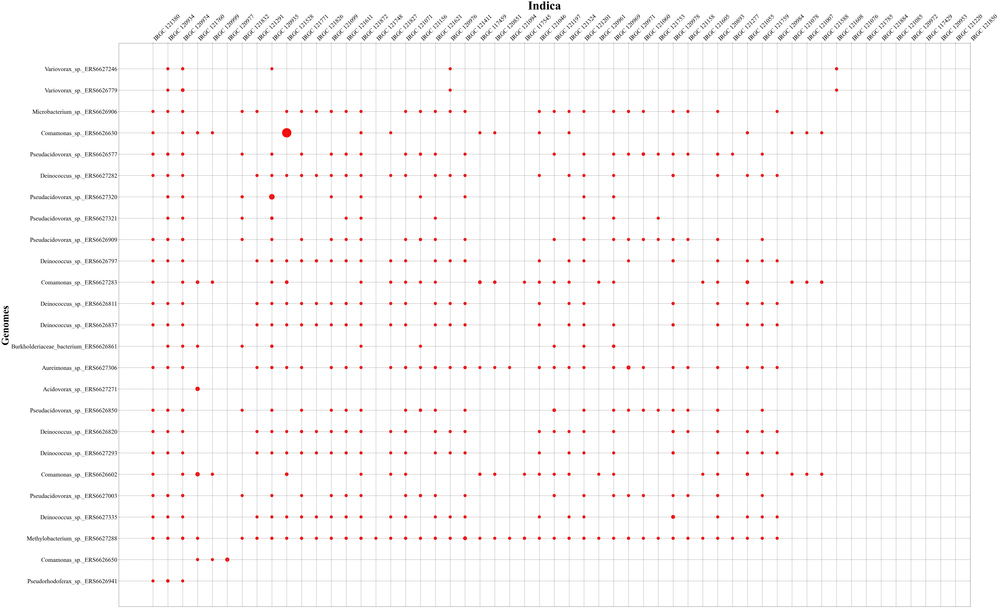

In [122]:
# Create a scatter plot with color gradient and size variation
plt.figure(figsize=(75, 50))


# Flatten the DataFrame to get x, y, and size values
x = []
y = []
sizes = []

for i, row in enumerate(indica.index):
    for j, col in enumerate(indica.columns):
        value = indica.loc[row, col]
        if value > 0:
            x.append(col)
            y.append(row)
            sizes.append(value)

# Normalize sizes to a specific range
min_size = 200
max_size = 2000
sizes = np.interp(sizes, (min(sizes), max(sizes)), (min_size, max_size))

# Create scatter plot with color gradient
scatter = plt.scatter(x, y, s=sizes, c='red', alpha=1)

plt.xlabel('Indica', fontsize=60, labelpad=20, fontweight='bold')
plt.ylabel('Genomes', fontsize=50, fontweight='bold')
plt.yticks(fontsize=30)

# Move x-axis to the top
plt.gca().xaxis.set_ticks_position('top')
plt.gca().xaxis.set_label_position('top')

# Rotate x-axis labels for better visibility
plt.xticks(rotation=45, ha='left')

# Set x-axis ticks and labels explicitly
plt.xticks(np.arange(len(indica.columns)), indica.columns, fontsize=30)

plt.grid(True, color='gray', linewidth=1)

# Save the plot as a PNG image
plt.savefig('indica_distribution.png', format='png', dpi=300, bbox_inches='tight')

plt.show()

In [123]:
japonica = cultivars[japonica_cultivar]
japonica

,IRGC 121699,IRGC 121600,IRGC 121670,IRGC 121734,IRGC 121781,IRGC 121193,IRGC 121735,IRGC 121782,IRGC 121732,IRGC 121755,...,IRGC 121354,IRGC 121453,IRGC 121843,IRGC 121697,IRGC 121809,IRGC 121293,IRGC 121334,IRGC 121292,IRGC 121267,IRGC 121368
Genome,,,,,,,,,,,,,,,,,,,,,
Pseudorhodoferax_sp._ERS6626941,0.0,0.000000,0.045104,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
Comamonas_sp._ERS6626650,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.0,0.000000,0.0,0.0,0.011597,0.000000,0.0,0.000000,0.0
Methylobacterium_sp._ERS6627288,0.0,0.006430,0.108226,0.090867,0.057567,0.057951,0.732706,0.272191,0.147208,0.046144,...,0.018263,0.0,0.012479,0.0,0.0,0.000000,0.024808,0.0,0.136509,0.0
Deinococcus_sp._ERS6627335,0.0,0.000000,0.020942,0.081811,0.038479,0.054137,0.234951,0.077701,0.038268,0.000000,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.001566,0.0
Pseudacidovorax_sp._ERS6627003,0.0,0.009811,0.363161,0.006719,0.000000,0.000000,0.000000,0.000000,0.208970,0.000000,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.001450,0.0
Comamonas_sp._ERS6626602,0.0,0.173013,0.000000,0.006186,0.000000,0.000000,0.000000,0.000000,0.000000,0.016333,...,0.000000,0.0,0.000000,0.0,0.0,0.134149,0.017954,0.0,0.000000,0.0
Deinococcus_sp._ERS6627293,0.0,0.000000,0.024619,0.077798,0.033108,0.060296,0.259369,0.092651,0.041659,0.000000,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.001781,0.0
Deinococcus_sp._ERS6626820,0.0,0.000000,0.022055,0.074019,0.029977,0.058307,0.244343,0.094494,0.040370,0.000000,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.002000,0.0
Pseudacidovorax_sp._ERS6626850,0.0,0.006897,0.220636,0.006147,0.000000,0.000000,0.000000,0.000000,0.162143,0.000000,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.001508,0.0


In [125]:
print(japonica.columns.duplicated().any())

False


In [126]:
japonica = japonica.loc[:, ~japonica.columns.duplicated()]
japonica

,IRGC 121699,IRGC 121600,IRGC 121670,IRGC 121734,IRGC 121781,IRGC 121193,IRGC 121735,IRGC 121782,IRGC 121732,IRGC 121755,...,IRGC 121354,IRGC 121453,IRGC 121843,IRGC 121697,IRGC 121809,IRGC 121293,IRGC 121334,IRGC 121292,IRGC 121267,IRGC 121368
Genome,,,,,,,,,,,,,,,,,,,,,
Pseudorhodoferax_sp._ERS6626941,0.0,0.000000,0.045104,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
Comamonas_sp._ERS6626650,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.0,0.000000,0.0,0.0,0.011597,0.000000,0.0,0.000000,0.0
Methylobacterium_sp._ERS6627288,0.0,0.006430,0.108226,0.090867,0.057567,0.057951,0.732706,0.272191,0.147208,0.046144,...,0.018263,0.0,0.012479,0.0,0.0,0.000000,0.024808,0.0,0.136509,0.0
Deinococcus_sp._ERS6627335,0.0,0.000000,0.020942,0.081811,0.038479,0.054137,0.234951,0.077701,0.038268,0.000000,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.001566,0.0
Pseudacidovorax_sp._ERS6627003,0.0,0.009811,0.363161,0.006719,0.000000,0.000000,0.000000,0.000000,0.208970,0.000000,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.001450,0.0
Comamonas_sp._ERS6626602,0.0,0.173013,0.000000,0.006186,0.000000,0.000000,0.000000,0.000000,0.000000,0.016333,...,0.000000,0.0,0.000000,0.0,0.0,0.134149,0.017954,0.0,0.000000,0.0
Deinococcus_sp._ERS6627293,0.0,0.000000,0.024619,0.077798,0.033108,0.060296,0.259369,0.092651,0.041659,0.000000,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.001781,0.0
Deinococcus_sp._ERS6626820,0.0,0.000000,0.022055,0.074019,0.029977,0.058307,0.244343,0.094494,0.040370,0.000000,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.002000,0.0
Pseudacidovorax_sp._ERS6626850,0.0,0.006897,0.220636,0.006147,0.000000,0.000000,0.000000,0.000000,0.162143,0.000000,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.001508,0.0


In [127]:
japonica.to_csv('japonica.csv', index=False)

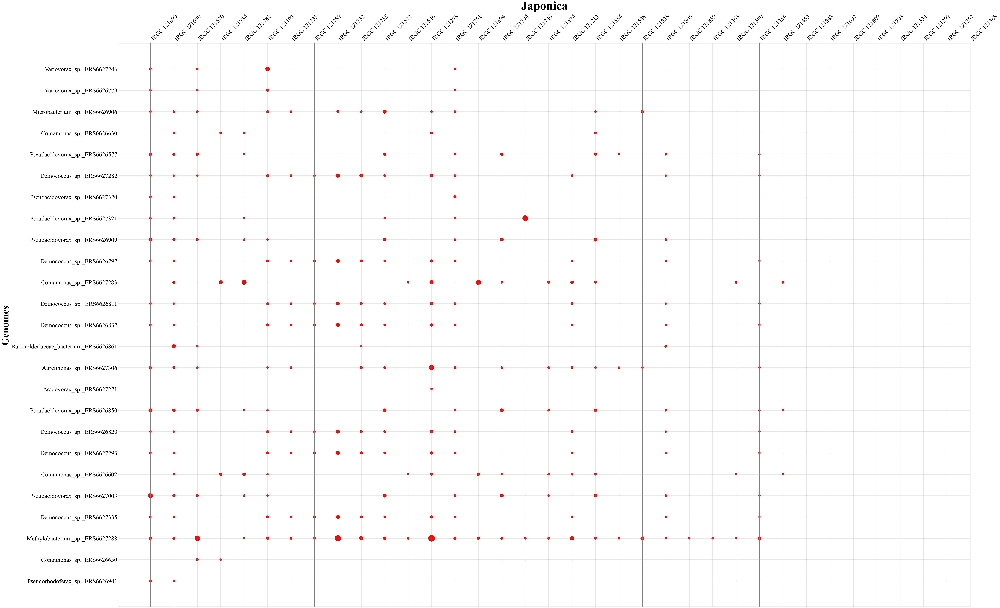

In [132]:
# Create a scatter plot with color gradient and size variation
plt.figure(figsize=(75, 50))

# Flatten the DataFrame to get x, y, and size values
x = []
y = []
sizes = []

for i, row in enumerate(japonica.index):
    for j, col in enumerate(japonica.columns):
        value = japonica.loc[row, col]
        if value > 0:
            x.append(col)
            y.append(row)
            sizes.append(value)

# Normalize sizes to a specific range
min_size = 100
max_size = 1000
sizes = np.interp(sizes, (min(sizes), max(sizes)), (min_size, max_size))

# Create scatter plot with color gradient
scatter = plt.scatter(x, y, s=sizes, c='red', alpha=1)

plt.xlabel('Japonica', fontsize=60, labelpad=20, fontweight='bold')
plt.ylabel('Genomes', fontsize=50, fontweight='bold')
plt.yticks(fontsize=30)

# Move x-axis to the top
plt.gca().xaxis.set_ticks_position('top')
plt.gca().xaxis.set_label_position('top')

# Rotate x-axis labels for better visibility
plt.xticks(rotation=45, ha='left')

# Set x-axis ticks and labels explicitly
plt.xticks(np.arange(len(japonica.columns)), japonica.columns, fontsize=30)

plt.grid(True, color='gray', linewidth=1)

# Save the plot as a PNG image
plt.savefig('japonica_distribution.png', format='png', dpi=300, bbox_inches='tight')

plt.show()

In [134]:
indica_coverage = round(crop['Indica'].sum(), 2)
japonica_coverage = round(crop['Japonica'].sum(), 2)
total_coverage = round(indica_coverage + japonica_coverage, 2)
indica_coverage_percentage = (indica_coverage/total_coverage)*100
japonica_coverage_percentage = (japonica_coverage/total_coverage)*100
distribution_differences = round(indica_coverage_percentage - japonica_coverage_percentage, 2)
total_average_coverage = round((coxl.iloc[:,1:].mean(axis=1)).sum(), 2)

print(f'Average Relative Abundace of CoxL Carriers in Indica: {indica_coverage}%')
print(f'Average Relative Abundace of CoxL Carriers in Japonica : {japonica_coverage}%')
print(f'Sum of Average Relative Abundace of CoxL Carriers from Indica and Japonica: {total_coverage}%')
print(f'Percentage of Distribution of CoxL Carriers in Indica  : {indica_coverage_percentage}%')
print(f'Percentage of Distribution of CoxL Carriers in Japonica  : {japonica_coverage_percentage}%')
print(f'Difference in Percentage of Distribution of CoxL Carriers Between Indica & Japonica  : {distribution_differences}%')
print(f'total Average Relative Abundace of CoxL Carriers across Indica and Japonica: {total_average_coverage}%')

Average Relative Abundace of CoxL Carriers in Indica: 0.94%
Average Relative Abundace of CoxL Carriers in Japonica : 0.54%
Sum of Average Relative Abundace of CoxL Carriers from Indica and Japonica: 1.48%
Percentage of Distribution of CoxL Carriers in Indica  : 63.51351351351351%
Percentage of Distribution of CoxL Carriers in Japonica  : 36.48648648648649%
Difference in Percentage of Distribution of CoxL Carriers Between Indica & Japonica  : 27.03%
total Average Relative Abundace of CoxL Carriers across Indica and Japonica: 0.82%


In [135]:
coxl

,ERR6050324,ERR6050325,ERR6050326,ERR6050327,ERR6050331,ERR6050332,ERR6050334,ERR6050337,ERR6050338,ERR6050344,...,ERR6050636,ERR6050637,ERR6050639,ERR6050640,ERR6050641,ERR6050644,ERR6050645,ERR6050648,ERR6050649,P-Value
Genome,,,,,,,,,,,,,,,,,,,,,
Pseudorhodoferax_sp._ERS6626941,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.448006
Comamonas_sp._ERS6626650,0.000000,0.000000,0.000000,0.070546,0.000000,0.000000,0.0,0.000000,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.011315,0.000000,0.0,0.000000,0.0,0.641838
Methylobacterium_sp._ERS6627288,0.015295,0.174915,0.130110,0.091941,0.000000,0.094978,0.0,0.135731,0.0,0.055849,...,0.0,0.012381,0.0,0.0,0.000000,0.024904,0.0,0.135822,0.0,0.712940
Deinococcus_sp._ERS6627335,0.000000,0.044219,0.030060,0.000000,0.000000,0.020661,0.0,0.074418,0.0,0.037351,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.687494
Pseudacidovorax_sp._ERS6627003,0.007145,0.000000,0.075032,0.000000,0.000000,0.000000,0.0,0.009820,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.159118
Comamonas_sp._ERS6626602,0.000000,0.000000,0.000000,1.488315,0.136045,0.473450,0.0,0.000000,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.131751,0.017999,0.0,0.000000,0.0,0.230350
Deinococcus_sp._ERS6627293,0.000000,0.050215,0.035924,0.000000,0.000000,0.023930,0.0,0.086611,0.0,0.042869,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.576989
Deinococcus_sp._ERS6626820,0.000000,0.050547,0.036680,0.000000,0.000000,0.024872,0.0,0.136374,0.0,0.037691,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.331939
Pseudacidovorax_sp._ERS6626850,0.006779,0.000000,0.075649,0.000000,0.000000,0.000000,0.0,0.011344,0.0,0.000000,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.256004


In [137]:
coxl.iloc[:,0]

Genome
Pseudorhodoferax_sp._ERS6626941          0.000000
Comamonas_sp._ERS6626650                 0.000000
Methylobacterium_sp._ERS6627288          0.015295
Deinococcus_sp._ERS6627335               0.000000
Pseudacidovorax_sp._ERS6627003           0.007145
Comamonas_sp._ERS6626602                 0.000000
Deinococcus_sp._ERS6627293               0.000000
Deinococcus_sp._ERS6626820               0.000000
Pseudacidovorax_sp._ERS6626850           0.006779
Acidovorax_sp._ERS6627271                0.000000
Aureimonas_sp._ERS6627306                0.000000
Burkholderiaceae_bacterium_ERS6626861    0.024780
Deinococcus_sp._ERS6626837               0.000000
Deinococcus_sp._ERS6626811               0.000000
Comamonas_sp._ERS6627283                 0.000000
Deinococcus_sp._ERS6626797               0.000000
Pseudacidovorax_sp._ERS6626909           0.007003
Pseudacidovorax_sp._ERS6627321           0.008627
Pseudacidovorax_sp._ERS6627320           0.103454
Deinococcus_sp._ERS6627282               0.

In [140]:
# Assuming 'crop' is your DataFrame
index = [row[:-11] for row in coxl.index]  # Remove the last 11 characters from each row index
index_values = set(index)  # Get unique values
print(index_values)  # Display unique values

{'Methylobacterium_sp.', 'Aureimonas_sp.', 'Comamonas_sp.', 'Acidovorax_sp.', 'Variovorax_sp.', 'Microbacterium_sp.', 'Pseudorhodoferax_sp.', 'Burkholderiaceae_bacterium', 'Pseudacidovorax_sp.', 'Deinococcus_sp.'}


In [141]:
# Define the list of prefixes you want to group by
prefixes = [
    'Aureimonas_sp', 'Burkholderiaceae_bacterium', 'Pseudorhodoferax_sp', 
    'Pseudacidovorax_sp', 'Deinococcus_sp', 'Methylobacterium_sp', 
    'Variovorax_sp', 'Microbacterium_sp', 'Acidovorax_sp', 'Comamonas_sp'
]

# Loop through each prefix and create a new DataFrame for rows that start with the prefix
for prefix in prefixes:
    # Filter rows where the index starts with the prefix
    filtered_df = coxl[coxl.index.str.startswith(prefix)]
    
    # Save the filtered DataFrame as a CSV file
    filename = f"{prefix}.csv"
    filtered_df.to_csv(filename, index=True)  # Save with the row index

    print(f"Saved DataFrame for {prefix} as {filename}")

Saved DataFrame for Aureimonas_sp as Aureimonas_sp.csv
Saved DataFrame for Burkholderiaceae_bacterium as Burkholderiaceae_bacterium.csv
Saved DataFrame for Pseudorhodoferax_sp as Pseudorhodoferax_sp.csv
Saved DataFrame for Pseudacidovorax_sp as Pseudacidovorax_sp.csv
Saved DataFrame for Deinococcus_sp as Deinococcus_sp.csv
Saved DataFrame for Methylobacterium_sp as Methylobacterium_sp.csv
Saved DataFrame for Variovorax_sp as Variovorax_sp.csv
Saved DataFrame for Microbacterium_sp as Microbacterium_sp.csv
Saved DataFrame for Acidovorax_sp as Acidovorax_sp.csv
Saved DataFrame for Comamonas_sp as Comamonas_sp.csv


In [142]:
aureimonas = open_file('Aureimonas_sp.csv')
burkholderiaceae = open_file('Burkholderiaceae_bacterium.csv')
pseudorhodoferax = open_file('Pseudorhodoferax_sp.csv')
pseudacidovorax = open_file('Pseudacidovorax_sp.csv')
deinococcus = open_file('Deinococcus_sp.csv')
methylobacterium = open_file('Methylobacterium_sp.csv')
variovorax = open_file('Variovorax_sp.csv')
microbacterium = open_file('Microbacterium_sp.csv')
acidovorax = open_file('Acidovorax_sp.csv')
comamonas = open_file('Comamonas_sp.csv')

In [143]:
comamonas.index

RangeIndex(start=0, stop=4, step=1)

In [144]:
# List of DataFrames
dfs = [aureimonas, burkholderiaceae, pseudorhodoferax, pseudacidovorax, deinococcus, methylobacterium, variovorax, microbacterium, 
       acidovorax, comamonas]

In [145]:
# Loop through each DataFrame in the list 'dfs'
for i, df in enumerate(dfs):
    # Set the first column as the index for each DataFrame
    dfs[i] = df.set_index(df.columns[0])
    print(f"Set the first column as index for DataFrame {i+1}")

Set the first column as index for DataFrame 1
Set the first column as index for DataFrame 2
Set the first column as index for DataFrame 3
Set the first column as index for DataFrame 4
Set the first column as index for DataFrame 5
Set the first column as index for DataFrame 6
Set the first column as index for DataFrame 7
Set the first column as index for DataFrame 8
Set the first column as index for DataFrame 9
Set the first column as index for DataFrame 10


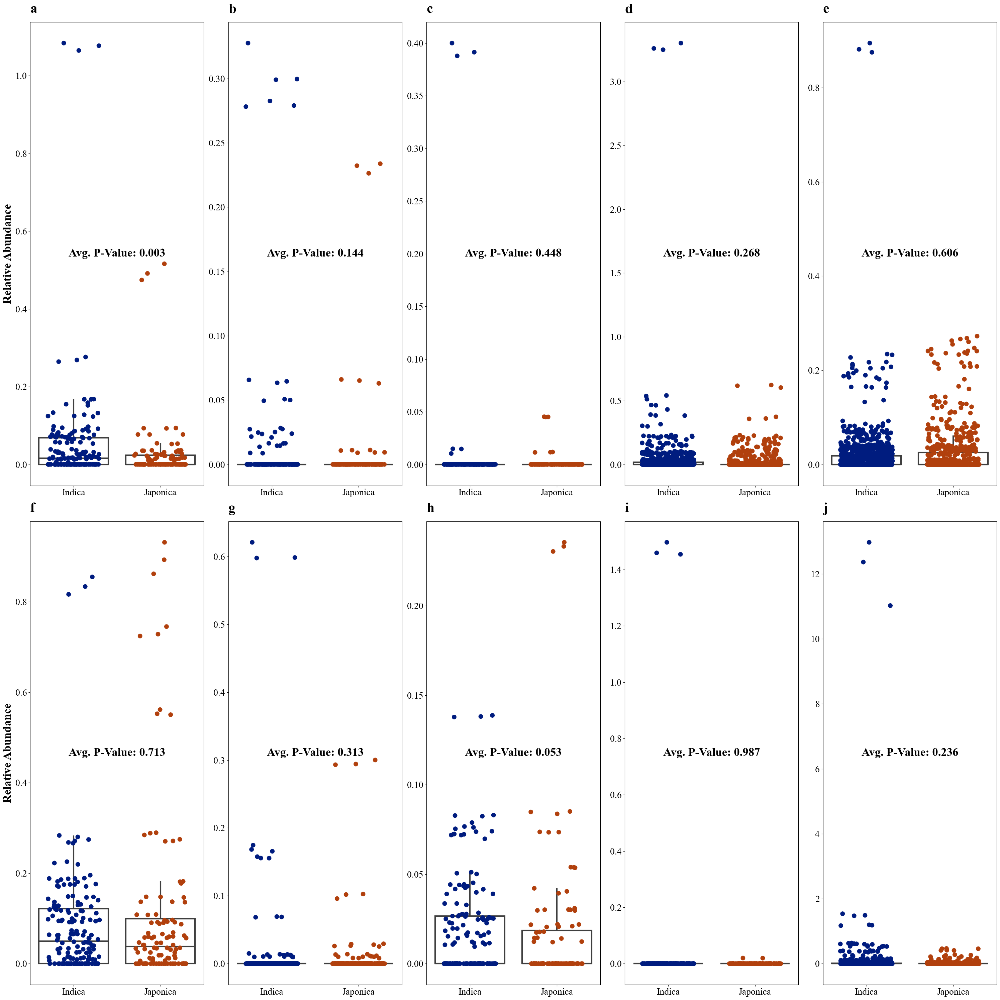

In [146]:
# Set the font globally to Times New Roman
plt.rcParams['font.family'] = 'Times New Roman'

# Create a 5x2 grid of subplots with increased width
fig, axes = plt.subplots(2, 5, figsize=(30, 30))  # Increased width for better spacing

# Define titles for each subplot
titles = ["a", "b", "c", "d", "e", "f", "g", "h", "i", "j"]

# Define a two-color palette for "Indica" and "Japonica"
palette = sns.color_palette("dark", 2)  
group_order = ["Indica", "Japonica"]
color_map = dict(zip(group_order, palette))  # {'Indica': color1, 'Japonica': color2}

# Loop over each DataFrame and corresponding axis
for i, (df, ax) in enumerate(zip(dfs, axes.flatten())):
    # Ensure index is a column
    df_reset = df.reset_index()

    # Extract the last 10 characters of each genome for hue
    df_reset['Ledger'] = df_reset[df.index.name].astype(str).str[-10:]

    # Create Indica and Japonica groups
    indica_values = df_reset[indica_col].stack().reset_index(drop=True)
    japonica_values = df_reset[japonica_col].stack().reset_index(drop=True)

    # Create DataFrame with Group and Values
    df_plot = pd.DataFrame({
        'Group': ['Indica'] * len(indica_values) + ['Japonica'] * len(japonica_values),
        'Values': pd.concat([indica_values, japonica_values], ignore_index=True),
    })

    # Create boxplot (manually adjust colors later)
    sns.boxplot(x='Group', y='Values', data=df_plot, ax=ax,
                showcaps=False, 
                boxprops={'facecolor': 'none', 'linewidth': 3},  
                showfliers=False, 
                zorder=2,
                medianprops={'linewidth': 3},  
                whiskerprops={'linewidth': 3})  

    # Overlay strip plot (dots) with correct colors and spread them across the width of the boxplot
    sns.stripplot(x='Group', y='Values', hue='Group', data=df_plot, 
                  jitter=0.3, size=10, ax=ax, dodge=False, 
                  palette=color_map, legend=False)  # Adjust jitter to spread dots across the boxplot

    # Manually update the boxplot colors to match dots
    for j, artist in enumerate(ax.artists):  # Loop over box elements
        group = group_order[j]  # Indica or Japonica
        col = color_map[group]  # Get corresponding color

        # Set box edge color
        artist.set_edgecolor(col)

        # Set median and whisker colors
        ax.lines[j * 6 + 4].set_color(col)  # Median line
        ax.lines[j * 6 + 0].set_color(col)  # Whisker 1
        ax.lines[j * 6 + 1].set_color(col)  # Whisker 2

    # Calculate the average P-Value if there are more than one P-values
    avg_p_value = df['P-Value'].mean()
    p_value_text = f"Avg. P-Value: {avg_p_value:.3f}"

    # Add P-Value text inside the plot at middle or above middle position
    ax.text(0.5, 0.5, p_value_text, fontsize=25, fontweight='bold', ha='center', va='center', transform=ax.transAxes)

    # Set titles and labels for each subplot
    ax.set_title(titles[i], fontsize=30, fontweight='bold', pad=20, loc='left')
    ax.tick_params(axis='x', labelsize=20)
    ax.tick_params(axis='y', labelsize=20)

    # Only show Y-axis label for the first plot of each row
    if i % 5 == 0:  # First plot in each row (i=0,5)
        ax.set_ylabel("Relative Abundance", fontsize=25, fontweight='bold')
    else:
        ax.set_ylabel("")  # Hide Y-axis label for other plots

    # Remove x-label for all plots
    ax.set_xlabel("")

# Adjust layout to avoid overlap
plt.tight_layout()

# Save the plot as a PNG image
plt.savefig('carriers.png', format='png', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

In [147]:
indica_col

array(['ERR6050324', 'ERR6050325', 'ERR6050326', 'ERR6050327',
       'ERR6050331', 'ERR6050332', 'ERR6050334', 'ERR6050337',
       'ERR6050338', 'ERR6050344', 'ERR6050345', 'ERR6050348',
       'ERR6050349', 'ERR6050353', 'ERR6050355', 'ERR6050356',
       'ERR6050357', 'ERR6050358', 'ERR6050359', 'ERR6050360',
       'ERR6050361', 'ERR6050363', 'ERR6050364', 'ERR6050365',
       'ERR6050366', 'ERR6050368', 'ERR6050373', 'ERR6050376',
       'ERR6050377', 'ERR6050378', 'ERR6050381', 'ERR6050383',
       'ERR6050385', 'ERR6050388', 'ERR6050389', 'ERR6050391',
       'ERR6050392', 'ERR6050395', 'ERR6050396', 'ERR6050397',
       'ERR6050398', 'ERR6050399', 'ERR6050400', 'ERR6050401',
       'ERR6050402', 'ERR6050403', 'ERR6050404', 'ERR6050406',
       'ERR6050407', 'ERR6050408', 'ERR6050418', 'ERR6050422',
       'ERR6050423', 'ERR6050426', 'ERR6050427', 'ERR6050430',
       'ERR6050434', 'ERR6050435', 'ERR6050436', 'ERR6050437',
       'ERR6050441', 'ERR6050442', 'ERR6050444', 'ERR60

In [148]:
coxl_sum.index

Index(['Aureimonas_sp', 'Burkholderiaceae_bacterium', 'Pseudorhodoferax_sp',
       'Pseudacidovorax_sp', 'Deinococcus_sp', 'Methylobacterium_sp',
       'Variovorax_sp', 'Microbacterium_sp', 'Acidovorax_sp', 'Comamonas_sp'],
      dtype='object')

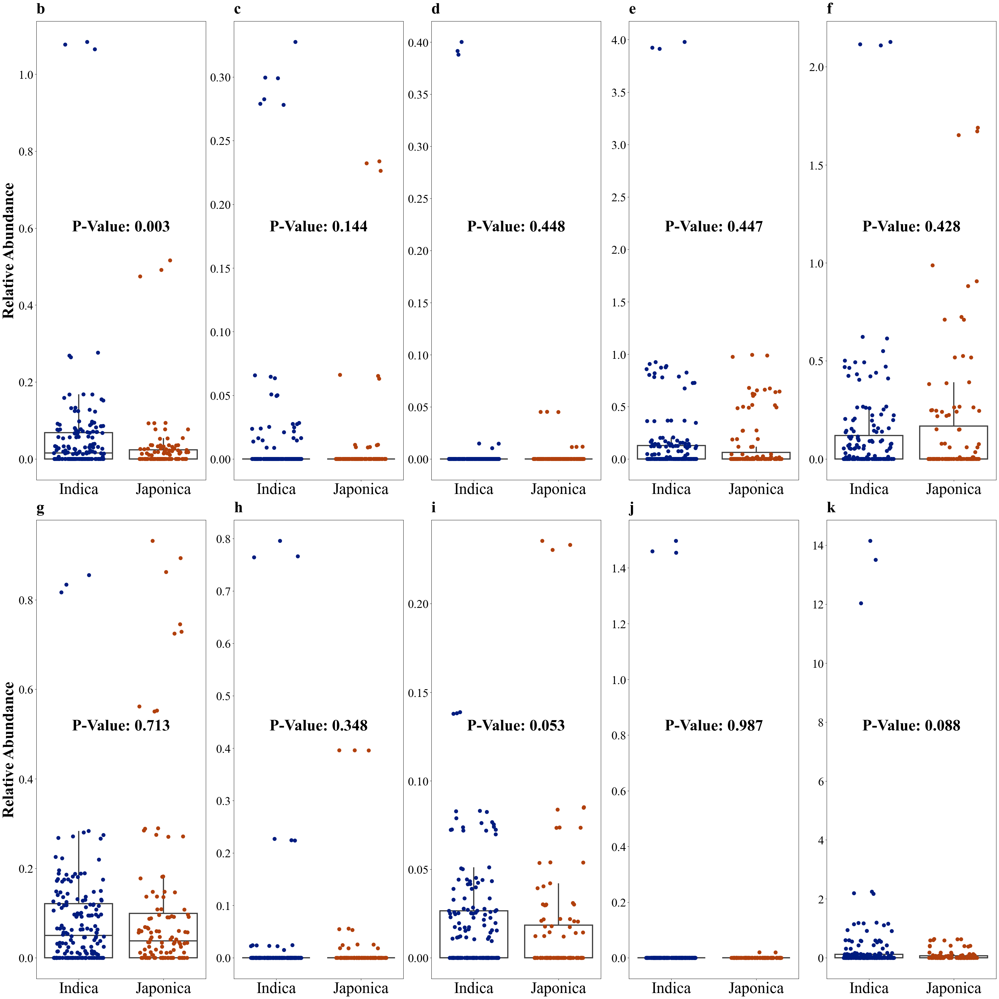

In [182]:
# Define row indices (these are the specific rows we are targeting)
row_indices = [
    'Aureimonas_sp', 'Burkholderiaceae_bacterium', 'Pseudorhodoferax_sp',
    'Pseudacidovorax_sp', 'Deinococcus_sp', 'Methylobacterium_sp',
    'Variovorax_sp', 'Microbacterium_sp', 'Acidovorax_sp', 'Comamonas_sp'
]

# Set the font globally to Times New Roman
plt.rcParams['font.family'] = 'Times New Roman'

# Create a 5x2 grid of subplots with increased width
fig, axes = plt.subplots(2, 5, figsize=(35, 35))  # Increased width for better spacing

# Define titles for each subplot
titles = ["b", "c", "d", "e", "f", "g", "h", "i", "j", "k"]

# Define a two-color palette for "Indica" and "Japonica"
palette = sns.color_palette("dark", 2)  
group_order = ["Indica", "Japonica"]
color_map = dict(zip(group_order, palette))  # {'Indica': color1, 'Japonica': color2}

# Loop through each axis and plot
for i, ax in enumerate(axes.flatten()):
    # Extract the row corresponding to the current plot title
    row_data = coxl_sum.loc[row_indices[i], [*indica_col, *japonica_col]]
    
    # Create a DataFrame with Group and Values for plotting
    df_plot = pd.DataFrame({
        'Group': ['Indica'] * len(row_data[indica_col]) + ['Japonica'] * len(row_data[japonica_col]),
        'Values': pd.concat([row_data[indica_col], row_data[japonica_col]], ignore_index=True),
    })
    
    # Create the boxplot
    sns.boxplot(x='Group', y='Values', data=df_plot, ax=ax,
                showcaps=False, 
                boxprops={'facecolor': 'none', 'linewidth': 3},  
                showfliers=False, 
                zorder=2,
                medianprops={'linewidth': 3},  
                whiskerprops={'linewidth': 3})  

    # Overlay strip plot (dots) with correct colors and spread them across the width of the boxplot
    sns.stripplot(x='Group', y='Values', hue='Group', data=df_plot, 
                  jitter=0.3, size=10, ax=ax, dodge=False, 
                  palette=color_map, legend=False)  # Adjust jitter to spread dots across the boxplot

    # Manually update the boxplot colors to match dots
    for j, artist in enumerate(ax.artists):  # Loop over box elements
        group = group_order[j]  # Indica or Japonica
        col = color_map[group]  # Get corresponding color

        # Set box edge color
        artist.set_edgecolor(col)

        # Set median and whisker colors
        ax.lines[j * 6 + 4].set_color(col)  # Median line
        ax.lines[j * 6 + 0].set_color(col)  # Whisker 1
        ax.lines[j * 6 + 1].set_color(col)  # Whisker 2

    # Extract P-Value for the current row (don't take mean, just use the value from the row)
    p_value = coxl_sum.loc[row_indices[i], 'P-Value']  # Assuming 'P-Value' is a column in coxl_sum
    
    # Add P-Value text inside the plot at middle or above middle position
    p_value_text = f"P-Value: {p_value:.3f}"

    ax.text(0.5, 0.55, p_value_text, fontsize=40, fontweight='bold', ha='center', va='center', transform=ax.transAxes)

    # Set titles and labels for each subplot
    ax.set_title(titles[i], fontsize=40, fontweight='bold', pad=20, loc='left')
    ax.tick_params(axis='x', labelsize=40)
    ax.tick_params(axis='y', labelsize=30)

    # Only show Y-axis label for the first plot of each row
    if i % 5 == 0:  # First plot in each row (i=0,5)
        ax.set_ylabel("Relative Abundance", fontsize=40, fontweight='bold')
    else:
        ax.set_ylabel("")  # Hide Y-axis label for other plots

    # Remove x-label for all plots
    ax.set_xlabel("")

# Adjust layout to avoid overlap
plt.tight_layout()

# Save the plot as a PNG image
plt.savefig('carriers1.png', format='png', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

<h1 style="font-family: 'Times New Roman'; text-align: center; font-weight: bold;">
    Correlation Analysis
</h1></p>

<h2 style="font-family: 'Times New Roman'; font-weight: bold;">
    Import Processed Lignin Precursor File
</h2>

In [284]:
avg_lignin = open_file('average_lignin.csv')
avg_lignin

,IRRI seed bank ID,Subgroup,HCA (mg/g),LPA (mg/g),FLA (mg/g),CFA (mg/g),SPLT (mg/g),Genomes
0,IRGC 117429,indica,1.583042,1.624676,0.432708,0.468823,0.216404,ERR6050423; ERR6050533; ERR6050643
1,IRGC 117459,indica,0.987260,1.144094,0.815006,0.510651,0.294052,ERR6050364; ERR6050474; ERR6050584
2,IRGC 117545,indica,1.024359,0.154627,0.121395,0.552479,0.212381,ERR6050368; ERR6050478; ERR6050588
3,IRGC 120851,indica,0.909492,0.929040,0.393904,0.636135,0.132513,ERR6050365; ERR6050475; ERR6050585
4,IRGC 120893,indica,0.356923,0.147178,0.442732,0.677963,0.232877,ERR6050396; ERR6050506; ERR6050616
...,...,...,...,...,...,...,...,...
87,IRGC 121843,japonica,2.804194,1.468281,0.299404,0.227990,0.284737,ERR6050417; ERR6050527; ERR6050637
88,IRGC 121850,indica,1.528734,0.862658,0.382278,0.252052,0.262026,ERR6050430; ERR6050540; ERR6050650
89,IRGC 121859,japonica,2.784432,1.744261,0.775551,0.587699,0.155087,ERR6050411; ERR6050521; ERR6050631
90,IRGC 121872,indica,0.927439,0.464589,0.443157,0.355286,0.169583,ERR6050355; ERR6050465; ERR6050575


In [286]:
genomes = []

for index, row in avg_lignin.iterrows():
    genome = row['Genomes'].split('; ')
    for values in genome:
        genomes.append({'Metagenomes': values, 'HCA (mg/g)': row['HCA (mg/g)'], 'LPA (mg/g)': row['LPA (mg/g)'], 'FLA (mg/g)': row['FLA (mg/g)'], 'CFA (mg/g)': row['CFA (mg/g)'], 'SPLT (mg/g)': row['SPLT (mg/g)']})

lignin = pd.DataFrame(genomes)
lignin

,Metagenomes,HCA (mg/g),LPA (mg/g),FLA (mg/g),CFA (mg/g),SPLT (mg/g)
0,ERR6050423,1.583042,1.624676,0.432708,0.468823,0.216404
1,ERR6050533,1.583042,1.624676,0.432708,0.468823,0.216404
2,ERR6050643,1.583042,1.624676,0.432708,0.468823,0.216404
3,ERR6050364,0.987260,1.144094,0.815006,0.510651,0.294052
4,ERR6050474,0.987260,1.144094,0.815006,0.510651,0.294052
...,...,...,...,...,...,...
271,ERR6050465,0.927439,0.464589,0.443157,0.355286,0.169583
272,ERR6050575,0.927439,0.464589,0.443157,0.355286,0.169583
273,ERR6050408,0.948331,0.817117,0.191811,0.330291,0.158741
274,ERR6050518,0.948331,0.817117,0.191811,0.330291,0.158741


In [288]:
lignin = lignin.set_index('Metagenomes')

In [290]:
# Transpose the df (row into column and column into row)
lignin = lignin.T
lignin

Metagenomes,ERR6050423,ERR6050533,ERR6050643,ERR6050364,ERR6050474,ERR6050584,ERR6050368,ERR6050478,ERR6050588,ERR6050365,...,ERR6050650,ERR6050411,ERR6050521,ERR6050631,ERR6050355,ERR6050465,ERR6050575,ERR6050408,ERR6050518,ERR6050628
HCA (mg/g),1.583042,1.583042,1.583042,0.987260,0.987260,0.987260,1.024359,1.024359,1.024359,0.909492,...,1.528734,2.784432,2.784432,2.784432,0.927439,0.927439,0.927439,0.948331,0.948331,0.948331
LPA (mg/g),1.624676,1.624676,1.624676,1.144094,1.144094,1.144094,0.154627,0.154627,0.154627,0.929040,...,0.862658,1.744261,1.744261,1.744261,0.464589,0.464589,0.464589,0.817117,0.817117,0.817117
FLA (mg/g),0.432708,0.432708,0.432708,0.815006,0.815006,0.815006,0.121395,0.121395,0.121395,0.393904,...,0.382278,0.775551,0.775551,0.775551,0.443157,0.443157,0.443157,0.191811,0.191811,0.191811
CFA (mg/g),0.468823,0.468823,0.468823,0.510651,0.510651,0.510651,0.552479,0.552479,0.552479,0.636135,...,0.252052,0.587699,0.587699,0.587699,0.355286,0.355286,0.355286,0.330291,0.330291,0.330291
SPLT (mg/g),0.216404,0.216404,0.216404,0.294052,0.294052,0.294052,0.212381,0.212381,0.212381,0.132513,...,0.262026,0.155087,0.155087,0.155087,0.169583,0.169583,0.169583,0.158741,0.158741,0.158741


In [292]:
# fetch the coxl df (or import coxl file)
coxl = pd.read_csv('coxl.csv')
coxl

,Genome,ERR6050324,ERR6050325,ERR6050326,ERR6050327,ERR6050331,ERR6050332,ERR6050334,ERR6050337,ERR6050338,...,ERR6050635,ERR6050636,ERR6050637,ERR6050639,ERR6050640,ERR6050641,ERR6050644,ERR6050645,ERR6050648,ERR6050649
0,unmapped,99.801146,99.224599,95.176760,96.207053,99.473535,87.651661,100.0,99.101548,100.0,...,99.981513,100.0,99.987619,100.0,100.0,99.600968,99.902519,100.0,99.846171,100.0
1,Pseudorhodoferax_sp._ERS6626941,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
2,Comamonas_sp._ERS6626650,0.000000,0.000000,0.000000,0.070546,0.000000,0.000000,0.0,0.000000,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.011315,0.000000,0.0,0.000000,0.0
3,Methylobacterium_sp._ERS6627288,0.015295,0.174915,0.130110,0.091941,0.000000,0.094978,0.0,0.135731,0.0,...,0.018487,0.0,0.012381,0.0,0.0,0.000000,0.024904,0.0,0.135822,0.0
4,Deinococcus_sp._ERS6627335,0.000000,0.044219,0.030060,0.000000,0.000000,0.020661,0.0,0.074418,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
5,Pseudacidovorax_sp._ERS6627003,0.007145,0.000000,0.075032,0.000000,0.000000,0.000000,0.0,0.009820,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
6,Comamonas_sp._ERS6626602,0.000000,0.000000,0.000000,1.488315,0.136045,0.473450,0.0,0.000000,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.131751,0.017999,0.0,0.000000,0.0
7,Deinococcus_sp._ERS6627293,0.000000,0.050215,0.035924,0.000000,0.000000,0.023930,0.0,0.086611,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
8,Deinococcus_sp._ERS6626820,0.000000,0.050547,0.036680,0.000000,0.000000,0.024872,0.0,0.136374,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
9,Pseudacidovorax_sp._ERS6626850,0.006779,0.000000,0.075649,0.000000,0.000000,0.000000,0.0,0.011344,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0


In [294]:
# No need of unmapped row for correlation study
coxl = coxl.drop(0)

In [296]:
coxl = coxl.set_index('Genome')
coxl

,ERR6050324,ERR6050325,ERR6050326,ERR6050327,ERR6050331,ERR6050332,ERR6050334,ERR6050337,ERR6050338,ERR6050344,...,ERR6050635,ERR6050636,ERR6050637,ERR6050639,ERR6050640,ERR6050641,ERR6050644,ERR6050645,ERR6050648,ERR6050649
Genome,,,,,,,,,,,,,,,,,,,,,
Pseudorhodoferax_sp._ERS6626941,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
Comamonas_sp._ERS6626650,0.000000,0.000000,0.000000,0.070546,0.000000,0.000000,0.0,0.000000,0.0,0.000000,...,0.000000,0.0,0.000000,0.0,0.0,0.011315,0.000000,0.0,0.000000,0.0
Methylobacterium_sp._ERS6627288,0.015295,0.174915,0.130110,0.091941,0.000000,0.094978,0.0,0.135731,0.0,0.055849,...,0.018487,0.0,0.012381,0.0,0.0,0.000000,0.024904,0.0,0.135822,0.0
Deinococcus_sp._ERS6627335,0.000000,0.044219,0.030060,0.000000,0.000000,0.020661,0.0,0.074418,0.0,0.037351,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
Pseudacidovorax_sp._ERS6627003,0.007145,0.000000,0.075032,0.000000,0.000000,0.000000,0.0,0.009820,0.0,0.000000,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
Comamonas_sp._ERS6626602,0.000000,0.000000,0.000000,1.488315,0.136045,0.473450,0.0,0.000000,0.0,0.000000,...,0.000000,0.0,0.000000,0.0,0.0,0.131751,0.017999,0.0,0.000000,0.0
Deinococcus_sp._ERS6627293,0.000000,0.050215,0.035924,0.000000,0.000000,0.023930,0.0,0.086611,0.0,0.042869,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
Deinococcus_sp._ERS6626820,0.000000,0.050547,0.036680,0.000000,0.000000,0.024872,0.0,0.136374,0.0,0.037691,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
Pseudacidovorax_sp._ERS6626850,0.006779,0.000000,0.075649,0.000000,0.000000,0.000000,0.0,0.011344,0.0,0.000000,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0


In [298]:
common_columns = coxl.columns.intersection(lignin.columns).tolist()
print(common_columns)
print(len(common_columns))

['ERR6050324', 'ERR6050325', 'ERR6050326', 'ERR6050327', 'ERR6050331', 'ERR6050332', 'ERR6050334', 'ERR6050337', 'ERR6050338', 'ERR6050344', 'ERR6050345', 'ERR6050348', 'ERR6050349', 'ERR6050353', 'ERR6050355', 'ERR6050356', 'ERR6050357', 'ERR6050358', 'ERR6050359', 'ERR6050360', 'ERR6050361', 'ERR6050363', 'ERR6050364', 'ERR6050365', 'ERR6050366', 'ERR6050368', 'ERR6050373', 'ERR6050376', 'ERR6050377', 'ERR6050378', 'ERR6050381', 'ERR6050383', 'ERR6050385', 'ERR6050388', 'ERR6050389', 'ERR6050391', 'ERR6050392', 'ERR6050395', 'ERR6050396', 'ERR6050397', 'ERR6050398', 'ERR6050399', 'ERR6050400', 'ERR6050401', 'ERR6050402', 'ERR6050403', 'ERR6050404', 'ERR6050406', 'ERR6050407', 'ERR6050408', 'ERR6050418', 'ERR6050422', 'ERR6050423', 'ERR6050426', 'ERR6050427', 'ERR6050430', 'ERR6050434', 'ERR6050435', 'ERR6050436', 'ERR6050437', 'ERR6050441', 'ERR6050442', 'ERR6050444', 'ERR6050447', 'ERR6050448', 'ERR6050454', 'ERR6050455', 'ERR6050458', 'ERR6050459', 'ERR6050463', 'ERR6050465', 'ERR6

In [299]:
print(coverm[common_columns].head())
print(lignin[common_columns].head())

   ERR6050324  ERR6050325  ERR6050326  ERR6050327  ERR6050331  ERR6050332  \
0    9.351004    8.905262   57.412613   44.216846   12.173146   11.076582   
1    0.000000    0.167018    0.132595    0.031797    0.000000    0.108736   
2    0.230631    0.034397    0.031363    0.000000    0.000000    0.000000   
3    0.036411    0.000000    0.000000    0.000000    0.000000    0.041183   
4    0.000000    0.000000    0.000000    0.000000    0.000000    0.106024   

   ERR6050334  ERR6050337  ERR6050338  ERR6050344  ...  ERR6050635  \
0    6.885743   11.234069    7.474935   10.439724  ...    6.686354   
1    0.000000    0.174097    0.000000    0.006498  ...    0.025304   
2    0.036559    0.258606    1.171289    0.317798  ...    0.075384   
3    0.000000    0.000000    0.000000    0.000000  ...    0.000000   
4    0.000000    0.000000    0.000000    0.000000  ...    0.000000   

   ERR6050636  ERR6050637  ERR6050639  ERR6050640  ERR6050641  ERR6050644  \
0    7.428908   23.283178    6.457824  

In [302]:
sub_lignin = lignin[common_columns]
sub_lignin

Metagenomes,ERR6050324,ERR6050325,ERR6050326,ERR6050327,ERR6050331,ERR6050332,ERR6050334,ERR6050337,ERR6050338,ERR6050344,...,ERR6050635,ERR6050636,ERR6050637,ERR6050639,ERR6050640,ERR6050641,ERR6050644,ERR6050645,ERR6050648,ERR6050649
HCA (mg/g),4.053818,1.297702,0.678492,1.302806,0.909263,0.287833,0.765135,0.772853,0.567879,0.710608,...,2.374529,2.042772,2.804194,2.352775,3.375557,2.511995,2.521238,4.626686,1.975501,4.415855
LPA (mg/g),4.479423,2.090554,0.477110,0.709766,0.129872,0.255859,0.722608,0.685973,0.797529,0.568315,...,0.719747,1.063726,1.468281,0.337893,4.121302,0.160128,1.865643,3.564500,1.414824,2.491817
FLA (mg/g),0.732344,0.410551,0.455427,0.227444,0.280427,0.155081,0.257215,0.315430,0.157913,0.259640,...,0.786299,1.139725,0.299404,0.233898,0.155342,0.209199,0.261919,0.614837,0.673685,0.986845
CFA (mg/g),1.220339,0.723277,0.252706,0.401645,0.418336,0.277977,0.203357,0.133616,0.765105,0.244356,...,0.782159,0.438874,0.227990,1.196646,0.169190,0.933898,1.367797,1.401695,0.626982,1.420339
SPLT (mg/g),0.411761,0.197954,0.258504,0.153333,0.535029,0.258504,0.327102,0.386684,0.145830,0.212623,...,0.474394,0.282637,0.284737,0.267945,0.385797,0.506914,0.520993,0.397074,0.447429,0.380388


In [304]:
columns = coxl.columns.intersection(sub_lignin.columns).tolist()
print(columns)
len(columns)

['ERR6050324', 'ERR6050325', 'ERR6050326', 'ERR6050327', 'ERR6050331', 'ERR6050332', 'ERR6050334', 'ERR6050337', 'ERR6050338', 'ERR6050344', 'ERR6050345', 'ERR6050348', 'ERR6050349', 'ERR6050353', 'ERR6050355', 'ERR6050356', 'ERR6050357', 'ERR6050358', 'ERR6050359', 'ERR6050360', 'ERR6050361', 'ERR6050363', 'ERR6050364', 'ERR6050365', 'ERR6050366', 'ERR6050368', 'ERR6050373', 'ERR6050376', 'ERR6050377', 'ERR6050378', 'ERR6050381', 'ERR6050383', 'ERR6050385', 'ERR6050388', 'ERR6050389', 'ERR6050391', 'ERR6050392', 'ERR6050395', 'ERR6050396', 'ERR6050397', 'ERR6050398', 'ERR6050399', 'ERR6050400', 'ERR6050401', 'ERR6050402', 'ERR6050403', 'ERR6050404', 'ERR6050406', 'ERR6050407', 'ERR6050408', 'ERR6050418', 'ERR6050422', 'ERR6050423', 'ERR6050426', 'ERR6050427', 'ERR6050430', 'ERR6050434', 'ERR6050435', 'ERR6050436', 'ERR6050437', 'ERR6050441', 'ERR6050442', 'ERR6050444', 'ERR6050447', 'ERR6050448', 'ERR6050454', 'ERR6050455', 'ERR6050458', 'ERR6050459', 'ERR6050463', 'ERR6050465', 'ERR6

276

In [306]:
coverm = coverm.drop(index=0)
coverm

,Genome,ERR6050324,ERR6050325,ERR6050326,ERR6050327,ERR6050331,ERR6050332,ERR6050334,ERR6050337,ERR6050338,...,ERR6050635,ERR6050636,ERR6050637,ERR6050639,ERR6050640,ERR6050641,ERR6050644,ERR6050645,ERR6050648,ERR6050649
1,Sphingomonas_sp._ERS6626783,0.000000,0.167018,0.132595,0.031797,0.000000,0.108736,0.000000,0.174097,0.000000,...,0.025304,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.158726,0.000000
2,Pseudomonas_sp._ERS6626560,0.230631,0.034397,0.031363,0.000000,0.000000,0.000000,0.036559,0.258606,1.171289,...,0.075384,0.000000,0.039736,0.161413,0.074147,0.000000,0.124540,0.013201,0.101921,0.000000
3,Chryseobacterium_sp._ERS6626743,0.036411,0.000000,0.000000,0.000000,0.000000,0.041183,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,Ochrobactrum_sp._ERS6627020,0.000000,0.000000,0.000000,0.000000,0.000000,0.106024,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
5,Chryseobacterium_sp._ERS6626898,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
565,Acidovorax_sp._ERS6626918,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.026366,0.000000,0.000000
566,Mucilaginibacter_sp._ERS6626972,0.000000,0.000000,0.060644,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
567,Acinetobacter_sp._ERS6626625,0.652187,1.075689,0.012135,0.000000,0.017753,0.083050,2.198418,0.414455,0.056489,...,1.502163,1.713177,1.447660,1.660427,1.524921,0.035976,0.031671,1.745361,0.053249,1.778087
568,Paenibacillus_sp._ERS6627323,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.023331,0.076709,0.000000,5.840695,0.000000,0.074736,0.000000


In [308]:
coverm = coverm.set_index('Genome')
coverm

,ERR6050324,ERR6050325,ERR6050326,ERR6050327,ERR6050331,ERR6050332,ERR6050334,ERR6050337,ERR6050338,ERR6050344,...,ERR6050635,ERR6050636,ERR6050637,ERR6050639,ERR6050640,ERR6050641,ERR6050644,ERR6050645,ERR6050648,ERR6050649
Genome,,,,,,,,,,,,,,,,,,,,,
Sphingomonas_sp._ERS6626783,0.000000,0.167018,0.132595,0.031797,0.000000,0.108736,0.000000,0.174097,0.000000,0.006498,...,0.025304,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.158726,0.000000
Pseudomonas_sp._ERS6626560,0.230631,0.034397,0.031363,0.000000,0.000000,0.000000,0.036559,0.258606,1.171289,0.317798,...,0.075384,0.000000,0.039736,0.161413,0.074147,0.000000,0.124540,0.013201,0.101921,0.000000
Chryseobacterium_sp._ERS6626743,0.036411,0.000000,0.000000,0.000000,0.000000,0.041183,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Ochrobactrum_sp._ERS6627020,0.000000,0.000000,0.000000,0.000000,0.000000,0.106024,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Chryseobacterium_sp._ERS6626898,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.144813,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Acidovorax_sp._ERS6626918,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.026366,0.000000,0.000000
Mucilaginibacter_sp._ERS6626972,0.000000,0.000000,0.060644,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Acinetobacter_sp._ERS6626625,0.652187,1.075689,0.012135,0.000000,0.017753,0.083050,2.198418,0.414455,0.056489,1.263456,...,1.502163,1.713177,1.447660,1.660427,1.524921,0.035976,0.031671,1.745361,0.053249,1.778087


In [310]:
# Extract the prefix from the index (excluding the last 11 characters)
coverm['Prefix'] = coverm.index.str[:-11]

# Get the unique prefixes
unique_prefixes = coverm['Prefix'].unique()

coverm = coverm.drop(columns=['Prefix'])

# Display the unique prefixes
print(unique_prefixes)

['Sphingomonas_sp.' 'Pseudomonas_sp.' 'Chryseobacterium_sp.'
 'Ochrobactrum_sp.' 'Naasia_sp.' 'Pseudorhodoferax_sp.'
 'Exiguobacterium_sp.' 'Novosphingobium_sp.' 'Enterobacter_sp.'
 'Herbaspirillum_sp.' 'Xylophilus_sp.' 'Agrobacterium_sp.'
 'Hymenobacter_sp.' 'Acidovorax_sp.' 'Paenibacillus_sp.' 'Comamonas_sp.'
 'Acinetobacter_sp.' 'Mucilaginibacter_sp.' 'Leucobacter_sp.'
 'Spirosoma_sp.' 'Siphonobacter_sp.' 'Burkholderiaceae_bacterium'
 'Aureimonas_sp.' 'Brevundimonas_sp.' 'Serratia_sp.' 'Pantoea_sp.'
 'Xanthomonas_sp.' 'Curtobacterium_sp.' 'Massilia_sp.'
 'Bdellovibrionaceae_bacterium' 'Pedobacter_sp.' 'Sphingobacterium_sp.'
 'Stenotrophomonas_sp.' 'Enterococcus_sp.' 'Microbacterium_sp.'
 'Methylobacterium_sp.' 'Bacillus_sp.' 'Luteibacter_sp.' 'Roseateles_sp.'
 'Flavobacterium_sp.' 'Deinococcus_sp.' 'Pseudacidovorax_sp.'
 'Klebsiella_sp.' 'Cystobacter_sp.' 'Erwinia_sp.' 'Epilithonimonas_sp.'
 'Pelomonas_sp.' 'Achromobacter_sp.' 'Patescibacteria_group_bacterium'
 'Caulobacter_sp.' 'Ps

In [312]:
# Initialize an empty list to store the mean DataFrames
sum_df_list = []

# Loop through each prefix and filter the DataFrame
for prefix in unique_prefixes:
    # Filter rows where the index starts with the prefix
    filtered_df = coverm[coverm.index.str.startswith(prefix)]
    
    # Calculate the mean across the columns for the filtered DataFrame
    sum_df = filtered_df.sum(axis=0)
    
    # Set the index name as the prefix (optional, depending on how you want the result to look)
    sum_df.name = prefix
    
    # Append the mean DataFrame to the list
    sum_df_list.append(sum_df)

# Concatenate all the mean DataFrames into a single DataFrame
coverm_sum = pd.concat(sum_df_list, axis=1).T  # .T transposes the DataFrame to have prefixes as rows
coverm_sum

,ERR6050324,ERR6050325,ERR6050326,ERR6050327,ERR6050331,ERR6050332,ERR6050334,ERR6050337,ERR6050338,ERR6050344,...,ERR6050635,ERR6050636,ERR6050637,ERR6050639,ERR6050640,ERR6050641,ERR6050644,ERR6050645,ERR6050648,ERR6050649
Sphingomonas_sp.,3.088762,2.677717,5.794847,2.698665,0.056472,4.315924,0.192595,11.937784,0.116418,0.787710,...,0.676322,0.009000,0.813969,0.044093,0.651196,0.000000,2.861221,0.284355,6.538360,0.015511
Pseudomonas_sp.,13.874891,11.111506,1.095330,0.265658,0.022596,2.948440,6.198513,8.442147,47.457836,7.017916,...,2.901161,0.073936,1.013474,2.201503,2.375994,0.009430,6.217001,0.951836,57.201068,0.379635
Chryseobacterium_sp.,1.438284,8.962829,11.859802,2.227674,0.153514,16.237188,0.595375,26.544391,0.608934,0.717392,...,1.601706,0.000000,2.519948,0.000000,0.169460,0.026625,0.752962,0.288000,0.893374,0.026837
Ochrobactrum_sp.,0.000000,0.000000,0.000000,0.000000,0.000000,0.150824,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Naasia_sp.,0.043865,0.043056,0.123449,0.314996,0.000000,0.476933,0.000000,0.197826,0.000000,0.000000,...,0.000000,0.000000,0.120026,0.000000,0.000000,0.000000,0.054874,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Variovorax_sp.,0.000000,0.000000,0.015025,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Sphingobium_sp.,0.013549,0.020701,0.182854,0.000000,0.000000,0.022191,0.000000,0.078722,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.025153,0.000000
Rhizobiaceae_bacterium,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Cupriavidus_sp.,0.000000,0.000000,0.000000,1.017099,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.048689,0.000000,0.000000,0.000000


In [313]:
# Merge coverm and further processed lignin dfs to match the value
coverm_merged = pd.concat([coverm, sub_lignin], axis=0)
coverm_merged

,ERR6050324,ERR6050325,ERR6050326,ERR6050327,ERR6050331,ERR6050332,ERR6050334,ERR6050337,ERR6050338,ERR6050344,...,ERR6050635,ERR6050636,ERR6050637,ERR6050639,ERR6050640,ERR6050641,ERR6050644,ERR6050645,ERR6050648,ERR6050649
Sphingomonas_sp._ERS6626783,0.000000,0.167018,0.132595,0.031797,0.000000,0.108736,0.000000,0.174097,0.000000,0.006498,...,0.025304,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.158726,0.000000
Pseudomonas_sp._ERS6626560,0.230631,0.034397,0.031363,0.000000,0.000000,0.000000,0.036559,0.258606,1.171289,0.317798,...,0.075384,0.000000,0.039736,0.161413,0.074147,0.000000,0.124540,0.013201,0.101921,0.000000
Chryseobacterium_sp._ERS6626743,0.036411,0.000000,0.000000,0.000000,0.000000,0.041183,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Ochrobactrum_sp._ERS6627020,0.000000,0.000000,0.000000,0.000000,0.000000,0.106024,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Chryseobacterium_sp._ERS6626898,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.144813,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HCA (mg/g),4.053818,1.297702,0.678492,1.302806,0.909263,0.287833,0.765135,0.772853,0.567879,0.710608,...,2.374529,2.042772,2.804194,2.352775,3.375557,2.511995,2.521238,4.626686,1.975501,4.415855
LPA (mg/g),4.479423,2.090554,0.477110,0.709766,0.129872,0.255859,0.722608,0.685973,0.797529,0.568315,...,0.719747,1.063726,1.468281,0.337893,4.121302,0.160128,1.865643,3.564500,1.414824,2.491817
FLA (mg/g),0.732344,0.410551,0.455427,0.227444,0.280427,0.155081,0.257215,0.315430,0.157913,0.259640,...,0.786299,1.139725,0.299404,0.233898,0.155342,0.209199,0.261919,0.614837,0.673685,0.986845
CFA (mg/g),1.220339,0.723277,0.252706,0.401645,0.418336,0.277977,0.203357,0.133616,0.765105,0.244356,...,0.782159,0.438874,0.227990,1.196646,0.169190,0.933898,1.367797,1.401695,0.626982,1.420339


In [316]:
numeric_data = coverm_merged.select_dtypes(include=[float, int])  # Select only numeric columns

# Step 1: Transpose the DataFrame so that we can calculate correlation between genomes (rows) and lignin precursors (columns)
coverm_transposed = numeric_data.T
coverm_transposed

,Sphingomonas_sp._ERS6626783,Pseudomonas_sp._ERS6626560,Chryseobacterium_sp._ERS6626743,Ochrobactrum_sp._ERS6627020,Chryseobacterium_sp._ERS6626898,Naasia_sp._ERS6627292,Pseudorhodoferax_sp._ERS6626941,Exiguobacterium_sp._ERS6626708,Novosphingobium_sp._ERS6626794,Chryseobacterium_sp._ERS6626581,...,Acidovorax_sp._ERS6626918,Mucilaginibacter_sp._ERS6626972,Acinetobacter_sp._ERS6626625,Paenibacillus_sp._ERS6627323,Pseudomonas_sp._ERS6626978,HCA (mg/g),LPA (mg/g),FLA (mg/g),CFA (mg/g),SPLT (mg/g)
ERR6050324,0.000000,0.230631,0.036411,0.0,0.0,0.009464,0.0,7.192362,0.008940,0.0,...,0.000000,0.000000,0.652187,0.000000,0.145366,4.053818,4.479423,0.732344,1.220339,0.411761
ERR6050325,0.167018,0.034397,0.000000,0.0,0.0,0.013806,0.0,0.327856,0.000000,0.0,...,0.000000,0.000000,1.075689,0.000000,0.042188,1.297702,2.090554,0.410551,0.723277,0.197954
ERR6050326,0.132595,0.031363,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.088055,0.0,...,0.000000,0.060644,0.012135,0.000000,0.020548,0.678492,0.477110,0.455427,0.252706,0.258504
ERR6050327,0.031797,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.302806,0.709766,0.227444,0.401645,0.153333
ERR6050331,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,...,0.000000,0.000000,0.017753,0.000000,0.000000,0.909263,0.129872,0.280427,0.418336,0.535029
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ERR6050641,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.029673,0.000000,0.0,...,0.000000,0.000000,0.035976,0.000000,0.000000,2.511995,0.160128,0.209199,0.933898,0.506914
ERR6050644,0.000000,0.124540,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,...,0.000000,0.000000,0.031671,5.840695,0.088105,2.521238,1.865643,0.261919,1.367797,0.520993
ERR6050645,0.000000,0.013201,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,...,0.026366,0.000000,1.745361,0.000000,0.010578,4.626686,3.564500,0.614837,1.401695,0.397074
ERR6050648,0.158726,0.101921,0.000000,0.0,0.0,0.000000,0.0,0.036269,0.083365,0.0,...,0.000000,0.000000,0.053249,0.074736,0.061847,1.975501,1.414824,0.673685,0.626982,0.447429


In [317]:
filtered_mag = open_file(filtered_mag_path)
filtered_mag

,Unnamed: 0,file_name,ID,Sample_ID,SRA_accession,BioSample,Tax_ID,Scientific_name,Sequencing_method,Assembly_Software,Completeness_score,Completeness_software,Contamination_score,Binning_software,Investigation_type,Binning_parameters,Genome
0,1,maxbin_SP106_1.023_cleaned.fasta,maxbin_SP106_1.023_cleaned,maxbin_SP106_1.023_cleaned,ERS6626983,SAMEA8944147,278208,uncultured Spirosoma sp.,Illumina NovaSeq 6000,Megahit,72,CheckM,1,maxbin,metagenome-assembled genome,default,Spirosoma_sp._ERS6626983
1,2,maxbin_SP106_2.001.fasta,maxbin_SP106_2.001,maxbin_SP106_2.001,ERS6626844,SAMEA8944008,227322,uncultured Paenibacillus sp.,Illumina NovaSeq 6000,Megahit,100,CheckM,1,maxbin,metagenome-assembled genome,default,Paenibacillus_sp._ERS6626844
2,3,maxbin_SP106_3.024.fasta,maxbin_SP106_3.024,maxbin_SP106_3.024,ERS6626982,SAMEA8944146,278208,uncultured Spirosoma sp.,Illumina NovaSeq 6000,Megahit,71,CheckM,2,maxbin,metagenome-assembled genome,default,Spirosoma_sp._ERS6626982
3,5,maxbin_SP112_1.001_cleaned.fasta,maxbin_SP112_1.001_cleaned,maxbin_SP112_1.001_cleaned,ERS6626773,SAMEA8943937,202669,uncultured Exiguobacterium sp.,Illumina NovaSeq 6000,Megahit,94,CheckM,1,maxbin,metagenome-assembled genome,default,Exiguobacterium_sp._ERS6626773
4,6,maxbin_SP118_2.002.fasta,maxbin_SP118_2.002,maxbin_SP118_2.002,ERS6626928,SAMEA8944092,259322,uncultured Chryseobacterium sp.,Illumina NovaSeq 6000,Megahit,54,CheckM,2,maxbin,metagenome-assembled genome,default,Chryseobacterium_sp._ERS6626928
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
493,564,SP92_3_metabat2_genome_mining.5_sub.fasta,SP92_3_metabat2_genome_mining.5_sub,SP92_3_metabat2_genome_mining.5_sub,ERS6626796,SAMEA8943960,1913961,Rhizobiaceae bacterium,Illumina NovaSeq 6000,Megahit,96,CheckM,0,metabat2,metagenome-assembled genome,default,Rhizobiaceae_bacterium_ERS6626796
494,565,SP92_3_metabat2_genome_mining.9.fasta,SP92_3_metabat2_genome_mining.9,SP92_3_metabat2_genome_mining.9,ERS6626829,SAMEA8943993,292277,uncultured Novosphingobium sp.,Illumina NovaSeq 6000,Megahit,99,CheckM,0,metabat2,metagenome-assembled genome,default,Novosphingobium_sp._ERS6626829
495,566,SP93_2_metabat2_genome_mining.11.fasta,SP93_2_metabat2_genome_mining.11,SP93_2_metabat2_genome_mining.11,ERS6627002,SAMEA8944166,1805779,uncultured Naasia sp.,Illumina NovaSeq 6000,Megahit,78,CheckM,0,metabat2,metagenome-assembled genome,default,Naasia_sp._ERS6627002
496,567,SP93_2_metabat2_genome_mining.8.fasta,SP93_2_metabat2_genome_mining.8,SP93_2_metabat2_genome_mining.8,ERS6626884,SAMEA8944048,331964,uncultured Curtobacterium sp.,Illumina NovaSeq 6000,Megahit,58,CheckM,1,metabat2,metagenome-assembled genome,default,Curtobacterium_sp._ERS6626884


In [320]:
coverm = open_file('coverm.csv')

In [321]:
coverm

,Genome,ERR6050324,ERR6050325,ERR6050326,ERR6050327,ERR6050331,ERR6050332,ERR6050334,ERR6050337,ERR6050338,...,ERR6050635,ERR6050636,ERR6050637,ERR6050639,ERR6050640,ERR6050641,ERR6050644,ERR6050645,ERR6050648,ERR6050649
0,unmapped,9.351004,8.905262,57.412613,44.216846,12.173146,11.076582,6.885743,11.234069,7.474935,...,6.686354,7.428908,23.283178,6.457824,7.056749,10.786420,15.995842,6.801802,10.294294,6.293827
1,Sphingomonas_sp._ERS6626783,0.000000,0.167018,0.132595,0.031797,0.000000,0.108736,0.000000,0.174097,0.000000,...,0.025304,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.158726,0.000000
2,Pseudomonas_sp._ERS6626560,0.230631,0.034397,0.031363,0.000000,0.000000,0.000000,0.036559,0.258606,1.171289,...,0.075384,0.000000,0.039736,0.161413,0.074147,0.000000,0.124540,0.013201,0.101921,0.000000
3,Chryseobacterium_sp._ERS6626743,0.036411,0.000000,0.000000,0.000000,0.000000,0.041183,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,Ochrobactrum_sp._ERS6627020,0.000000,0.000000,0.000000,0.000000,0.000000,0.106024,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
565,Acidovorax_sp._ERS6626918,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.026366,0.000000,0.000000
566,Mucilaginibacter_sp._ERS6626972,0.000000,0.000000,0.060644,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
567,Acinetobacter_sp._ERS6626625,0.652187,1.075689,0.012135,0.000000,0.017753,0.083050,2.198418,0.414455,0.056489,...,1.502163,1.713177,1.447660,1.660427,1.524921,0.035976,0.031671,1.745361,0.053249,1.778087
568,Paenibacillus_sp._ERS6627323,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.023331,0.076709,0.000000,5.840695,0.000000,0.074736,0.000000


In [324]:
filtered_coverm = coverm[coverm['Genome'].isin(filtered_mag['Genome'])]
filtered_coverm

,Genome,ERR6050324,ERR6050325,ERR6050326,ERR6050327,ERR6050331,ERR6050332,ERR6050334,ERR6050337,ERR6050338,...,ERR6050635,ERR6050636,ERR6050637,ERR6050639,ERR6050640,ERR6050641,ERR6050644,ERR6050645,ERR6050648,ERR6050649
1,Sphingomonas_sp._ERS6626783,0.000000,0.167018,0.132595,0.031797,0.000000,0.108736,0.000000,0.174097,0.000000,...,0.025304,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.158726,0.000000
2,Pseudomonas_sp._ERS6626560,0.230631,0.034397,0.031363,0.000000,0.000000,0.000000,0.036559,0.258606,1.171289,...,0.075384,0.000000,0.039736,0.161413,0.074147,0.000000,0.124540,0.013201,0.101921,0.000000
3,Chryseobacterium_sp._ERS6626743,0.036411,0.000000,0.000000,0.000000,0.000000,0.041183,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,Ochrobactrum_sp._ERS6627020,0.000000,0.000000,0.000000,0.000000,0.000000,0.106024,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
5,Chryseobacterium_sp._ERS6626898,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,Chryseobacterium_sp._ERS6626662,0.011783,0.061677,0.087139,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.007347,0.024358,0.000000
565,Acidovorax_sp._ERS6626918,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.026366,0.000000,0.000000
567,Acinetobacter_sp._ERS6626625,0.652187,1.075689,0.012135,0.000000,0.017753,0.083050,2.198418,0.414455,0.056489,...,1.502163,1.713177,1.447660,1.660427,1.524921,0.035976,0.031671,1.745361,0.053249,1.778087
568,Paenibacillus_sp._ERS6627323,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.023331,0.076709,0.000000,5.840695,0.000000,0.074736,0.000000


In [326]:
filtered_coverm = filtered_coverm.set_index('Genome')
filtered_coverm

,ERR6050324,ERR6050325,ERR6050326,ERR6050327,ERR6050331,ERR6050332,ERR6050334,ERR6050337,ERR6050338,ERR6050344,...,ERR6050635,ERR6050636,ERR6050637,ERR6050639,ERR6050640,ERR6050641,ERR6050644,ERR6050645,ERR6050648,ERR6050649
Genome,,,,,,,,,,,,,,,,,,,,,
Sphingomonas_sp._ERS6626783,0.000000,0.167018,0.132595,0.031797,0.000000,0.108736,0.000000,0.174097,0.000000,0.006498,...,0.025304,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.158726,0.000000
Pseudomonas_sp._ERS6626560,0.230631,0.034397,0.031363,0.000000,0.000000,0.000000,0.036559,0.258606,1.171289,0.317798,...,0.075384,0.000000,0.039736,0.161413,0.074147,0.000000,0.124540,0.013201,0.101921,0.000000
Chryseobacterium_sp._ERS6626743,0.036411,0.000000,0.000000,0.000000,0.000000,0.041183,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Ochrobactrum_sp._ERS6627020,0.000000,0.000000,0.000000,0.000000,0.000000,0.106024,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Chryseobacterium_sp._ERS6626898,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.144813,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Chryseobacterium_sp._ERS6626662,0.011783,0.061677,0.087139,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.007347,0.024358,0.000000
Acidovorax_sp._ERS6626918,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.026366,0.000000,0.000000
Acinetobacter_sp._ERS6626625,0.652187,1.075689,0.012135,0.000000,0.017753,0.083050,2.198418,0.414455,0.056489,1.263456,...,1.502163,1.713177,1.447660,1.660427,1.524921,0.035976,0.031671,1.745361,0.053249,1.778087


In [327]:
# Extract the prefix from the index (excluding the last 11 characters)
filtered_coverm['Prefix'] = filtered_coverm.index.str[:-11]

# Get the unique prefixes
unique_prefixes = filtered_coverm['Prefix'].unique()

filtered_coverm = filtered_coverm.drop(columns=['Prefix'])

# Display the unique prefixes
print(unique_prefixes)

['Sphingomonas_sp.' 'Pseudomonas_sp.' 'Chryseobacterium_sp.'
 'Ochrobactrum_sp.' 'Naasia_sp.' 'Pseudorhodoferax_sp.'
 'Exiguobacterium_sp.' 'Novosphingobium_sp.' 'Enterobacter_sp.'
 'Herbaspirillum_sp.' 'Xylophilus_sp.' 'Hymenobacter_sp.' 'Acidovorax_sp.'
 'Paenibacillus_sp.' 'Comamonas_sp.' 'Acinetobacter_sp.'
 'Mucilaginibacter_sp.' 'Spirosoma_sp.' 'Agrobacterium_sp.'
 'Siphonobacter_sp.' 'Burkholderiaceae_bacterium' 'Brevundimonas_sp.'
 'Serratia_sp.' 'Pantoea_sp.' 'Xanthomonas_sp.' 'Curtobacterium_sp.'
 'Massilia_sp.' 'Bdellovibrionaceae_bacterium' 'Pedobacter_sp.'
 'Sphingobacterium_sp.' 'Stenotrophomonas_sp.' 'Enterococcus_sp.'
 'Microbacterium_sp.' 'Luteibacter_sp.' 'Roseateles_sp.'
 'Flavobacterium_sp.' 'Deinococcus_sp.' 'Pseudacidovorax_sp.'
 'Klebsiella_sp.' 'Cystobacter_sp.' 'Aureimonas_sp.' 'Erwinia_sp.'
 'Epilithonimonas_sp.' 'Pelomonas_sp.' 'Patescibacteria_group_bacterium'
 'Caulobacter_sp.' 'Pseudocitrobacter_sp.' 'Vagococcus_sp.' 'Buchnera_sp.'
 'Edaphocola_sp.' 'Aquab

In [330]:
# Initialize an empty list to store the mean DataFrames
sum_df_list = []

# Loop through each prefix and filter the DataFrame
for prefix in unique_prefixes:
    # Filter rows where the index starts with the prefix
    filtered_df = filtered_coverm[filtered_coverm.index.str.startswith(prefix)]
    
    # Calculate the mean across the columns for the filtered DataFrame
    sum_df = filtered_df.sum(axis=0)
    
    # Set the index name as the prefix (optional, depending on how you want the result to look)
    sum_df.name = prefix
    
    # Append the mean DataFrame to the list
    sum_df_list.append(sum_df)

# Concatenate all the mean DataFrames into a single DataFrame
filtered_coverm_sum = pd.concat(sum_df_list, axis=1).T  # .T transposes the DataFrame to have prefixes as rows
filtered_coverm_sum

,ERR6050324,ERR6050325,ERR6050326,ERR6050327,ERR6050331,ERR6050332,ERR6050334,ERR6050337,ERR6050338,ERR6050344,...,ERR6050635,ERR6050636,ERR6050637,ERR6050639,ERR6050640,ERR6050641,ERR6050644,ERR6050645,ERR6050648,ERR6050649
Sphingomonas_sp.,2.661482,2.140278,4.742710,2.412340,0.056472,3.534385,0.146531,10.497045,0.116418,0.601959,...,0.565262,0.009000,0.765923,0.044093,0.563923,0.000000,2.454297,0.245262,5.181263,0.015511
Pseudomonas_sp.,13.051880,10.996665,1.017494,0.265658,0.022596,2.948440,5.998471,7.291455,47.457836,6.027655,...,2.583033,0.073936,0.948165,1.893498,1.930341,0.009430,5.872583,0.912199,56.857631,0.263589
Chryseobacterium_sp.,1.390058,8.836262,11.694394,2.227674,0.153514,16.237188,0.595375,26.544391,0.608934,0.631052,...,1.601706,0.000000,2.519948,0.000000,0.169460,0.026625,0.752962,0.259042,0.780404,0.019309
Ochrobactrum_sp.,0.000000,0.000000,0.000000,0.000000,0.000000,0.150824,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Naasia_sp.,0.043865,0.043056,0.123449,0.314996,0.000000,0.476933,0.000000,0.197826,0.000000,0.000000,...,0.000000,0.000000,0.120026,0.000000,0.000000,0.000000,0.054874,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Variovorax_sp.,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Sphingobium_sp.,0.013549,0.020701,0.182854,0.000000,0.000000,0.022191,0.000000,0.078722,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.025153,0.000000
Rhizobiaceae_bacterium,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Cupriavidus_sp.,0.000000,0.000000,0.000000,1.017099,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.048689,0.000000,0.000000,0.000000


In [332]:
total_ra = pd.DataFrame({'RA': filtered_coverm_sum.mean(axis=1)}, index=filtered_coverm_sum.index)
total_ra

,RA
Sphingomonas_sp.,4.550719
Pseudomonas_sp.,8.317385
Chryseobacterium_sp.,3.249453
Ochrobactrum_sp.,0.017538
Naasia_sp.,0.139569
...,...
Variovorax_sp.,0.009210
Sphingobium_sp.,0.028244
Rhizobiaceae_bacterium,0.009570
Cupriavidus_sp.,0.015974


In [334]:
total_index = total_ra.index.tolist()
total_index

['Sphingomonas_sp.',
 'Pseudomonas_sp.',
 'Chryseobacterium_sp.',
 'Ochrobactrum_sp.',
 'Naasia_sp.',
 'Pseudorhodoferax_sp.',
 'Exiguobacterium_sp.',
 'Novosphingobium_sp.',
 'Enterobacter_sp.',
 'Herbaspirillum_sp.',
 'Xylophilus_sp.',
 'Hymenobacter_sp.',
 'Acidovorax_sp.',
 'Paenibacillus_sp.',
 'Comamonas_sp.',
 'Acinetobacter_sp.',
 'Mucilaginibacter_sp.',
 'Spirosoma_sp.',
 'Agrobacterium_sp.',
 'Siphonobacter_sp.',
 'Burkholderiaceae_bacterium',
 'Brevundimonas_sp.',
 'Serratia_sp.',
 'Pantoea_sp.',
 'Xanthomonas_sp.',
 'Curtobacterium_sp.',
 'Massilia_sp.',
 'Bdellovibrionaceae_bacterium',
 'Pedobacter_sp.',
 'Sphingobacterium_sp.',
 'Stenotrophomonas_sp.',
 'Enterococcus_sp.',
 'Microbacterium_sp.',
 'Luteibacter_sp.',
 'Roseateles_sp.',
 'Flavobacterium_sp.',
 'Deinococcus_sp.',
 'Pseudacidovorax_sp.',
 'Klebsiella_sp.',
 'Cystobacter_sp.',
 'Aureimonas_sp.',
 'Erwinia_sp.',
 'Epilithonimonas_sp.',
 'Pelomonas_sp.',
 'Patescibacteria_group_bacterium',
 'Caulobacter_sp.',
 'P

In [336]:
total_ra.loc['Acinetobacter_sp.']

RA    43.562733
Name: Acinetobacter_sp., dtype: float64

In [338]:
total_ra.loc['Comamonas_sp.']

RA    0.476633
Name: Comamonas_sp., dtype: float64

In [340]:
total_ra.loc['Deinococcus_sp.']

RA    0.114723
Name: Deinococcus_sp., dtype: float64

In [342]:
total_ra.loc['Burkholderiaceae_bacterium']

RA    0.028122
Name: Burkholderiaceae_bacterium, dtype: float64

In [344]:
total_ra.loc['Microbacterium_sp.']

RA    0.590172
Name: Microbacterium_sp., dtype: float64

In [346]:
total_ra.loc['Variovorax_sp.']

RA    0.00921
Name: Variovorax_sp., dtype: float64

In [348]:
coverm_ra = pd.DataFrame({'RA': coverm_sum.mean(axis=1)}, index=coverm_sum.index)
coverm_ra

,RA
Sphingomonas_sp.,5.640662
Pseudomonas_sp.,8.904216
Chryseobacterium_sp.,3.546158
Ochrobactrum_sp.,0.017538
Naasia_sp.,0.139569
...,...
Variovorax_sp.,0.016799
Sphingobium_sp.,0.028244
Rhizobiaceae_bacterium,0.009570
Cupriavidus_sp.,0.015974


In [350]:
coverm_index = coverm_ra.index.tolist()
coverm_index

['Sphingomonas_sp.',
 'Pseudomonas_sp.',
 'Chryseobacterium_sp.',
 'Ochrobactrum_sp.',
 'Naasia_sp.',
 'Pseudorhodoferax_sp.',
 'Exiguobacterium_sp.',
 'Novosphingobium_sp.',
 'Enterobacter_sp.',
 'Herbaspirillum_sp.',
 'Xylophilus_sp.',
 'Agrobacterium_sp.',
 'Hymenobacter_sp.',
 'Acidovorax_sp.',
 'Paenibacillus_sp.',
 'Comamonas_sp.',
 'Acinetobacter_sp.',
 'Mucilaginibacter_sp.',
 'Leucobacter_sp.',
 'Spirosoma_sp.',
 'Siphonobacter_sp.',
 'Burkholderiaceae_bacterium',
 'Aureimonas_sp.',
 'Brevundimonas_sp.',
 'Serratia_sp.',
 'Pantoea_sp.',
 'Xanthomonas_sp.',
 'Curtobacterium_sp.',
 'Massilia_sp.',
 'Bdellovibrionaceae_bacterium',
 'Pedobacter_sp.',
 'Sphingobacterium_sp.',
 'Stenotrophomonas_sp.',
 'Enterococcus_sp.',
 'Microbacterium_sp.',
 'Methylobacterium_sp.',
 'Bacillus_sp.',
 'Luteibacter_sp.',
 'Roseateles_sp.',
 'Flavobacterium_sp.',
 'Deinococcus_sp.',
 'Pseudacidovorax_sp.',
 'Klebsiella_sp.',
 'Cystobacter_sp.',
 'Erwinia_sp.',
 'Epilithonimonas_sp.',
 'Pelomonas_sp.

In [352]:
unique_mag = list(set(coverm_index) - set(total_index))
unique_mag

['Leucobacter_sp.',
 'Achromobacter_sp.',
 'Methylobacterium_sp.',
 'Bacillus_sp.']

In [354]:
unique_mag = list(set(total_index) - set(coverm_index))
unique_mag

[]

In [356]:
coverm_sum_all = coverm_ra.sum(axis=0)
coverm_sum_all

RA    82.780995
dtype: float64

In [358]:
coverm_ra.loc['Pseudacidovorax_sp.']

RA    0.185556
Name: Pseudacidovorax_sp., dtype: float64

In [360]:
coverm_ra.loc['Methylobacterium_sp.']

RA    0.095705
Name: Methylobacterium_sp., dtype: float64

In [362]:
coverm_ra.loc['Comamonas_sp.']

RA    0.476633
Name: Comamonas_sp., dtype: float64

In [364]:
coverm_ra.loc['Deinococcus_sp.']

RA    0.134284
Name: Deinococcus_sp., dtype: float64

In [369]:
sum_all = total_ra.sum(axis=0)
sum_all

RA    79.064142
dtype: float64

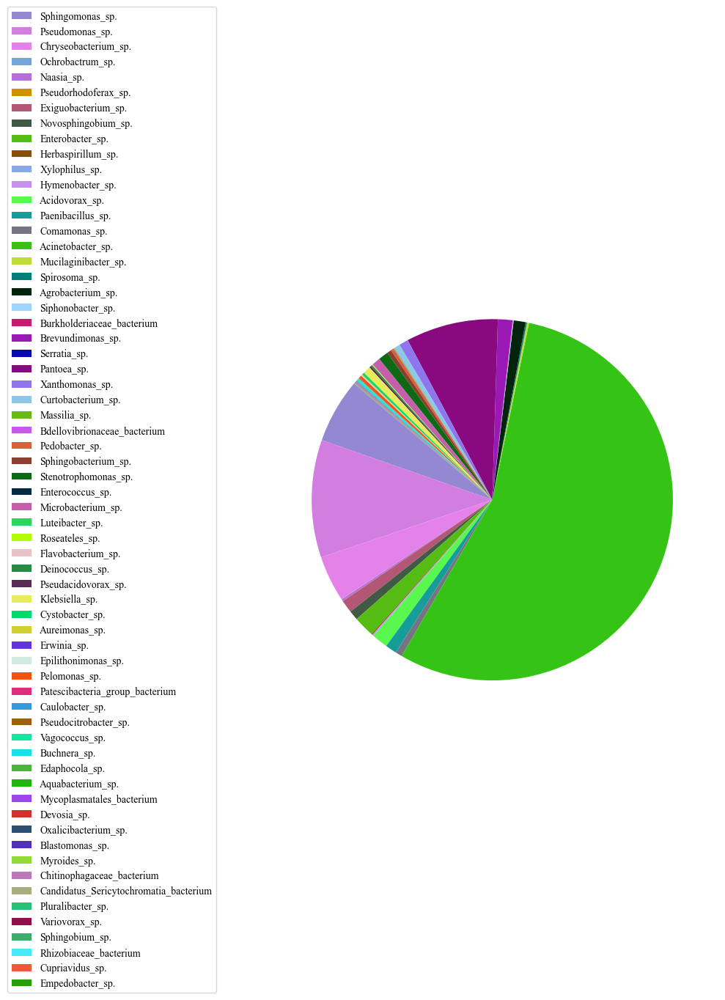

In [371]:
colors = np.random.rand(len(total_ra), 3)

# Plot pie chart for the DataFrame with one column
plt.figure(figsize=(10, 8))
plt.pie(total_ra['RA'], colors=colors, startangle=140)

# Add legend at left for individual color
plt.legend(labels=total_ra.index, loc='center right', bbox_to_anchor=(-0.1, 0.5))

# Show the plot
plt.show()

In [372]:
filtered_coverm_merged = pd.concat([filtered_coverm, sub_lignin], axis=0)
filtered_coverm_merged

,ERR6050324,ERR6050325,ERR6050326,ERR6050327,ERR6050331,ERR6050332,ERR6050334,ERR6050337,ERR6050338,ERR6050344,...,ERR6050635,ERR6050636,ERR6050637,ERR6050639,ERR6050640,ERR6050641,ERR6050644,ERR6050645,ERR6050648,ERR6050649
Sphingomonas_sp._ERS6626783,0.000000,0.167018,0.132595,0.031797,0.000000,0.108736,0.000000,0.174097,0.000000,0.006498,...,0.025304,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.158726,0.000000
Pseudomonas_sp._ERS6626560,0.230631,0.034397,0.031363,0.000000,0.000000,0.000000,0.036559,0.258606,1.171289,0.317798,...,0.075384,0.000000,0.039736,0.161413,0.074147,0.000000,0.124540,0.013201,0.101921,0.000000
Chryseobacterium_sp._ERS6626743,0.036411,0.000000,0.000000,0.000000,0.000000,0.041183,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Ochrobactrum_sp._ERS6627020,0.000000,0.000000,0.000000,0.000000,0.000000,0.106024,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Chryseobacterium_sp._ERS6626898,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.144813,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HCA (mg/g),4.053818,1.297702,0.678492,1.302806,0.909263,0.287833,0.765135,0.772853,0.567879,0.710608,...,2.374529,2.042772,2.804194,2.352775,3.375557,2.511995,2.521238,4.626686,1.975501,4.415855
LPA (mg/g),4.479423,2.090554,0.477110,0.709766,0.129872,0.255859,0.722608,0.685973,0.797529,0.568315,...,0.719747,1.063726,1.468281,0.337893,4.121302,0.160128,1.865643,3.564500,1.414824,2.491817
FLA (mg/g),0.732344,0.410551,0.455427,0.227444,0.280427,0.155081,0.257215,0.315430,0.157913,0.259640,...,0.786299,1.139725,0.299404,0.233898,0.155342,0.209199,0.261919,0.614837,0.673685,0.986845
CFA (mg/g),1.220339,0.723277,0.252706,0.401645,0.418336,0.277977,0.203357,0.133616,0.765105,0.244356,...,0.782159,0.438874,0.227990,1.196646,0.169190,0.933898,1.367797,1.401695,0.626982,1.420339


In [373]:
numeric_data = filtered_coverm_merged.select_dtypes(include=[float, int])  # Select only numeric columns

# Step 1: Transpose the DataFrame so that we can calculate correlation between genomes (rows) and lignin precursors (columns)
filtered_coverm_transposed = numeric_data.T
filtered_coverm_transposed

,Sphingomonas_sp._ERS6626783,Pseudomonas_sp._ERS6626560,Chryseobacterium_sp._ERS6626743,Ochrobactrum_sp._ERS6627020,Chryseobacterium_sp._ERS6626898,Naasia_sp._ERS6627292,Pseudorhodoferax_sp._ERS6626941,Exiguobacterium_sp._ERS6626708,Novosphingobium_sp._ERS6626794,Chryseobacterium_sp._ERS6626581,...,Chryseobacterium_sp._ERS6626662,Acidovorax_sp._ERS6626918,Acinetobacter_sp._ERS6626625,Paenibacillus_sp._ERS6627323,Pseudomonas_sp._ERS6626978,HCA (mg/g),LPA (mg/g),FLA (mg/g),CFA (mg/g),SPLT (mg/g)
ERR6050324,0.000000,0.230631,0.036411,0.0,0.0,0.009464,0.0,7.192362,0.008940,0.0,...,0.011783,0.000000,0.652187,0.000000,0.145366,4.053818,4.479423,0.732344,1.220339,0.411761
ERR6050325,0.167018,0.034397,0.000000,0.0,0.0,0.013806,0.0,0.327856,0.000000,0.0,...,0.061677,0.000000,1.075689,0.000000,0.042188,1.297702,2.090554,0.410551,0.723277,0.197954
ERR6050326,0.132595,0.031363,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.088055,0.0,...,0.087139,0.000000,0.012135,0.000000,0.020548,0.678492,0.477110,0.455427,0.252706,0.258504
ERR6050327,0.031797,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.302806,0.709766,0.227444,0.401645,0.153333
ERR6050331,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,...,0.000000,0.000000,0.017753,0.000000,0.000000,0.909263,0.129872,0.280427,0.418336,0.535029
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ERR6050641,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.029673,0.000000,0.0,...,0.000000,0.000000,0.035976,0.000000,0.000000,2.511995,0.160128,0.209199,0.933898,0.506914
ERR6050644,0.000000,0.124540,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,...,0.000000,0.000000,0.031671,5.840695,0.088105,2.521238,1.865643,0.261919,1.367797,0.520993
ERR6050645,0.000000,0.013201,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,...,0.007347,0.026366,1.745361,0.000000,0.010578,4.626686,3.564500,0.614837,1.401695,0.397074
ERR6050648,0.158726,0.101921,0.000000,0.0,0.0,0.000000,0.0,0.036269,0.083365,0.0,...,0.024358,0.000000,0.053249,0.074736,0.061847,1.975501,1.414824,0.673685,0.626982,0.447429


In [374]:
filtered_coverm_transposed.to_csv('filtered_coverm_lignin_percusor.csv')
filtered_coverm_sum.to_csv('filtered_coverm_sum.csv')

In [378]:
filtered_coverm_sum_merged = pd.concat([filtered_coverm_sum, sub_lignin], axis=0)
filtered_coverm_sum_merged

,ERR6050324,ERR6050325,ERR6050326,ERR6050327,ERR6050331,ERR6050332,ERR6050334,ERR6050337,ERR6050338,ERR6050344,...,ERR6050635,ERR6050636,ERR6050637,ERR6050639,ERR6050640,ERR6050641,ERR6050644,ERR6050645,ERR6050648,ERR6050649
Sphingomonas_sp.,2.661482,2.140278,4.742710,2.412340,0.056472,3.534385,0.146531,10.497045,0.116418,0.601959,...,0.565262,0.009000,0.765923,0.044093,0.563923,0.000000,2.454297,0.245262,5.181263,0.015511
Pseudomonas_sp.,13.051880,10.996665,1.017494,0.265658,0.022596,2.948440,5.998471,7.291455,47.457836,6.027655,...,2.583033,0.073936,0.948165,1.893498,1.930341,0.009430,5.872583,0.912199,56.857631,0.263589
Chryseobacterium_sp.,1.390058,8.836262,11.694394,2.227674,0.153514,16.237188,0.595375,26.544391,0.608934,0.631052,...,1.601706,0.000000,2.519948,0.000000,0.169460,0.026625,0.752962,0.259042,0.780404,0.019309
Ochrobactrum_sp.,0.000000,0.000000,0.000000,0.000000,0.000000,0.150824,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Naasia_sp.,0.043865,0.043056,0.123449,0.314996,0.000000,0.476933,0.000000,0.197826,0.000000,0.000000,...,0.000000,0.000000,0.120026,0.000000,0.000000,0.000000,0.054874,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HCA (mg/g),4.053818,1.297702,0.678492,1.302806,0.909263,0.287833,0.765135,0.772853,0.567879,0.710608,...,2.374529,2.042772,2.804194,2.352775,3.375557,2.511995,2.521238,4.626686,1.975501,4.415855
LPA (mg/g),4.479423,2.090554,0.477110,0.709766,0.129872,0.255859,0.722608,0.685973,0.797529,0.568315,...,0.719747,1.063726,1.468281,0.337893,4.121302,0.160128,1.865643,3.564500,1.414824,2.491817
FLA (mg/g),0.732344,0.410551,0.455427,0.227444,0.280427,0.155081,0.257215,0.315430,0.157913,0.259640,...,0.786299,1.139725,0.299404,0.233898,0.155342,0.209199,0.261919,0.614837,0.673685,0.986845
CFA (mg/g),1.220339,0.723277,0.252706,0.401645,0.418336,0.277977,0.203357,0.133616,0.765105,0.244356,...,0.782159,0.438874,0.227990,1.196646,0.169190,0.933898,1.367797,1.401695,0.626982,1.420339


In [380]:
coverm_transposed

,Sphingomonas_sp._ERS6626783,Pseudomonas_sp._ERS6626560,Chryseobacterium_sp._ERS6626743,Ochrobactrum_sp._ERS6627020,Chryseobacterium_sp._ERS6626898,Naasia_sp._ERS6627292,Pseudorhodoferax_sp._ERS6626941,Exiguobacterium_sp._ERS6626708,Novosphingobium_sp._ERS6626794,Chryseobacterium_sp._ERS6626581,...,Acidovorax_sp._ERS6626918,Mucilaginibacter_sp._ERS6626972,Acinetobacter_sp._ERS6626625,Paenibacillus_sp._ERS6627323,Pseudomonas_sp._ERS6626978,HCA (mg/g),LPA (mg/g),FLA (mg/g),CFA (mg/g),SPLT (mg/g)
ERR6050324,0.000000,0.230631,0.036411,0.0,0.0,0.009464,0.0,7.192362,0.008940,0.0,...,0.000000,0.000000,0.652187,0.000000,0.145366,4.053818,4.479423,0.732344,1.220339,0.411761
ERR6050325,0.167018,0.034397,0.000000,0.0,0.0,0.013806,0.0,0.327856,0.000000,0.0,...,0.000000,0.000000,1.075689,0.000000,0.042188,1.297702,2.090554,0.410551,0.723277,0.197954
ERR6050326,0.132595,0.031363,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.088055,0.0,...,0.000000,0.060644,0.012135,0.000000,0.020548,0.678492,0.477110,0.455427,0.252706,0.258504
ERR6050327,0.031797,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.302806,0.709766,0.227444,0.401645,0.153333
ERR6050331,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,...,0.000000,0.000000,0.017753,0.000000,0.000000,0.909263,0.129872,0.280427,0.418336,0.535029
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ERR6050641,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.029673,0.000000,0.0,...,0.000000,0.000000,0.035976,0.000000,0.000000,2.511995,0.160128,0.209199,0.933898,0.506914
ERR6050644,0.000000,0.124540,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,...,0.000000,0.000000,0.031671,5.840695,0.088105,2.521238,1.865643,0.261919,1.367797,0.520993
ERR6050645,0.000000,0.013201,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,...,0.026366,0.000000,1.745361,0.000000,0.010578,4.626686,3.564500,0.614837,1.401695,0.397074
ERR6050648,0.158726,0.101921,0.000000,0.0,0.0,0.000000,0.0,0.036269,0.083365,0.0,...,0.000000,0.000000,0.053249,0.074736,0.061847,1.975501,1.414824,0.673685,0.626982,0.447429


In [381]:
coverm_transposed

,Sphingomonas_sp._ERS6626783,Pseudomonas_sp._ERS6626560,Chryseobacterium_sp._ERS6626743,Ochrobactrum_sp._ERS6627020,Chryseobacterium_sp._ERS6626898,Naasia_sp._ERS6627292,Pseudorhodoferax_sp._ERS6626941,Exiguobacterium_sp._ERS6626708,Novosphingobium_sp._ERS6626794,Chryseobacterium_sp._ERS6626581,...,Acidovorax_sp._ERS6626918,Mucilaginibacter_sp._ERS6626972,Acinetobacter_sp._ERS6626625,Paenibacillus_sp._ERS6627323,Pseudomonas_sp._ERS6626978,HCA (mg/g),LPA (mg/g),FLA (mg/g),CFA (mg/g),SPLT (mg/g)
ERR6050324,0.000000,0.230631,0.036411,0.0,0.0,0.009464,0.0,7.192362,0.008940,0.0,...,0.000000,0.000000,0.652187,0.000000,0.145366,4.053818,4.479423,0.732344,1.220339,0.411761
ERR6050325,0.167018,0.034397,0.000000,0.0,0.0,0.013806,0.0,0.327856,0.000000,0.0,...,0.000000,0.000000,1.075689,0.000000,0.042188,1.297702,2.090554,0.410551,0.723277,0.197954
ERR6050326,0.132595,0.031363,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.088055,0.0,...,0.000000,0.060644,0.012135,0.000000,0.020548,0.678492,0.477110,0.455427,0.252706,0.258504
ERR6050327,0.031797,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.302806,0.709766,0.227444,0.401645,0.153333
ERR6050331,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,...,0.000000,0.000000,0.017753,0.000000,0.000000,0.909263,0.129872,0.280427,0.418336,0.535029
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ERR6050641,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.029673,0.000000,0.0,...,0.000000,0.000000,0.035976,0.000000,0.000000,2.511995,0.160128,0.209199,0.933898,0.506914
ERR6050644,0.000000,0.124540,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,...,0.000000,0.000000,0.031671,5.840695,0.088105,2.521238,1.865643,0.261919,1.367797,0.520993
ERR6050645,0.000000,0.013201,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,...,0.026366,0.000000,1.745361,0.000000,0.010578,4.626686,3.564500,0.614837,1.401695,0.397074
ERR6050648,0.158726,0.101921,0.000000,0.0,0.0,0.000000,0.0,0.036269,0.083365,0.0,...,0.000000,0.000000,0.053249,0.074736,0.061847,1.975501,1.414824,0.673685,0.626982,0.447429


In [383]:
coverm_sum_merged = pd.concat([coverm_sum, sub_lignin], axis=0)
coverm_sum_merged

,ERR6050324,ERR6050325,ERR6050326,ERR6050327,ERR6050331,ERR6050332,ERR6050334,ERR6050337,ERR6050338,ERR6050344,...,ERR6050635,ERR6050636,ERR6050637,ERR6050639,ERR6050640,ERR6050641,ERR6050644,ERR6050645,ERR6050648,ERR6050649
Sphingomonas_sp.,3.088762,2.677717,5.794847,2.698665,0.056472,4.315924,0.192595,11.937784,0.116418,0.787710,...,0.676322,0.009000,0.813969,0.044093,0.651196,0.000000,2.861221,0.284355,6.538360,0.015511
Pseudomonas_sp.,13.874891,11.111506,1.095330,0.265658,0.022596,2.948440,6.198513,8.442147,47.457836,7.017916,...,2.901161,0.073936,1.013474,2.201503,2.375994,0.009430,6.217001,0.951836,57.201068,0.379635
Chryseobacterium_sp.,1.438284,8.962829,11.859802,2.227674,0.153514,16.237188,0.595375,26.544391,0.608934,0.717392,...,1.601706,0.000000,2.519948,0.000000,0.169460,0.026625,0.752962,0.288000,0.893374,0.026837
Ochrobactrum_sp.,0.000000,0.000000,0.000000,0.000000,0.000000,0.150824,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Naasia_sp.,0.043865,0.043056,0.123449,0.314996,0.000000,0.476933,0.000000,0.197826,0.000000,0.000000,...,0.000000,0.000000,0.120026,0.000000,0.000000,0.000000,0.054874,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HCA (mg/g),4.053818,1.297702,0.678492,1.302806,0.909263,0.287833,0.765135,0.772853,0.567879,0.710608,...,2.374529,2.042772,2.804194,2.352775,3.375557,2.511995,2.521238,4.626686,1.975501,4.415855
LPA (mg/g),4.479423,2.090554,0.477110,0.709766,0.129872,0.255859,0.722608,0.685973,0.797529,0.568315,...,0.719747,1.063726,1.468281,0.337893,4.121302,0.160128,1.865643,3.564500,1.414824,2.491817
FLA (mg/g),0.732344,0.410551,0.455427,0.227444,0.280427,0.155081,0.257215,0.315430,0.157913,0.259640,...,0.786299,1.139725,0.299404,0.233898,0.155342,0.209199,0.261919,0.614837,0.673685,0.986845
CFA (mg/g),1.220339,0.723277,0.252706,0.401645,0.418336,0.277977,0.203357,0.133616,0.765105,0.244356,...,0.782159,0.438874,0.227990,1.196646,0.169190,0.933898,1.367797,1.401695,0.626982,1.420339


In [384]:
merged = pd.concat([coxl, sub_lignin], axis=0)

In [387]:
merged

,ERR6050324,ERR6050325,ERR6050326,ERR6050327,ERR6050331,ERR6050332,ERR6050334,ERR6050337,ERR6050338,ERR6050344,...,ERR6050635,ERR6050636,ERR6050637,ERR6050639,ERR6050640,ERR6050641,ERR6050644,ERR6050645,ERR6050648,ERR6050649
Pseudorhodoferax_sp._ERS6626941,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Comamonas_sp._ERS6626650,0.000000,0.000000,0.000000,0.070546,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.011315,0.000000,0.000000,0.000000,0.000000
Methylobacterium_sp._ERS6627288,0.015295,0.174915,0.130110,0.091941,0.000000,0.094978,0.000000,0.135731,0.000000,0.055849,...,0.018487,0.000000,0.012381,0.000000,0.000000,0.000000,0.024904,0.000000,0.135822,0.000000
Deinococcus_sp._ERS6627335,0.000000,0.044219,0.030060,0.000000,0.000000,0.020661,0.000000,0.074418,0.000000,0.037351,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Pseudacidovorax_sp._ERS6627003,0.007145,0.000000,0.075032,0.000000,0.000000,0.000000,0.000000,0.009820,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Comamonas_sp._ERS6626602,0.000000,0.000000,0.000000,1.488315,0.136045,0.473450,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.131751,0.017999,0.000000,0.000000,0.000000
Deinococcus_sp._ERS6627293,0.000000,0.050215,0.035924,0.000000,0.000000,0.023930,0.000000,0.086611,0.000000,0.042869,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Deinococcus_sp._ERS6626820,0.000000,0.050547,0.036680,0.000000,0.000000,0.024872,0.000000,0.136374,0.000000,0.037691,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Pseudacidovorax_sp._ERS6626850,0.006779,0.000000,0.075649,0.000000,0.000000,0.000000,0.000000,0.011344,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Acidovorax_sp._ERS6627271,0.000000,0.000000,0.000000,1.459407,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


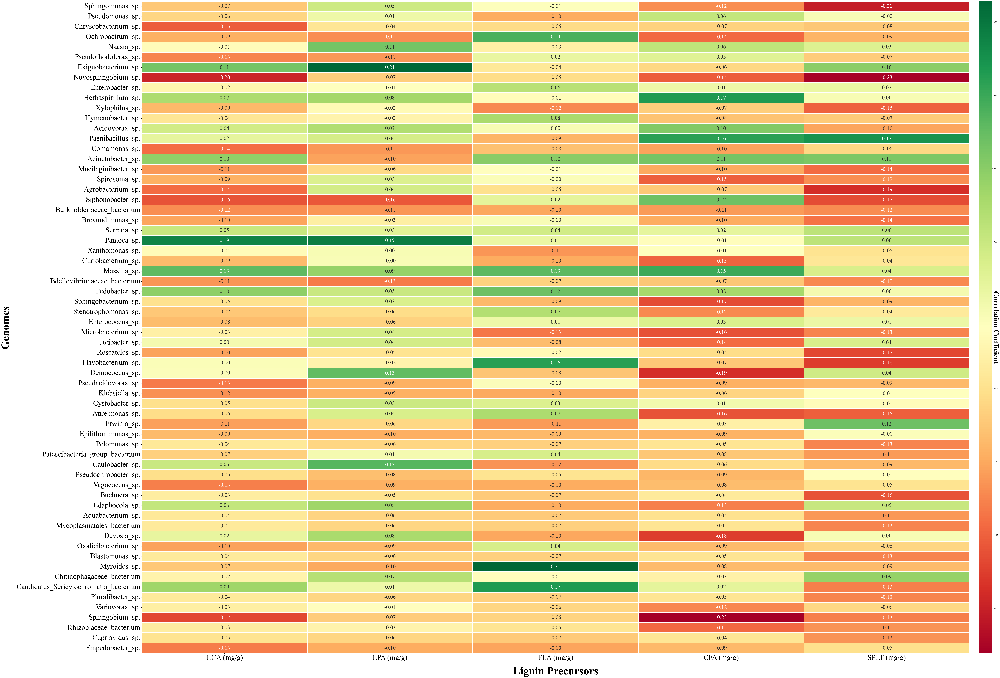

In [390]:
numeric_data = filtered_coverm_sum_merged.select_dtypes(include=[float, int])  # Select only numeric columns

# Step 1: Transpose the DataFrame so that we can calculate correlation between genomes (rows) and lignin precursors (columns)
merged_transposed = numeric_data.T  # Transpose to have rows as metagenomes and columns as genomic or lignin data

# Step 2: Compute the correlation matrix
correlation_matrix = merged_transposed.corr()

# Step 3: Assuming you have two sets of columns (genome abundance and lignin precursors)
#  the first 25 rows are genome abundances and the last 5 rows are lignin precursors

# Extract genome abundance columns (first 24)
genome_columns = merged_transposed.columns[:-5]

# Extract lignin precursor columns (last 5)
lignin_columns = merged_transposed.columns[-5:]

# Step 4: Compute correlation between genome abundance and lignin precursors
correlations = correlation_matrix.loc[genome_columns, lignin_columns]

# Step 5: plot the correlation matrix (e.g., heatmap)

plt.figure(figsize=(96, 64))
sns.heatmap(correlations, annot=True, cmap='RdYlGn', fmt='.2f', linewidths=3, cbar_kws={'aspect': 50, 'pad': 0.01}, annot_kws={'size': 30})
cbar = plt.gca().collections[0].colorbar
cbar.ax.yaxis.label.set_rotation(270)
cbar.set_label('Correlation Coefficient', fontsize=40, fontweight='bold')
plt.xlabel('Lignin Precursors', fontsize=60, fontweight='bold', labelpad=30)
plt.ylabel('Genomes', fontsize=60, fontweight='bold', labelpad=30)
plt.xticks(fontsize=40)
plt.yticks(fontsize=40)

plt.savefig('filtered_coverm_sum_correlationplot.png', format='png', dpi=300, bbox_inches='tight')

plt.show()

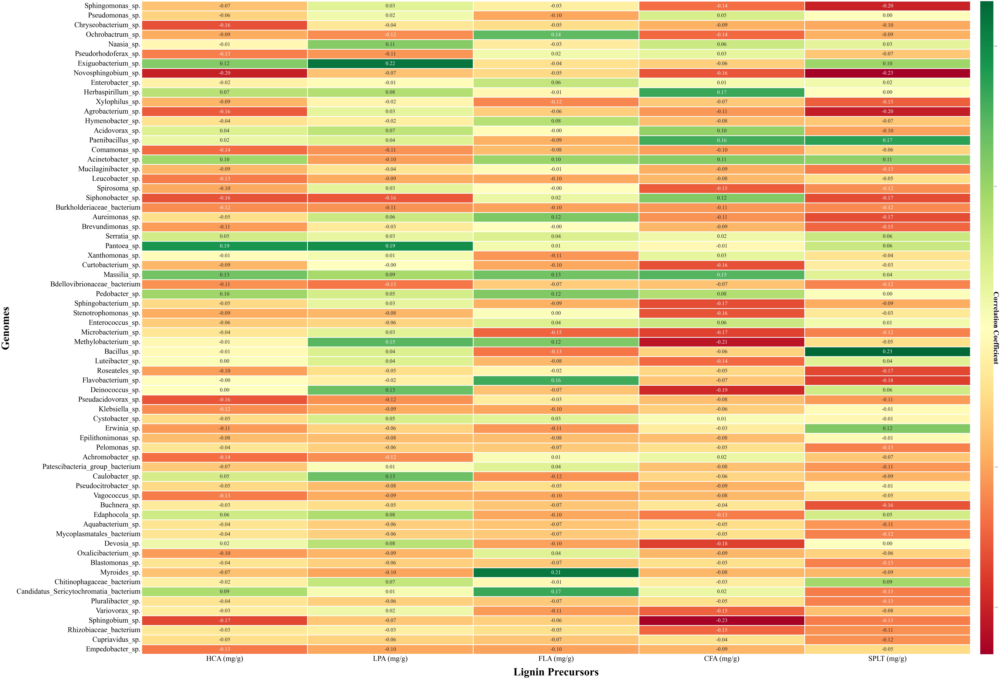

In [391]:
numeric_data = coverm_sum_merged.select_dtypes(include=[float, int])  # Select only numeric columns

# Step 1: Transpose the DataFrame so that we can calculate correlation between genomes (rows) and lignin precursors (columns)
merged_transposed = numeric_data.T  # Transpose to have rows as metagenomes and columns as genomic or lignin data

# Step 2: Compute the correlation matrix
correlation_matrix = merged_transposed.corr()

# Step 3: Assuming you have two sets of columns (genome abundance and lignin precursors)
#  the first 25 rows are genome abundances and the last 5 rows are lignin precursors

# Extract genome abundance columns (first 24)
genome_columns = merged_transposed.columns[:-5]

# Extract lignin precursor columns (last 5)
lignin_columns = merged_transposed.columns[-5:]

# Step 4: Compute correlation between genome abundance and lignin precursors
correlations = correlation_matrix.loc[genome_columns, lignin_columns]

# Step 5: plot the correlation matrix (e.g., heatmap)

plt.figure(figsize=(96, 64))
sns.heatmap(correlations, annot=True, cmap='RdYlGn', fmt='.2f', linewidths=3, cbar_kws={'aspect': 50, 'pad': 0.01}, annot_kws={'size': 30})
cbar = plt.gca().collections[0].colorbar
cbar.ax.yaxis.label.set_rotation(270)
cbar.set_label('Correlation Coefficient', fontsize=40, fontweight='bold')
plt.xlabel('Lignin Precursors', fontsize=60, fontweight='bold', labelpad=30)
plt.ylabel('Genomes', fontsize=60, fontweight='bold', labelpad=30)
plt.xticks(fontsize=40)
plt.yticks(fontsize=40)

plt.savefig('coverm_sum_correlationplot.png', format='png', dpi=300, bbox_inches='tight')

plt.show()

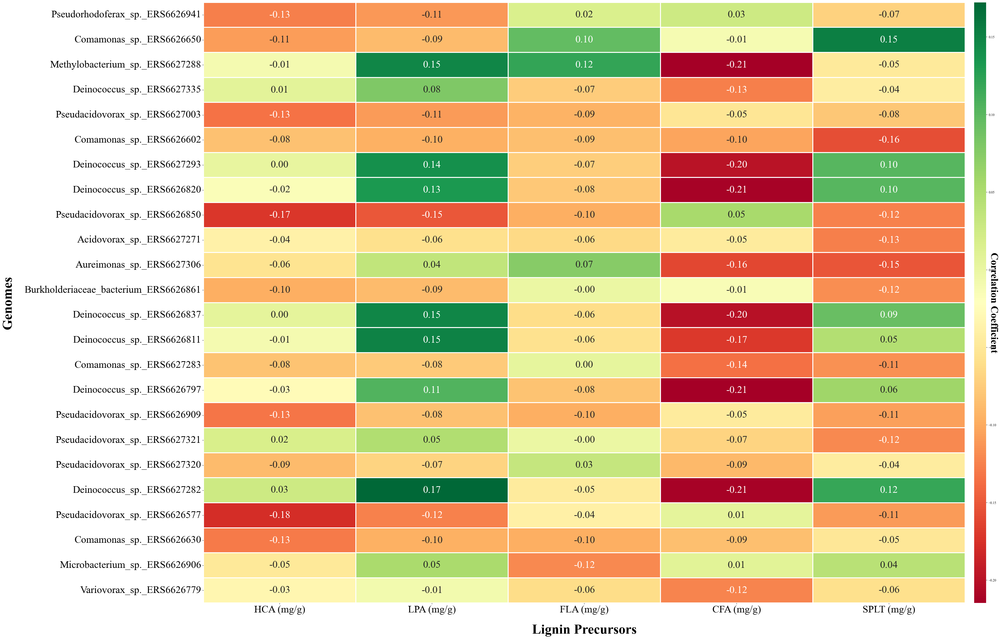

In [392]:
numeric_data = merged.select_dtypes(include=[float, int])  # Select only numeric columns

# Step 1: Transpose the DataFrame so that we can calculate correlation between genomes (rows) and lignin precursors (columns)
merged_transposed = numeric_data.T  # Transpose to have rows as metagenomes and columns as genomic or lignin data

# Step 2: Compute the correlation matrix
correlation_matrix = merged_transposed.corr()

# Step 3: Assuming you have two sets of columns (genome abundance and lignin precursors)
#  the first 25 rows are genome abundances and the last 5 rows are lignin precursors

# Extract genome abundance columns (first 24)
genome_columns = merged_transposed.columns[:24]

# Extract lignin precursor columns (last 5)
lignin_columns = merged_transposed.columns[-5:]

# Step 4: Compute correlation between genome abundance and lignin precursors
correlations = correlation_matrix.loc[genome_columns, lignin_columns]

# Step 5: plot the correlation matrix (e.g., heatmap)

plt.figure(figsize=(48, 32))
sns.heatmap(correlations, annot=True, cmap='RdYlGn', fmt='.2f', linewidths=1.5, cbar_kws={'aspect': 50, 'pad': 0.01}, annot_kws={'size': 30})
cbar = plt.gca().collections[0].colorbar
cbar.ax.yaxis.label.set_rotation(270)
cbar.set_label('Correlation Coefficient', fontsize=30, fontweight='bold')
plt.xlabel('Lignin Precursors', fontsize=40, fontweight='bold', labelpad=30)
plt.ylabel('Genomes', fontsize=40, fontweight='bold', labelpad=30)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

plt.savefig('correlationplot.png', format='png', dpi=300, bbox_inches='tight')

plt.show()

In [394]:
print(correlations)

                                       HCA (mg/g)  LPA (mg/g)  FLA (mg/g)  \
Pseudorhodoferax_sp._ERS6626941         -0.126291   -0.111472    0.016199   
Comamonas_sp._ERS6626650                -0.107783   -0.088591    0.095669   
Methylobacterium_sp._ERS6627288         -0.010236    0.146859    0.120348   
Deinococcus_sp._ERS6627335               0.006340    0.079940   -0.074824   
Pseudacidovorax_sp._ERS6627003          -0.134028   -0.108965   -0.094532   
Comamonas_sp._ERS6626602                -0.083334   -0.095262   -0.085021   
Deinococcus_sp._ERS6627293               0.002813    0.140497   -0.073130   
Deinococcus_sp._ERS6626820              -0.016603    0.131722   -0.078123   
Pseudacidovorax_sp._ERS6626850          -0.171649   -0.151074   -0.097893   
Acidovorax_sp._ERS6627271               -0.037890   -0.058507   -0.063593   
Aureimonas_sp._ERS6627306               -0.055115    0.036054    0.074425   
Burkholderiaceae_bacterium_ERS6626861   -0.096831   -0.088095   -0.001023   

In [395]:
merged_sum = pd.concat([coxl_sum, sub_lignin], axis=0)

In [396]:
merged_sum

,ERR6050324,ERR6050325,ERR6050326,ERR6050327,ERR6050331,ERR6050332,ERR6050334,ERR6050337,ERR6050338,ERR6050344,...,ERR6050636,ERR6050637,ERR6050639,ERR6050640,ERR6050641,ERR6050644,ERR6050645,ERR6050648,ERR6050649,P-Value
Aureimonas_sp,0.000000,0.057325,0.167410,0.000000,0.000000,0.058138,0.000000,0.077194,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.018008,0.000000,0.003040
Burkholderiaceae_bacterium,0.024780,0.000000,0.282525,0.049472,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.143634
Pseudorhodoferax_sp,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.448006
Pseudacidovorax_sp,0.143325,0.000000,3.977825,0.000000,0.000000,0.000000,0.000000,0.043457,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.446890
Deinococcus_sp,0.000000,0.470802,0.226660,0.000000,0.000000,0.171101,0.000000,0.622467,0.000000,0.421156,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.427850
Methylobacterium_sp,0.015295,0.174915,0.130110,0.091941,0.000000,0.094978,0.000000,0.135731,0.000000,0.055849,...,0.000000,0.012381,0.000000,0.000000,0.000000,0.024904,0.000000,0.135822,0.000000,0.712940
Variovorax_sp,0.000000,0.000000,0.015025,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.347807
Microbacterium_sp,0.015453,0.072359,0.000000,0.000000,0.000000,0.000000,0.000000,0.019602,0.000000,0.012162,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.052570
Acidovorax_sp,0.000000,0.000000,0.000000,1.459407,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.986659
Comamonas_sp,0.000000,0.000000,0.023686,2.192125,0.526465,12.024121,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.399032,0.072577,0.000000,0.000000,0.000000,0.088304


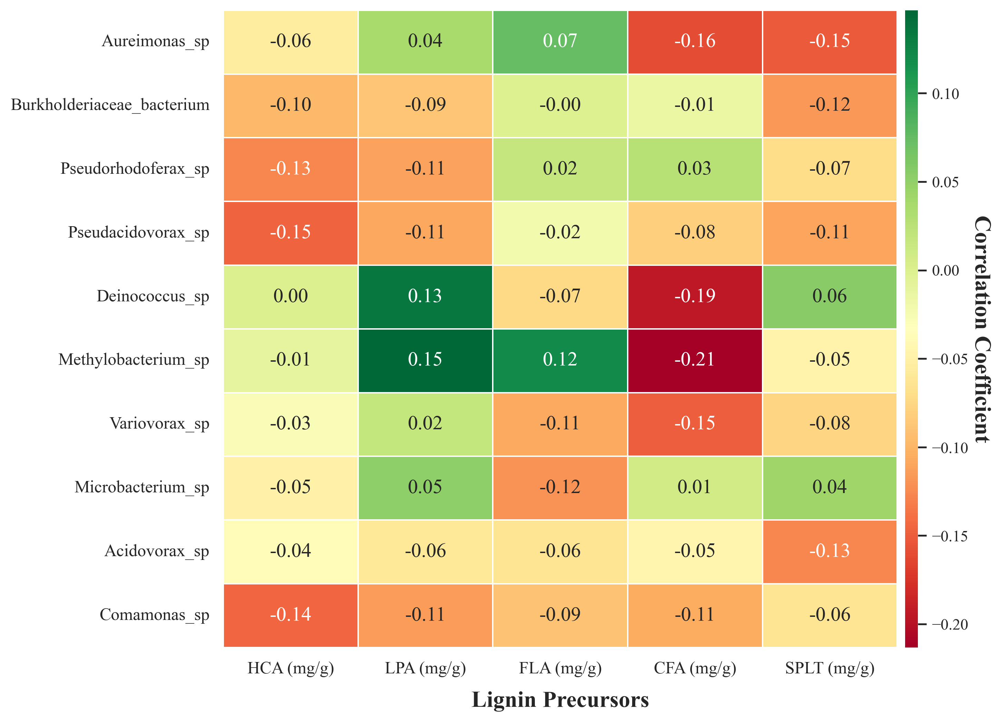

In [556]:
numeric_data = merged_sum.select_dtypes(include=[float, int])  # Select only numeric columns

# Step 1: Transpose the DataFrame so that we can calculate correlation between genomes (rows) and lignin precursors (columns)
merged_transposed = numeric_data.T  # Transpose to have rows as metagenomes and columns as genomic or lignin data

# Step 2: Compute the correlation matrix
correlation_matrix = merged_transposed.corr()

# Step 3: Assuming you have two sets of columns (genome abundance and lignin precursors)
#  the first 25 rows are genome abundances and the last 5 rows are lignin precursors

# Extract genome abundance columns (first 24)
genome_columns = merged_transposed.columns[:10]

# Extract lignin precursor columns (last 5)
lignin_columns = merged_transposed.columns[-5:]

# Step 4: Compute correlation between genome abundance and lignin precursors
correlations = correlation_matrix.loc[genome_columns, lignin_columns]

# Step 5: plot the correlation matrix (e.g., heatmap)
# Set the font globally to Times New Roman
plt.rcParams['font.family'] = 'Times New Roman'

plt.figure(figsize=(10, 8), dpi=300)
sns.heatmap(correlations, annot=True, cmap='RdYlGn', fmt='.2f', linewidths=0.5, cbar_kws={'aspect': 50, 'pad': 0.01}, annot_kws={'size': 14})
cbar = plt.gca().collections[0].colorbar
cbar.ax.yaxis.label.set_rotation(270)
plt.xlabel('Lignin Precursors', fontsize=16, fontweight='bold', labelpad=10)
plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')

plt.savefig('correlationplot_genus.png', format='png', dpi=300, bbox_inches='tight')

plt.show()

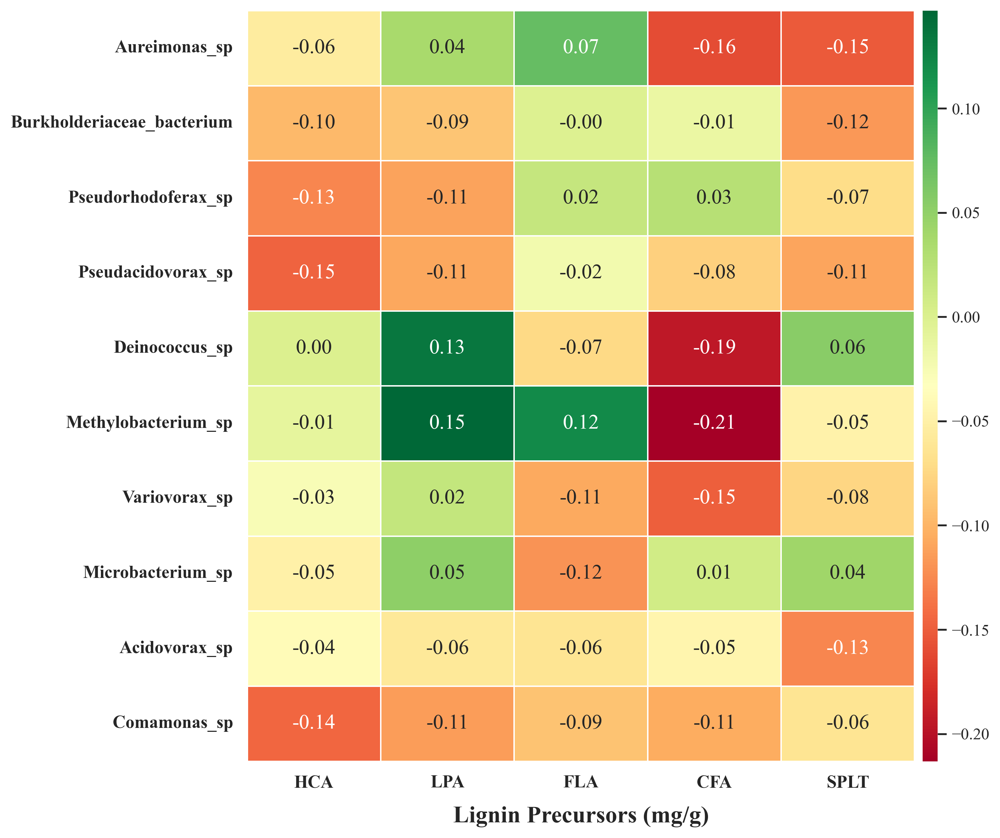

In [560]:
numeric_data = merged_sum.select_dtypes(include=[float, int])  # Select only numeric columns

# Step 1: Transpose the DataFrame so that we can calculate correlation between genomes (rows) and lignin precursors (columns)
merged_transposed = numeric_data.T  # Transpose to have rows as metagenomes and columns as genomic or lignin data

# Step 2: Compute the correlation matrix
correlation_matrix = merged_transposed.corr()

# Step 3: Assuming you have two sets of columns (genome abundance and lignin precursors)
#  the first 25 rows are genome abundances and the last 5 rows are lignin precursors

# Extract genome abundance columns (first 24)
genome_columns = merged_transposed.columns[:10]

# Extract lignin precursor columns (last 5)
lignin_columns = merged_transposed.columns[-5:]

# Step 4: Compute correlation between genome abundance and lignin precursors
correlations = correlation_matrix.loc[genome_columns, lignin_columns]

# Step 5: plot the correlation matrix (e.g., heatmap)
# Set the font globally to Times New Roman
plt.rcParams['font.family'] = 'Times New Roman'

plt.figure(figsize=(10, 8), dpi=300)
sns.heatmap(correlations, annot=True, cmap='RdYlGn', fmt='.2f', 
            linewidths=0.5, cbar_kws={'aspect': 50, 'pad': 0.01}, 
            annot_kws={'size': 14})

# Get and trim x-tick labels
xtick_labels = [label.get_text()[:-7] for label in plt.gca().get_xticklabels()]
plt.gca().set_xticklabels(xtick_labels, rotation=0, fontsize=12, fontweight='bold')

# Colorbar settings
cbar = plt.gca().collections[0].colorbar
cbar.ax.yaxis.label.set_rotation(270)

# Axis label
plt.xlabel('Lignin Precursors (mg/g)', fontsize=16, fontweight='bold', labelpad=10)

# Y-tick styling
plt.yticks(fontsize=12, fontweight='bold')

plt.tight_layout()

plt.savefig('correlationplot_genus.png', format='png', dpi=300, bbox_inches='tight')

plt.show()

In [398]:
print(correlations)

                            HCA (mg/g)  LPA (mg/g)  FLA (mg/g)  CFA (mg/g)  \
Aureimonas_sp                -0.055115    0.036054    0.074425   -0.161035   
Burkholderiaceae_bacterium   -0.096831   -0.088095   -0.001023   -0.014009   
Pseudorhodoferax_sp          -0.126291   -0.111472    0.016199    0.026749   
Pseudacidovorax_sp           -0.147029   -0.108175   -0.021313   -0.079626   
Deinococcus_sp                0.000165    0.134239   -0.073569   -0.194461   
Methylobacterium_sp          -0.010236    0.146859    0.120348   -0.213188   
Variovorax_sp                -0.027448    0.017976   -0.106413   -0.149829   
Microbacterium_sp            -0.048820    0.052194   -0.120100    0.008368   
Acidovorax_sp                -0.037890   -0.058507   -0.063593   -0.045411   
Comamonas_sp                 -0.144926   -0.113706   -0.090152   -0.105542   

                            SPLT (mg/g)  
Aureimonas_sp                 -0.152436  
Burkholderiaceae_bacterium    -0.116702  
Pseudorhodofera

In [399]:
merged_sum

,ERR6050324,ERR6050325,ERR6050326,ERR6050327,ERR6050331,ERR6050332,ERR6050334,ERR6050337,ERR6050338,ERR6050344,...,ERR6050636,ERR6050637,ERR6050639,ERR6050640,ERR6050641,ERR6050644,ERR6050645,ERR6050648,ERR6050649,P-Value
Aureimonas_sp,0.000000,0.057325,0.167410,0.000000,0.000000,0.058138,0.000000,0.077194,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.018008,0.000000,0.003040
Burkholderiaceae_bacterium,0.024780,0.000000,0.282525,0.049472,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.143634
Pseudorhodoferax_sp,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.448006
Pseudacidovorax_sp,0.143325,0.000000,3.977825,0.000000,0.000000,0.000000,0.000000,0.043457,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.446890
Deinococcus_sp,0.000000,0.470802,0.226660,0.000000,0.000000,0.171101,0.000000,0.622467,0.000000,0.421156,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.427850
Methylobacterium_sp,0.015295,0.174915,0.130110,0.091941,0.000000,0.094978,0.000000,0.135731,0.000000,0.055849,...,0.000000,0.012381,0.000000,0.000000,0.000000,0.024904,0.000000,0.135822,0.000000,0.712940
Variovorax_sp,0.000000,0.000000,0.015025,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.347807
Microbacterium_sp,0.015453,0.072359,0.000000,0.000000,0.000000,0.000000,0.000000,0.019602,0.000000,0.012162,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.052570
Acidovorax_sp,0.000000,0.000000,0.000000,1.459407,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.986659
Comamonas_sp,0.000000,0.000000,0.023686,2.192125,0.526465,12.024121,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.399032,0.072577,0.000000,0.000000,0.000000,0.088304


In [400]:
numeric_data = merged_sum.select_dtypes(include=[float, int])  # Select only numeric columns

# Step 1: Transpose the DataFrame so that we can calculate correlation between genomes (rows) and lignin precursors (columns)
merged_transposed = numeric_data.T
merged_transposed

,Aureimonas_sp,Burkholderiaceae_bacterium,Pseudorhodoferax_sp,Pseudacidovorax_sp,Deinococcus_sp,Methylobacterium_sp,Variovorax_sp,Microbacterium_sp,Acidovorax_sp,Comamonas_sp,HCA (mg/g),LPA (mg/g),FLA (mg/g),CFA (mg/g),SPLT (mg/g)
ERR6050324,0.000000,0.024780,0.000000,0.143325,0.000000,0.015295,0.000000,0.015453,0.000000,0.000000,4.053818,4.479423,0.732344,1.220339,0.411761
ERR6050325,0.057325,0.000000,0.000000,0.000000,0.470802,0.174915,0.000000,0.072359,0.000000,0.000000,1.297702,2.090554,0.410551,0.723277,0.197954
ERR6050326,0.167410,0.282525,0.000000,3.977825,0.226660,0.130110,0.015025,0.000000,0.000000,0.023686,0.678492,0.477110,0.455427,0.252706,0.258504
ERR6050327,0.000000,0.049472,0.000000,0.000000,0.000000,0.091941,0.000000,0.000000,1.459407,2.192125,1.302806,0.709766,0.227444,0.401645,0.153333
ERR6050331,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.526465,0.909263,0.129872,0.280427,0.418336,0.535029
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ERR6050644,0.000000,0.000000,0.000000,0.000000,0.000000,0.024904,0.000000,0.000000,0.000000,0.072577,2.521238,1.865643,0.261919,1.367797,0.520993
ERR6050645,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.626686,3.564500,0.614837,1.401695,0.397074
ERR6050648,0.018008,0.000000,0.000000,0.000000,0.000000,0.135822,0.000000,0.000000,0.000000,0.000000,1.975501,1.414824,0.673685,0.626982,0.447429
ERR6050649,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.415855,2.491817,0.986845,1.420339,0.380388


In [401]:
merged_transposed = merged_transposed.drop(index=merged_transposed.index[-1])
merged_transposed

,Aureimonas_sp,Burkholderiaceae_bacterium,Pseudorhodoferax_sp,Pseudacidovorax_sp,Deinococcus_sp,Methylobacterium_sp,Variovorax_sp,Microbacterium_sp,Acidovorax_sp,Comamonas_sp,HCA (mg/g),LPA (mg/g),FLA (mg/g),CFA (mg/g),SPLT (mg/g)
ERR6050324,0.000000,0.024780,0.0,0.143325,0.000000,0.015295,0.000000,0.015453,0.000000,0.000000,4.053818,4.479423,0.732344,1.220339,0.411761
ERR6050325,0.057325,0.000000,0.0,0.000000,0.470802,0.174915,0.000000,0.072359,0.000000,0.000000,1.297702,2.090554,0.410551,0.723277,0.197954
ERR6050326,0.167410,0.282525,0.0,3.977825,0.226660,0.130110,0.015025,0.000000,0.000000,0.023686,0.678492,0.477110,0.455427,0.252706,0.258504
ERR6050327,0.000000,0.049472,0.0,0.000000,0.000000,0.091941,0.000000,0.000000,1.459407,2.192125,1.302806,0.709766,0.227444,0.401645,0.153333
ERR6050331,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.526465,0.909263,0.129872,0.280427,0.418336,0.535029
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ERR6050641,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.399032,2.511995,0.160128,0.209199,0.933898,0.506914
ERR6050644,0.000000,0.000000,0.0,0.000000,0.000000,0.024904,0.000000,0.000000,0.000000,0.072577,2.521238,1.865643,0.261919,1.367797,0.520993
ERR6050645,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.626686,3.564500,0.614837,1.401695,0.397074
ERR6050648,0.018008,0.000000,0.0,0.000000,0.000000,0.135822,0.000000,0.000000,0.000000,0.000000,1.975501,1.414824,0.673685,0.626982,0.447429


In [402]:
merged_transposed.isnull().any()

Aureimonas_sp                 False
Burkholderiaceae_bacterium    False
Pseudorhodoferax_sp           False
Pseudacidovorax_sp            False
Deinococcus_sp                False
Methylobacterium_sp           False
Variovorax_sp                 False
Microbacterium_sp             False
Acidovorax_sp                 False
Comamonas_sp                  False
HCA (mg/g)                    False
LPA (mg/g)                    False
FLA (mg/g)                    False
CFA (mg/g)                    False
SPLT (mg/g)                   False
dtype: bool

<Figure size 1000x800 with 0 Axes>

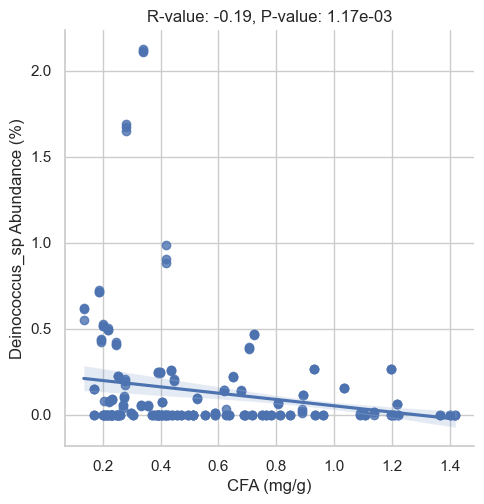

In [464]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats


# Calculate the correlation coefficient and p-value
r_value, p_value = stats.pearsonr(merged_transposed['Deinococcus_sp'], merged_transposed['CFA (mg/g)'])

# Plot the correlation plot with regression line and confidence interval
plt.figure(figsize=(10, 8))
sns.lmplot(x='CFA (mg/g)', y='Deinococcus_sp', data=merged_transposed, ci=95)
plt.title(f'R-value: {r_value:.2f}, P-value: {p_value:.2e}')
plt.ylabel('Deinococcus_sp Abundance (%)')
plt.xlabel('CFA (mg/g)')

# Save the plot as a PNG image
plt.savefig('Deinococcus_CFA.png', format='png', dpi=300, bbox_inches='tight')

plt.show()

<Figure size 1000x800 with 0 Axes>

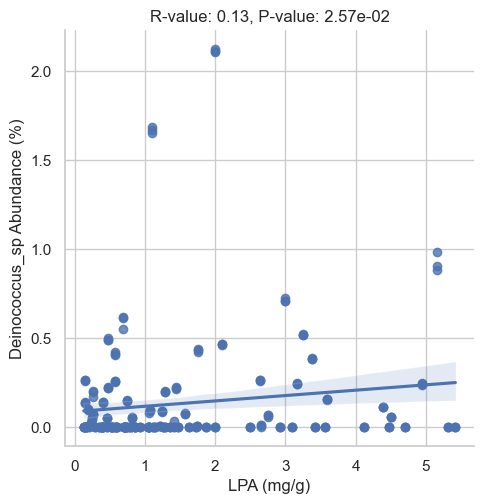

In [466]:
# Calculate the correlation coefficient and p-value
r_value, p_value = stats.pearsonr(merged_transposed['Deinococcus_sp'], merged_transposed['LPA (mg/g)'])

# Plot the correlation plot with regression line and confidence interval
plt.figure(figsize=(10, 8))
sns.lmplot(x='LPA (mg/g)', y='Deinococcus_sp', data=merged_transposed, ci=95)
plt.title(f'R-value: {r_value:.2f}, P-value: {p_value:.2e}')
plt.ylabel('Deinococcus_sp Abundance (%)')
plt.xlabel('LPA (mg/g)')
# Save the plot as a PNG image
plt.savefig('Deinococcus_LPA.png', format='png', dpi=300, bbox_inches='tight')
plt.show()

<Figure size 1000x800 with 0 Axes>

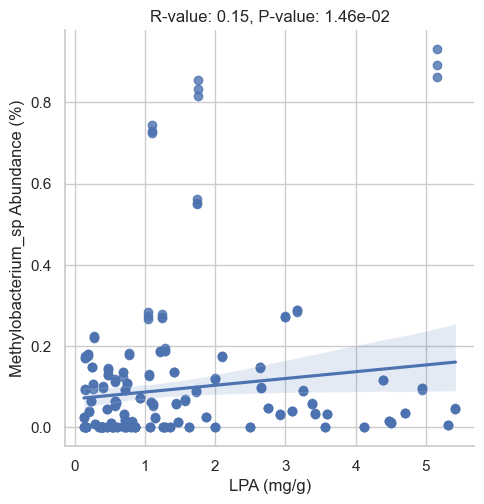

In [468]:
# Calculate the correlation coefficient and p-value
r_value, p_value = stats.pearsonr(merged_transposed['Methylobacterium_sp'], merged_transposed['LPA (mg/g)'])

# Plot the correlation plot with regression line and confidence interval
plt.figure(figsize=(10, 8))
sns.lmplot(x='LPA (mg/g)', y='Methylobacterium_sp', data=merged_transposed, ci=95)
plt.title(f'R-value: {r_value:.2f}, P-value: {p_value:.2e}')
plt.ylabel('Methylobacterium_sp Abundance (%)')
plt.xlabel('LPA (mg/g)')

# Save the plot as a PNG image
plt.savefig('Methylobacterium_LPA.png', format='png', dpi=300, bbox_inches='tight')
plt.show()

<Figure size 1000x800 with 0 Axes>

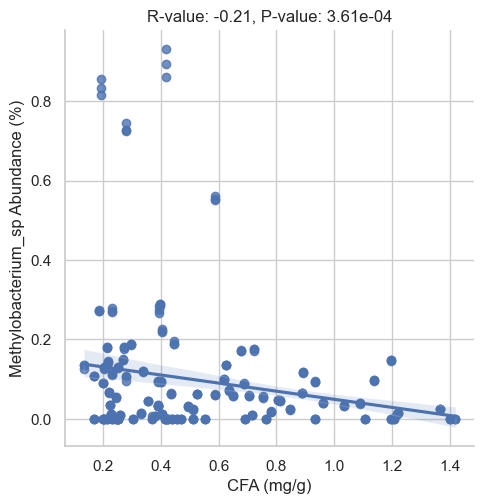

In [470]:
# Calculate the correlation coefficient and p-value
r_value, p_value = stats.pearsonr(merged_transposed['Methylobacterium_sp'], merged_transposed['CFA (mg/g)'])

# Plot the correlation plot with regression line and confidence interval
plt.figure(figsize=(10, 8))
sns.lmplot(x='CFA (mg/g)', y='Methylobacterium_sp', data=merged_transposed, ci=95)
plt.title(f'R-value: {r_value:.2f}, P-value: {p_value:.2e}')
plt.ylabel('Methylobacterium_sp Abundance (%)')
plt.xlabel('CFA (mg/g)')
# Save the plot as a PNG image
plt.savefig('Methylobacterium_CFA.png', format='png', dpi=300, bbox_inches='tight')
plt.show()

<Figure size 1000x800 with 0 Axes>

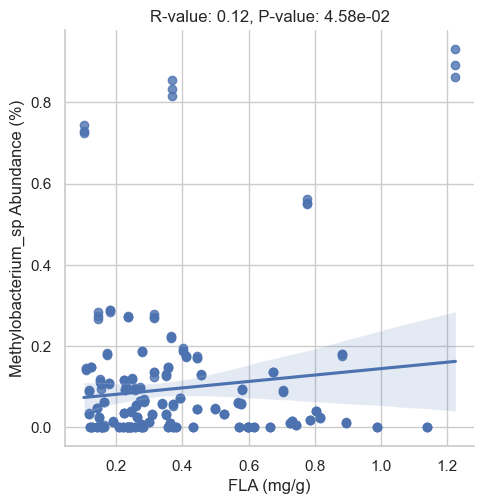

In [472]:
# Calculate the correlation coefficient and p-value
r_value, p_value = stats.pearsonr(merged_transposed['Methylobacterium_sp'], merged_transposed['FLA (mg/g)'])

# Plot the correlation plot with regression line and confidence interval
plt.figure(figsize=(10, 8))
sns.lmplot(x='FLA (mg/g)', y='Methylobacterium_sp', data=merged_transposed, ci=95)
plt.title(f'R-value: {r_value:.2f}, P-value: {p_value:.2e}')
plt.ylabel('Methylobacterium_sp Abundance (%)')
plt.xlabel('FLA (mg/g)')
# Save the plot as a PNG image
plt.savefig('Methylobacterium_FLA.png', format='png', dpi=300, bbox_inches='tight')
plt.show()

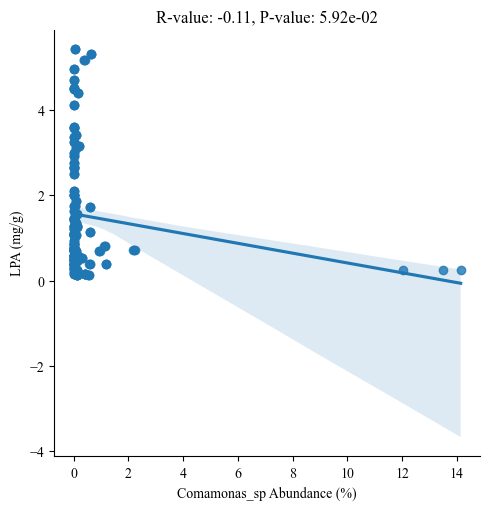

In [408]:
# Calculate the correlation coefficient and p-value
r_value, p_value = stats.pearsonr(merged_transposed['Comamonas_sp'], merged_transposed['LPA (mg/g)'])

# Plot the correlation plot with regression line and confidence interval
sns.lmplot(x='Comamonas_sp', y='LPA (mg/g)', data=merged_transposed, ci=95)
plt.title(f'R-value: {r_value:.2f}, P-value: {p_value:.2e}')
plt.xlabel('Comamonas_sp Abundance (%)')
plt.ylabel('LPA (mg/g)')
plt.show()

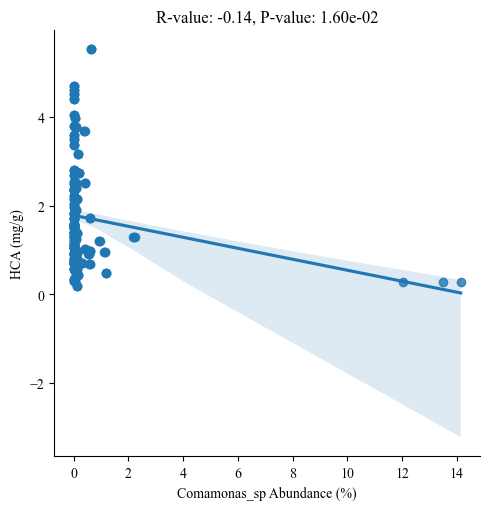

In [409]:
# Calculate the correlation coefficient and p-value
r_value, p_value = stats.pearsonr(merged_transposed['Comamonas_sp'], merged_transposed['HCA (mg/g)'])

# Plot the correlation plot with regression line and confidence interval
sns.lmplot(x='Comamonas_sp', y='HCA (mg/g)', data=merged_transposed, ci=95)
plt.title(f'R-value: {r_value:.2f}, P-value: {p_value:.2e}')
plt.xlabel('Comamonas_sp Abundance (%)')
plt.ylabel('HCA (mg/g)')
plt.show()

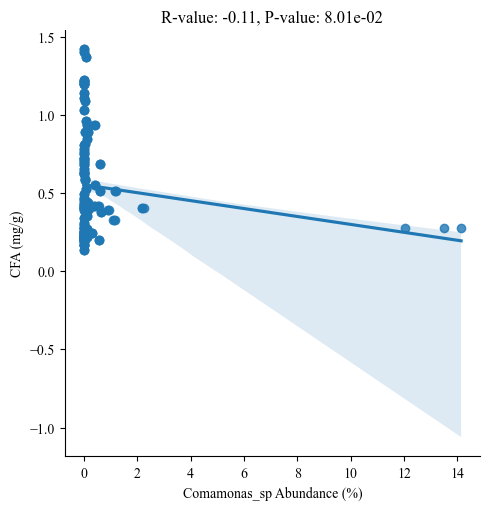

In [410]:
# Calculate the correlation coefficient and p-value
r_value, p_value = stats.pearsonr(merged_transposed['Comamonas_sp'], merged_transposed['CFA (mg/g)'])

# Plot the correlation plot with regression line and confidence interval
sns.lmplot(x='Comamonas_sp', y='CFA (mg/g)', data=merged_transposed, ci=95)
plt.title(f'R-value: {r_value:.2f}, P-value: {p_value:.2e}')
plt.xlabel('Comamonas_sp Abundance (%)')
plt.ylabel('CFA (mg/g)')
plt.show()

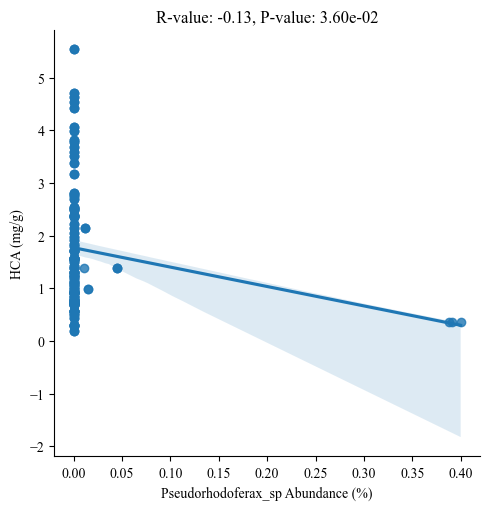

In [411]:
# Calculate the correlation coefficient and p-value
r_value, p_value = stats.pearsonr(merged_transposed['Pseudorhodoferax_sp'], merged_transposed['HCA (mg/g)'])

# Plot the correlation plot with regression line and confidence interval
sns.lmplot(x='Pseudorhodoferax_sp', y='HCA (mg/g)', data=merged_transposed, ci=95)
plt.title(f'R-value: {r_value:.2f}, P-value: {p_value:.2e}')
plt.xlabel('Pseudorhodoferax_sp Abundance (%)')
plt.ylabel('HCA (mg/g)')
plt.show()

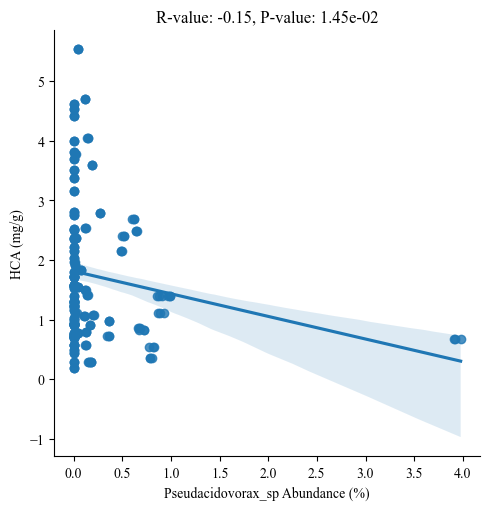

In [412]:
# Calculate the correlation coefficient and p-value
r_value, p_value = stats.pearsonr(merged_transposed['Pseudacidovorax_sp'], merged_transposed['HCA (mg/g)'])

# Plot the correlation plot with regression line and confidence interval
sns.lmplot(x='Pseudacidovorax_sp', y='HCA (mg/g)', data=merged_transposed, ci=95)
plt.title(f'R-value: {r_value:.2f}, P-value: {p_value:.2e}')
plt.xlabel('Pseudacidovorax_sp Abundance (%)')
plt.ylabel('HCA (mg/g)')
plt.show()

In [413]:
numeric_data = merged.select_dtypes(include=[float, int])  # Select only numeric columns

# Step 1: Transpose the DataFrame so that we can calculate correlation between genomes (rows) and lignin precursors (columns)
merged_transpose = numeric_data.T
merged_transpose

,Pseudorhodoferax_sp._ERS6626941,Comamonas_sp._ERS6626650,Methylobacterium_sp._ERS6627288,Deinococcus_sp._ERS6627335,Pseudacidovorax_sp._ERS6627003,Comamonas_sp._ERS6626602,Deinococcus_sp._ERS6627293,Deinococcus_sp._ERS6626820,Pseudacidovorax_sp._ERS6626850,Acidovorax_sp._ERS6627271,...,Pseudacidovorax_sp._ERS6626577,Comamonas_sp._ERS6626630,Microbacterium_sp._ERS6626906,Variovorax_sp._ERS6626779,Variovorax_sp._ERS6627246,HCA (mg/g),LPA (mg/g),FLA (mg/g),CFA (mg/g),SPLT (mg/g)
ERR6050324,0.0,0.000000,0.015295,0.000000,0.007145,0.000000,0.000000,0.000000,0.006779,0.000000,...,0.010318,0.000000,0.015453,0.0,0.000000,4.053818,4.479423,0.732344,1.220339,0.411761
ERR6050325,0.0,0.000000,0.174915,0.044219,0.000000,0.000000,0.050215,0.050547,0.000000,0.000000,...,0.000000,0.000000,0.072359,0.0,0.000000,1.297702,2.090554,0.410551,0.723277,0.197954
ERR6050326,0.0,0.000000,0.130110,0.030060,0.075032,0.000000,0.035924,0.036680,0.075649,0.000000,...,0.076848,0.000000,0.000000,0.0,0.015025,0.678492,0.477110,0.455427,0.252706,0.258504
ERR6050327,0.0,0.070546,0.091941,0.000000,0.000000,1.488315,0.000000,0.000000,0.000000,1.459407,...,0.000000,0.104523,0.000000,0.0,0.000000,1.302806,0.709766,0.227444,0.401645,0.153333
ERR6050331,0.0,0.000000,0.000000,0.000000,0.000000,0.136045,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.038952,0.000000,0.0,0.000000,0.909263,0.129872,0.280427,0.418336,0.535029
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ERR6050641,0.0,0.011315,0.000000,0.000000,0.000000,0.131751,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.040988,0.000000,0.0,0.000000,2.511995,0.160128,0.209199,0.933898,0.506914
ERR6050644,0.0,0.000000,0.024904,0.000000,0.000000,0.017999,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.0,0.000000,2.521238,1.865643,0.261919,1.367797,0.520993
ERR6050645,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.0,0.000000,4.626686,3.564500,0.614837,1.401695,0.397074
ERR6050648,0.0,0.000000,0.135822,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.0,0.000000,1.975501,1.414824,0.673685,0.626982,0.447429


In [414]:
merged_transpose.isnull().any()

Pseudorhodoferax_sp._ERS6626941          False
Comamonas_sp._ERS6626650                 False
Methylobacterium_sp._ERS6627288          False
Deinococcus_sp._ERS6627335               False
Pseudacidovorax_sp._ERS6627003           False
Comamonas_sp._ERS6626602                 False
Deinococcus_sp._ERS6627293               False
Deinococcus_sp._ERS6626820               False
Pseudacidovorax_sp._ERS6626850           False
Acidovorax_sp._ERS6627271                False
Aureimonas_sp._ERS6627306                False
Burkholderiaceae_bacterium_ERS6626861    False
Deinococcus_sp._ERS6626837               False
Deinococcus_sp._ERS6626811               False
Comamonas_sp._ERS6627283                 False
Deinococcus_sp._ERS6626797               False
Pseudacidovorax_sp._ERS6626909           False
Pseudacidovorax_sp._ERS6627321           False
Pseudacidovorax_sp._ERS6627320           False
Deinococcus_sp._ERS6627282               False
Pseudacidovorax_sp._ERS6626577           False
Comamonas_sp.

In [415]:
merged_transpose.to_csv('coxl_lignin_precursor.csv')

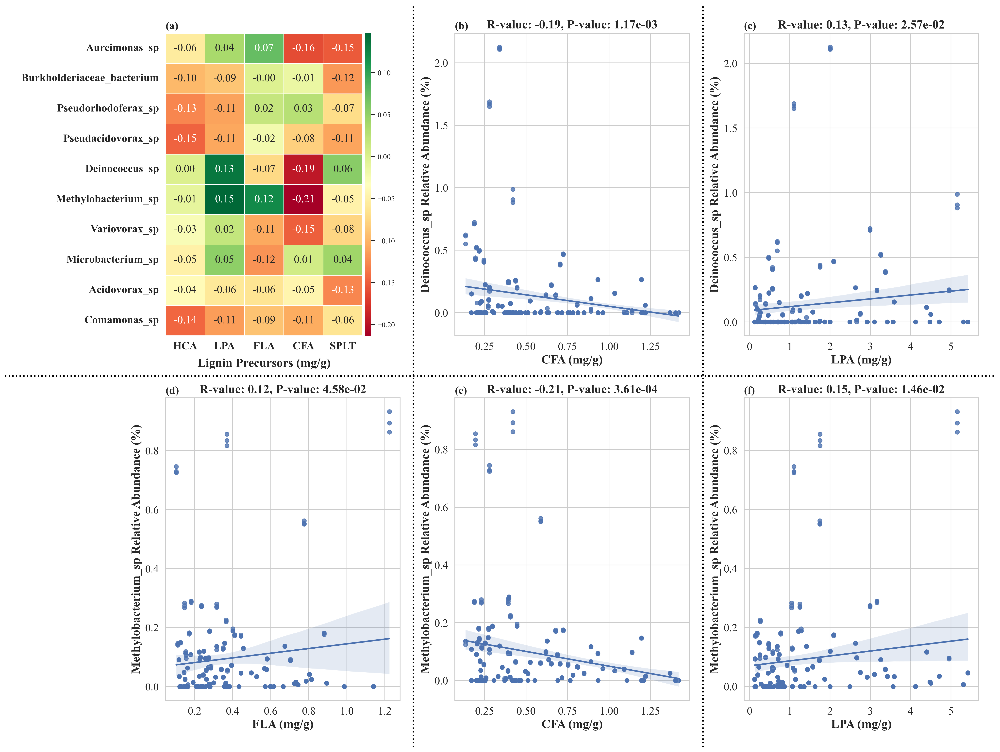

In [552]:
## Plot heat map and the highlighed correlation of Deinococcus sp. and Methylobacterium sp. correlations in one plot
# Assuming merged_sum is already defined and contains the necessary data
numeric_data = merged_sum.select_dtypes(include=[float, int])  # Select only numeric columns

# Step 1: Transpose the DataFrame so that we can calculate correlation between genomes (rows) and lignin precursors (columns)
merged_transposed = numeric_data.T  # Transpose to have rows as metagenomes and columns as genomic or lignin data
merged_transposed = merged_transposed.iloc[:-1]

# Step 2: Compute the correlation matrix
correlation_matrix = merged_transposed.corr()

# Step 3: Assuming you have two sets of columns (genome abundance and lignin precursors)
#  the first 25 rows are genome abundances and the last 5 rows are lignin precursors

# Extract genome abundance columns (first 10)
genome_columns = merged_transposed.columns[:10]

# Extract lignin precursor columns (last 5)
lignin_columns = merged_transposed.columns[-5:]

# Step 4: Compute correlation between genome abundance and lignin precursors
correlations = correlation_matrix.loc[genome_columns, lignin_columns]


# Set font to Times New Roman
plt.rcParams['font.family'] = 'Times New Roman'

# Create a figure with a 2x3 grid of subplots
fig, axes = plt.subplots(2, 3, figsize=(20, 15), dpi=300)

# Plot the heatmap in the first subplot
sns.heatmap(correlations, annot=True, cmap='RdYlGn', fmt='.2f', linewidths=0.5, cbar_kws={'aspect': 50, 'pad': 0.01}, 
            annot_kws={'size': 16}, ax=axes[0, 0])
axes[0, 0].set_title('(a)', fontsize=16, fontweight='bold', loc='left')
axes[0, 0].set_xlabel('Lignin Precursors (mg/g)', fontsize=18, fontweight='bold', labelpad=10)
# trim the (mg/g) in the x_ticks to keep them tidy
trimmed_labels = [label.get_text()[:-7] for label in axes[0, 0].get_xticklabels()]
# Apply the changes
axes[0, 0].set_xticklabels(trimmed_labels, rotation=0, fontsize=16, fontweight='bold')
axes[0, 0].tick_params(axis='y', labelsize=16)
for label in axes[0, 0].get_yticklabels():
    label.set_fontweight('bold')


# Define the pairs for correlation plots
pairs = [
    ('Deinococcus_sp', 'CFA (mg/g)', '(b)'),
    ('Deinococcus_sp', 'LPA (mg/g)', '(c)'),
    ('Methylobacterium_sp', 'FLA (mg/g)', '(d)'),
    ('Methylobacterium_sp', 'CFA (mg/g)', '(e)'),
    ('Methylobacterium_sp', 'LPA (mg/g)', '(f)')
]

# Plot the correlation plots in the remaining subplots
for i, (x_col, y_col, title) in enumerate(pairs):
    row = (i + 1) // 3
    col = (i + 1) % 3
    
    r_value, p_value = stats.pearsonr(merged_transposed[x_col], merged_transposed[y_col])
    
    sns.regplot(x=y_col, y=x_col, data=merged_transposed, ci=95, ax=axes[row, col])
    axes[row, col].set_title(title, fontsize=16, fontweight='bold', loc='left')
    axes[row, col].set_xlabel(y_col, fontsize=18, fontweight='bold')
    axes[row, col].set_ylabel(f'{x_col} Relative Abundance (%)', fontsize=18, fontweight='bold')
    axes[row, col].tick_params(labelsize=16)
    axes[row, col].text(0.5, 1.025, f'R-value: {r_value:.2f}, P-value: {p_value:.2e}', fontsize=18, fontweight='bold',
                        ha='center', va='center', transform=axes[row, col].transAxes)

# Adjust layout to prevent overlap
plt.tight_layout(pad=2, w_pad=2, h_pad=2)
# Get figure dimensions to draw dotted lines between subplots
fig_width, fig_height = fig.get_size_inches()
fig_w_px, fig_h_px = fig.dpi * fig_width, fig.dpi * fig_height

# Draw dotted lines to separate columns (vertical lines)
custom_x_positions = [0.4125, 0.705]

for x in custom_x_positions:
    fig.add_artist(plt.Line2D([x, x], [0, 1], transform=fig.transFigure,
                              color='black', linestyle=':', linewidth=2))

# Draw dotted lines to separate rows (horizontal line)
fig.add_artist(plt.Line2D([0, 1], [0.5, 0.5], transform=fig.transFigure, color='black', linestyle=':', linewidth=2))


# Save the figure as a PNG image
plt.savefig('combined_correlation_plots.png', format='png', dpi=300, bbox_inches='tight')

# Display the figure
plt.show()